Menggabungkan Data Overview + Visualization + Data Preprocessing + Modeling

Version 1 : https://colab.research.google.com/drive/1y46NTvT-_4Awdotzk1Ayyx90dnp4cdW8#scrollTo=MLK15PZ6tvrq (Raw Project) <br>
Version 2 : **CURRENTLY HERE** (Exploring preprocessing + New algoritm) <br>
Version 3 : (Explore with/without Feature engineering + Encoding)

# Import Data

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

from sklearn.linear_model import LinearRegression

import statsmodels.api as sm

%matplotlib inline

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import RandomOverSampler

In [ ]:
filepath = 'https://raw.githubusercontent.com/Pieter414/BCCInternProject/main/shopping_behavior_updated.csv'

data = pd.read_csv(filepath, delimiter=',')

# Data Understanding

Tujuan Exploratory Data Analysis (EDA)


1. Memahami Data

2. Identifikasi Anomali

3. Identifikasi Pola dan Tren

4. Eksplorasi Hubungan

- Measure of Central Tendency: mean, median, modus
- Measure of Spread: variabilitas, varian, standar deviasi
- Measure of Distribution: skewness dan kurtosis

## Penjelasan Kolom

**About Dataset**

> Context:
The Consumer Behavior and Shopping Habits Dataset provides comprehensive insights into consumers' preferences, tendencies, and patterns during their shopping experiences. This dataset encompasses a diverse range of variables, including demographic information, purchase history, product preferences, shopping frequency, and online/offline shopping behavior. With this rich collection of data, analysts and researchers can delve into the intricacies of consumer decision-making processes, aiding businesses in crafting targeted marketing strategies, optimizing product offerings, and enhancing overall customer satisfaction. This dataset is essential for businesses aiming to tailor their strategies to meet customer needs and enhance their shopping experience, ultimately driving sales and loyalty.

**Dataset Glossary (Column-wise)**

> `Customer ID`: A unique identifier assigned to each individual customer, facilitating tracking and analysis of their shopping behavior over time.

> `Age`: The age of the customer, providing demographic information for segmentation and targeted marketing strategies.

> `Gender`: The gender identification of the customer, a key demographic variable influencing product preferences and purchasing patterns.

> `Item Purchased`: The specific product or item selected by the customer during the transaction.

> `Category`: The broad classification or group to which the purchased item belongs (e.g., clothing, electronics, groceries).

> `Purchase Amount (USD)`: The monetary value of the transaction, denoted in United States Dollars (USD), indicates the cost of the purchased item(s).

> `Location`: The geographical location where the purchase was made, offering insights into regional preferences and market trends.

> `Size`: The size specification (if applicable) of the purchased item, relevant for apparel, footwear, and certain consumer goods.

> `Color`: The color variant or choice associated with the purchased item, influencing customer preferences and product availability.

> `Season`: The seasonal relevance of the purchased item (e.g., spring, summer, fall, winter), impacting inventory management and marketing strategies.

> `Review Rating`: A numerical or qualitative assessment provided by the customer regarding their satisfaction with the purchased item.

> `Subscription Status`: Indicates whether the customer has opted for a subscription service, offering insights into their level of loyalty and potential for recurring revenue.

> `Shipping Type`: Specifies the method used to deliver the purchased item (e.g., standard shipping, express delivery), influencing delivery times and costs.

> `Discount Applied`: Indicates if any promotional discounts were applied to the purchase, shedding light on price sensitivity and promotion effectiveness.

> `Promo Code Used`: Notes whether a promotional code or coupon was utilized during the transaction, aiding in the evaluation of marketing campaign success.

> `Previous Purchases`: Provides information on the number or frequency of prior purchases made by the customer, contributing to customer segmentation and retention strategies.

> `Payment Method`: Specifies the mode of payment employed by the customer (e.g., credit card, cash), offering insights into preferred payment options.

> `Frequency of Purchases`: Indicates how often the customer engages in purchasing activities, a critical metric for assessing customer loyalty and lifetime value.

## Data overview

In [ ]:
data.head(10)

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly
3,4,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly
4,5,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually
5,6,46,Male,Sneakers,Footwear,20,Wyoming,M,White,Summer,2.9,Yes,Standard,Yes,Yes,14,Venmo,Weekly
6,7,63,Male,Shirt,Clothing,85,Montana,M,Gray,Fall,3.2,Yes,Free Shipping,Yes,Yes,49,Cash,Quarterly
7,8,27,Male,Shorts,Clothing,34,Louisiana,L,Charcoal,Winter,3.2,Yes,Free Shipping,Yes,Yes,19,Credit Card,Weekly
8,9,26,Male,Coat,Outerwear,97,West Virginia,L,Silver,Summer,2.6,Yes,Express,Yes,Yes,8,Venmo,Annually
9,10,57,Male,Handbag,Accessories,31,Missouri,M,Pink,Spring,4.8,Yes,2-Day Shipping,Yes,Yes,4,Cash,Quarterly


In [ ]:
data.tail(10)

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
3890,3891,35,Female,Shirt,Clothing,81,Nebraska,XL,Green,Winter,2.6,No,Standard,No,No,33,Debit Card,Annually
3891,3892,36,Female,Dress,Clothing,30,Colorado,L,Peach,Winter,4.7,No,Free Shipping,No,No,6,Bank Transfer,Quarterly
3892,3893,35,Female,Jewelry,Accessories,86,Michigan,L,Indigo,Summer,3.5,No,Standard,No,No,5,PayPal,Fortnightly
3893,3894,21,Female,Hat,Accessories,64,Massachusetts,L,White,Fall,3.3,No,Store Pickup,No,No,29,Bank Transfer,Bi-Weekly
3894,3895,66,Female,Skirt,Clothing,78,Connecticut,L,White,Spring,3.9,No,2-Day Shipping,No,No,44,Credit Card,Every 3 Months
3895,3896,40,Female,Hoodie,Clothing,28,Virginia,L,Turquoise,Summer,4.2,No,2-Day Shipping,No,No,32,Venmo,Weekly
3896,3897,52,Female,Backpack,Accessories,49,Iowa,L,White,Spring,4.5,No,Store Pickup,No,No,41,Bank Transfer,Bi-Weekly
3897,3898,46,Female,Belt,Accessories,33,New Jersey,L,Green,Spring,2.9,No,Standard,No,No,24,Venmo,Quarterly
3898,3899,44,Female,Shoes,Footwear,77,Minnesota,S,Brown,Summer,3.8,No,Express,No,No,24,Venmo,Weekly
3899,3900,52,Female,Handbag,Accessories,81,California,M,Beige,Spring,3.1,No,Store Pickup,No,No,33,Venmo,Quarterly


In [ ]:
data.shape

(3900, 18)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Customer ID             3900 non-null   int64  
 1   Age                     3900 non-null   int64  
 2   Gender                  3900 non-null   object 
 3   Item Purchased          3900 non-null   object 
 4   Category                3900 non-null   object 
 5   Purchase Amount (USD)   3900 non-null   int64  
 6   Location                3900 non-null   object 
 7   Size                    3900 non-null   object 
 8   Color                   3900 non-null   object 
 9   Season                  3900 non-null   object 
 10  Review Rating           3900 non-null   float64
 11  Subscription Status     3900 non-null   object 
 12  Shipping Type           3900 non-null   object 
 13  Discount Applied        3900 non-null   object 
 14  Promo Code Used         3900 non-null   

In [ ]:
data.describe()

,Customer ID,Age,Purchase Amount (USD),Review Rating,Previous Purchases
count,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000
mean,1950.500000,44.068462,59.764359,3.749949,25.351538
std,1125.977353,15.207589,23.685392,0.716223,14.447125
min,1.000000,18.000000,20.000000,2.500000,1.000000
25%,975.750000,31.000000,39.000000,3.100000,13.000000
50%,1950.500000,44.000000,60.000000,3.700000,25.000000
75%,2925.250000,57.000000,81.000000,4.400000,38.000000
max,3900.000000,70.000000,100.000000,5.000000,50.000000


In [ ]:
data.describe(include="all")

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
count,3900.000000,3900.000000,3900,3900,3900,3900.000000,3900,3900,3900,3900,3900.000000,3900,3900,3900,3900,3900.000000,3900,3900
unique,NaN,NaN,2,25,4,NaN,50,4,25,4,NaN,2,6,2,2,NaN,6,7
top,NaN,NaN,Male,Blouse,Clothing,NaN,Montana,M,Olive,Spring,NaN,No,Free Shipping,No,No,NaN,PayPal,Every 3 Months
freq,NaN,NaN,2652,171,1737,NaN,96,1755,177,999,NaN,2847,675,2223,2223,NaN,677,584
mean,1950.500000,44.068462,NaN,NaN,NaN,59.764359,NaN,NaN,NaN,NaN,3.749949,NaN,NaN,NaN,NaN,25.351538,NaN,NaN
std,1125.977353,15.207589,NaN,NaN,NaN,23.685392,NaN,NaN,NaN,NaN,0.716223,NaN,NaN,NaN,NaN,14.447125,NaN,NaN
min,1.000000,18.000000,NaN,NaN,NaN,20.000000,NaN,NaN,NaN,NaN,2.500000,NaN,NaN,NaN,NaN,1.000000,NaN,NaN
25%,975.750000,31.000000,NaN,NaN,NaN,39.000000,NaN,NaN,NaN,NaN,3.100000,NaN,NaN,NaN,NaN,13.000000,NaN,NaN
50%,1950.500000,44.000000,NaN,NaN,NaN,60.000000,NaN,NaN,NaN,NaN,3.700000,NaN,NaN,NaN,NaN,25.000000,NaN,NaN
75%,2925.250000,57.000000,NaN,NaN,NaN,81.000000,NaN,NaN,NaN,NaN,4.400000,NaN,NaN,NaN,NaN,38.000000,NaN,NaN


In [ ]:
data.isna().sum()

Customer ID               0
Age                       0
Gender                    0
Item Purchased            0
Category                  0
Purchase Amount (USD)     0
Location                  0
Size                      0
Color                     0
Season                    0
Review Rating             0
Subscription Status       0
Shipping Type             0
Discount Applied          0
Promo Code Used           0
Previous Purchases        0
Payment Method            0
Frequency of Purchases    0
dtype: int64

## Analisis Value Counts (Persebaran Data)

Pertama, ambil terlebih dahulu semua kolom object

In [ ]:
def show_value_count(data, label):
  value_count = data[label].value_counts()

  print(f"\nPersebaran dari kolom {label}: \n{value_count}")

In [ ]:
column_types = data.dtypes
object_columns = column_types[column_types == 'object'].index.tolist()

object_columns

['Gender',
 'Item Purchased',
 'Category',
 'Location',
 'Size',
 'Color',
 'Season',
 'Subscription Status',
 'Shipping Type',
 'Discount Applied',
 'Promo Code Used',
 'Payment Method',
 'Frequency of Purchases']

In [ ]:
integer_columns = column_types[column_types == 'int64'].index.tolist()
integer_columns

['Customer ID', 'Age', 'Purchase Amount (USD)', 'Previous Purchases']

In [ ]:
float_columns = column_types[column_types == 'float64'].index.tolist()
float_columns

['Review Rating']

In [ ]:
show_value_count(data, 'Item Purchased')


Persebaran dari kolom Item Purchased: 
Blouse        171
Jewelry       171
Pants         171
Shirt         169
Dress         166
Sweater       164
Jacket        163
Belt          161
Sunglasses    161
Coat          161
Sandals       160
Socks         159
Skirt         158
Shorts        157
Scarf         157
Hat           154
Handbag       153
Hoodie        151
Shoes         150
T-shirt       147
Sneakers      145
Boots         144
Backpack      143
Gloves        140
Jeans         124
Name: Item Purchased, dtype: int64


In [ ]:
for column in object_columns:
  show_value_count(data, column)


Persebaran dari kolom Gender: 
Male      2652
Female    1248
Name: Gender, dtype: int64

Persebaran dari kolom Item Purchased: 
Blouse        171
Jewelry       171
Pants         171
Shirt         169
Dress         166
Sweater       164
Jacket        163
Belt          161
Sunglasses    161
Coat          161
Sandals       160
Socks         159
Skirt         158
Shorts        157
Scarf         157
Hat           154
Handbag       153
Hoodie        151
Shoes         150
T-shirt       147
Sneakers      145
Boots         144
Backpack      143
Gloves        140
Jeans         124
Name: Item Purchased, dtype: int64

Persebaran dari kolom Category: 
Clothing       1737
Accessories    1240
Footwear        599
Outerwear       324
Name: Category, dtype: int64

Persebaran dari kolom Location: 
Montana           96
California        95
Idaho             93
Illinois          92
Alabama           89
Minnesota         88
Nebraska          87
New York          87
Nevada            87
Maryland          86

In [ ]:
for column in float_columns:
  show_value_count(data, column)


Persebaran dari kolom Review Rating: 
3.4    182
4.0    181
4.6    174
4.2    171
2.9    170
4.9    166
3.9    163
3.0    162
2.6    159
4.4    158
3.1    157
3.7    156
3.5    156
2.7    154
3.3    152
3.2    152
3.6    149
4.7    148
4.1    148
4.3    147
4.8    144
3.8    142
4.5    139
2.8    136
5.0     68
2.5     66
Name: Review Rating, dtype: int64


In [ ]:
for column in integer_columns:
  show_value_count(data, column)


Persebaran dari kolom Customer ID: 
1       1
2621    1
2593    1
2594    1
2595    1
       ..
1305    1
1306    1
1307    1
1308    1
3900    1
Name: Customer ID, Length: 3900, dtype: int64

Persebaran dari kolom Age: 
69    88
57    87
41    86
25    85
49    84
50    83
54    83
27    83
62    83
32    82
19    81
58    81
42    80
43    79
28    79
31    79
37    77
46    76
29    76
68    75
59    75
63    75
56    74
36    74
55    73
52    73
64    73
35    72
51    72
65    72
40    72
45    72
47    71
66    71
30    71
23    71
38    70
53    70
18    69
21    69
26    69
34    68
48    68
24    68
39    68
70    67
22    66
61    65
60    65
33    63
20    62
67    54
44    51
Name: Age, dtype: int64

Persebaran dari kolom Purchase Amount (USD): 
94     62
32     62
36     62
51     61
90     60
       ..
100    36
87     35
49     35
69     34
61     33
Name: Purchase Amount (USD), Length: 81, dtype: int64

Persebaran dari kolom Previous Purchases: 
31    97
21    96
14  

## Missing Values

In [ ]:
data.isna().sum()

Customer ID               0
Age                       0
Gender                    0
Item Purchased            0
Category                  0
Purchase Amount (USD)     0
Location                  0
Size                      0
Color                     0
Season                    0
Review Rating             0
Subscription Status       0
Shipping Type             0
Discount Applied          0
Promo Code Used           0
Previous Purchases        0
Payment Method            0
Frequency of Purchases    0
dtype: int64

Disimpulkan bahwa dataset ini tidak memiliki missing value di kolom manapun

## Duplicated values

In [ ]:
data.duplicated().sum()

0

In [ ]:
duplicate_without_id = (data.drop(columns=["Customer ID"]))
duplicate_without_id.duplicated().sum()

0

In [ ]:
data[data.duplicated()]

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases


In [ ]:
duplicate_without_id[duplicate_without_id.duplicated()]

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases


Dari diatas, ditemukan bahwa tidak ada data yang duplikat. Bahkan setelah mengecek data tanpa Customer ID, ditemukan tidak ada duplikat

# Business Question / Insight

SMART Method

- Specific
- Measurable
- Action Oriented
- Relevant
- Time Bound

Business Insights

1. Spesific :
2. Measurable :
3. Action Oriented
4. Relevant :
5. Time Bound : This project final presentation are in 23 March 2024

Business Questions:

1. Bagaimana customer habits and behavior berdasarkan wilayah regional mereka (Dalam Amerika Serikat)

# Pre Visualization and Analysis

Creating numerical data, categorical data and creating new column that maybe be usefull

## Num Data

In [ ]:
num_data = data.filter(integer_columns+float_columns)
num_data.head()

,Customer ID,Age,Purchase Amount (USD),Previous Purchases,Review Rating
0,1,55,53,14,3.1
1,2,19,64,2,3.1
2,3,50,73,23,3.1
3,4,21,90,49,3.5
4,5,45,49,31,2.7


## Region Grouping

In [ ]:
regions = {
    'New England': ['Connecticut', 'Maine', 'Massachusetts', 'New Hampshire', 'Rhode Island', 'Vermont'],
    'Mideast': ['Delaware', 'District of Columbia', 'Maryland', 'New Jersey', 'New York', 'Pennsylvania'],
    'Great Lakes': ['Illinois', 'Indiana', 'Michigan', 'Ohio', 'Wisconsin'],
    'Plains': ['Iowa', 'Kansas', 'Minnesota', 'Missouri', 'Nebraska', 'North Dakota', 'South Dakota'],
    'Southeast': ['Alabama', 'Arkansas', 'Florida', 'Georgia', 'Kentucky', 'Louisiana', 'Mississippi', 'North Carolina', 'South Carolina', 'Tennessee', 'Virginia', 'West Virginia'],
    'Southwest': ['Arizona', 'New Mexico', 'Oklahoma', 'Texas'],
    'Rocky Mountain': ['Colorado', 'Idaho', 'Montana', 'Utah', 'Wyoming'],
    'Far West': ['Alaska', 'California', 'Hawaii', 'Nevada', 'Oregon', 'Washington']
}

In [ ]:
# Fungsi untuk menentukan region
def get_region(state):
    for region, states in regions.items():
        if state in states:
            return region
    return 'Unknown'

In [ ]:
# Menambahkan kolom region ke dataframe
data['Region'] = data['Location'].apply(get_region)

data.head()

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,Southeast
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,New England
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,New England
3,4,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,New England
4,5,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,Far West


In [ ]:
data.to_csv('data.csv', index=False)

In [ ]:
data["Region"].value_counts()

Southeast         947
Plains            541
Far West          466
New England       446
Rocky Mountain    406
Mideast           400
Great Lakes       396
Southwest         298
Name: Region, dtype: int64

In [ ]:
column_types = data.dtypes
object_columns = column_types[column_types == 'object'].index.tolist()

object_columns

['Gender',
 'Item Purchased',
 'Category',
 'Location',
 'Size',
 'Color',
 'Season',
 'Subscription Status',
 'Shipping Type',
 'Discount Applied',
 'Promo Code Used',
 'Payment Method',
 'Frequency of Purchases',
 'Region']

In [ ]:
category_data = data.filter(object_columns)
category_data.head()

,Gender,Item Purchased,Category,Location,Size,Color,Season,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Payment Method,Frequency of Purchases,Region
0,Male,Blouse,Clothing,Kentucky,L,Gray,Winter,Yes,Express,Yes,Yes,Venmo,Fortnightly,Southeast
1,Male,Sweater,Clothing,Maine,L,Maroon,Winter,Yes,Express,Yes,Yes,Cash,Fortnightly,New England
2,Male,Jeans,Clothing,Massachusetts,S,Maroon,Spring,Yes,Free Shipping,Yes,Yes,Credit Card,Weekly,New England
3,Male,Sandals,Footwear,Rhode Island,M,Maroon,Spring,Yes,Next Day Air,Yes,Yes,PayPal,Weekly,New England
4,Male,Blouse,Clothing,Oregon,M,Turquoise,Spring,Yes,Free Shipping,Yes,Yes,PayPal,Annually,Far West


## Age Grouping

In [ ]:
# Define a function to classify age groups
def classify_age_group(age):
  if age <= 19:
      return 'Teenager'
  elif 20 <= age <= 30:
      return 'Young_Adult'
  elif 31 <= age <= 44:
      return 'Adult'
  elif 45 <= age <= 59:
      return 'Middle_Age'
  else:
      return 'Elder'

In [ ]:
# Define a function to classify age groups
def classify_birth_year_group(age):
  birth_year = 2024 - age
  if birth_year >= 2013:
      return 'Gen Alpha'
  elif 1995 <= birth_year <= 2012:
      return 'Gen Z'
  elif 1980 <= birth_year <= 1994:
      return 'Millenials'
  elif 1965 <= birth_year <= 1979:
      return 'Gen X'
  else:
      return 'Baby Boomer'

# Apply the function to create a new column 'Age_group'
data['Age Group'] = data['Age'].apply(classify_age_group)
# Apply the function to create a new column 'Age_group'
data['Generation'] = data['Age'].apply(classify_birth_year_group)

In [ ]:
data.head()

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,...,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group,Generation
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,...,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,Southeast,Middle_Age,Gen X
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,...,Yes,Express,Yes,Yes,2,Cash,Fortnightly,New England,Teenager,Gen Z
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,...,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,New England,Middle_Age,Gen X
3,4,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,...,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,New England,Young_Adult,Gen Z
4,5,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,...,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,Far West,Middle_Age,Gen X


In [ ]:
data["Age Group"].value_counts()

Middle_Age     1142
Adult          1021
Young_Adult     799
Elder           788
Teenager        150
Name: Age Group, dtype: int64

In [ ]:
data["Generation"].value_counts()

Gen X          1142
Millenials     1092
Gen Z           878
Baby Boomer     788
Name: Generation, dtype: int64

# EDA (Explorative Data Analysis)

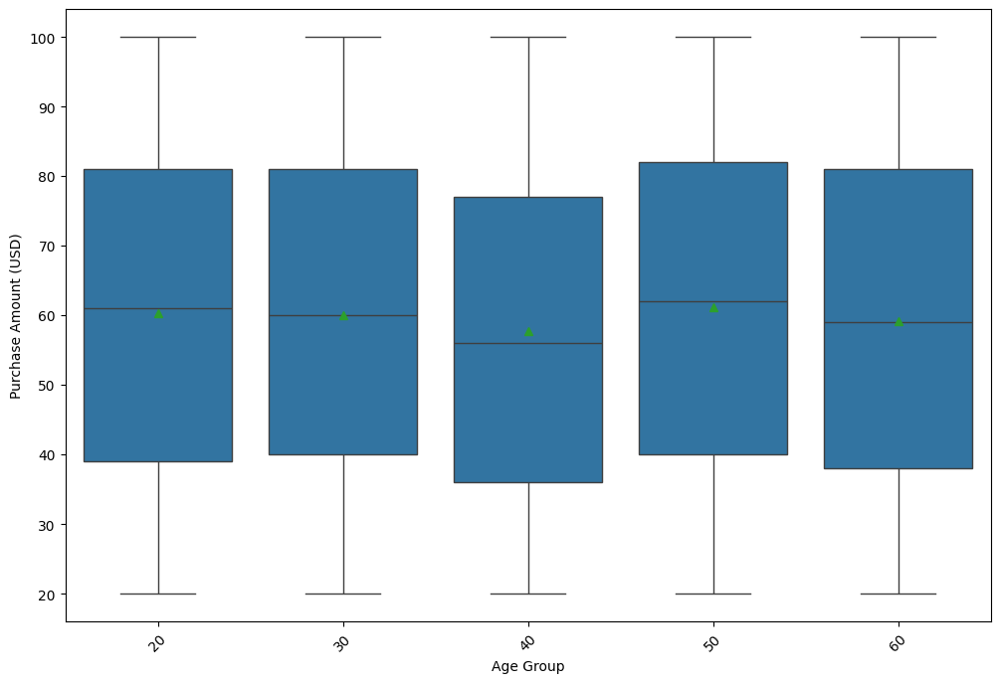

In [ ]:
data['Age Group'] = pd.cut(data['Age'], bins = range(18, 72, 10), labels = range(20, 70, 10))

plt.figure(figsize=(12, 8))
sns.boxplot(data = data, x = "Age Group", y = "Purchase Amount (USD)", showmeans = True)

plt.xticks(rotation = 45)
plt.show()

In [ ]:
data["Age Group"].value_counts()

Middle_Age     1142
Adult          1021
Young_Adult     799
Elder           788
Teenager        150
Name: Age Group, dtype: int64

## Mengecek kolom numerik akan outlier, median, kuartil dan lainnya (Box plot)

In [ ]:
def boxplot_of_purchase(obj_column, int_column="Purchase Amount (USD)", title=""):
  plt.figure(figsize=(12, 8))
  sns.set(style="darkgrid")
  ax = sns.boxplot(y=obj_column, x=int_column, data=data, palette="Set1")
  plt.title(title, fontsize=16)
  plt.show()

<ipython-input-461-27f8dd03a35d>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(y=obj_column, x=int_column, data=data, palette="Set1")


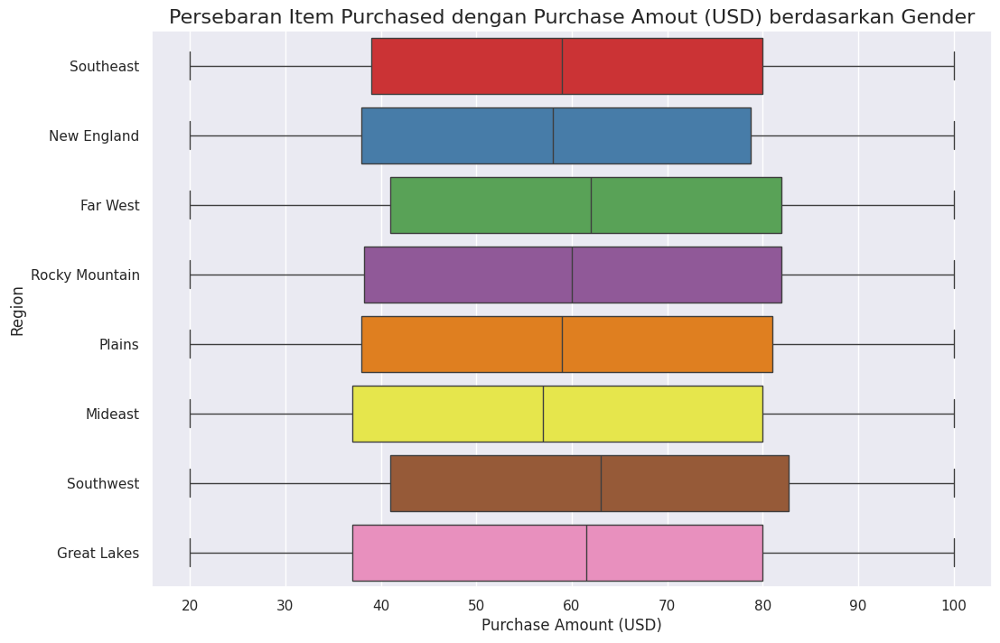

In [ ]:
for column in ["Region"]:
  boxplot_of_purchase(column, title="Persebaran Item Purchased dengan Purchase Amout (USD) berdasarkan Gender")

<ipython-input-461-27f8dd03a35d>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(y=obj_column, x=int_column, data=data, palette="Set1")


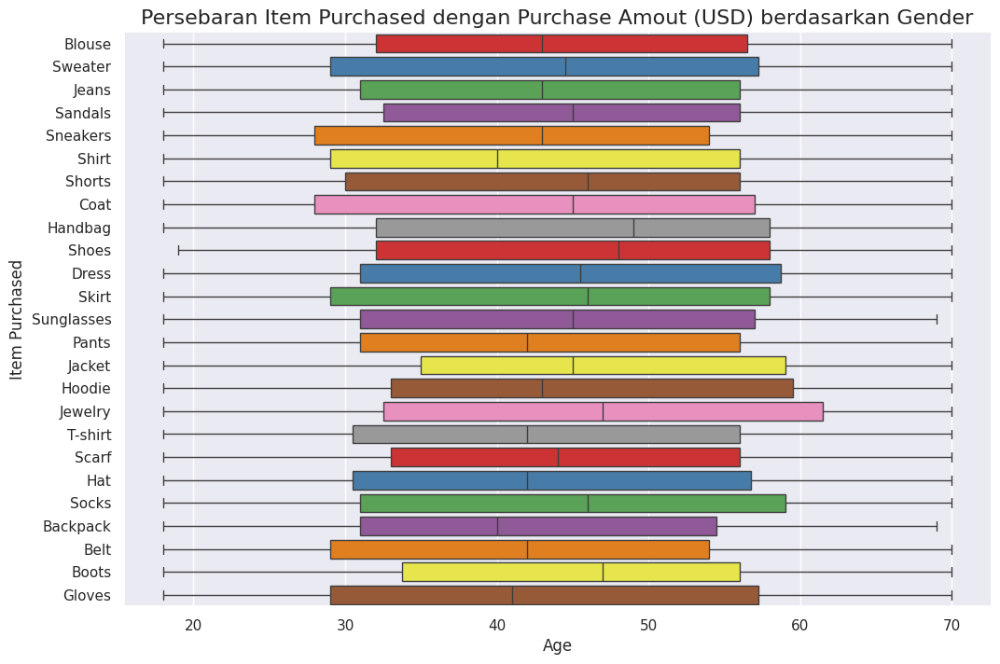

In [ ]:
for column in ["Item Purchased"]:
  boxplot_of_purchase(column, "Age", title="Persebaran Item Purchased dengan Purchase Amout (USD) berdasarkan Gender")

<ipython-input-461-27f8dd03a35d>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(y=obj_column, x=int_column, data=data, palette="Set1")


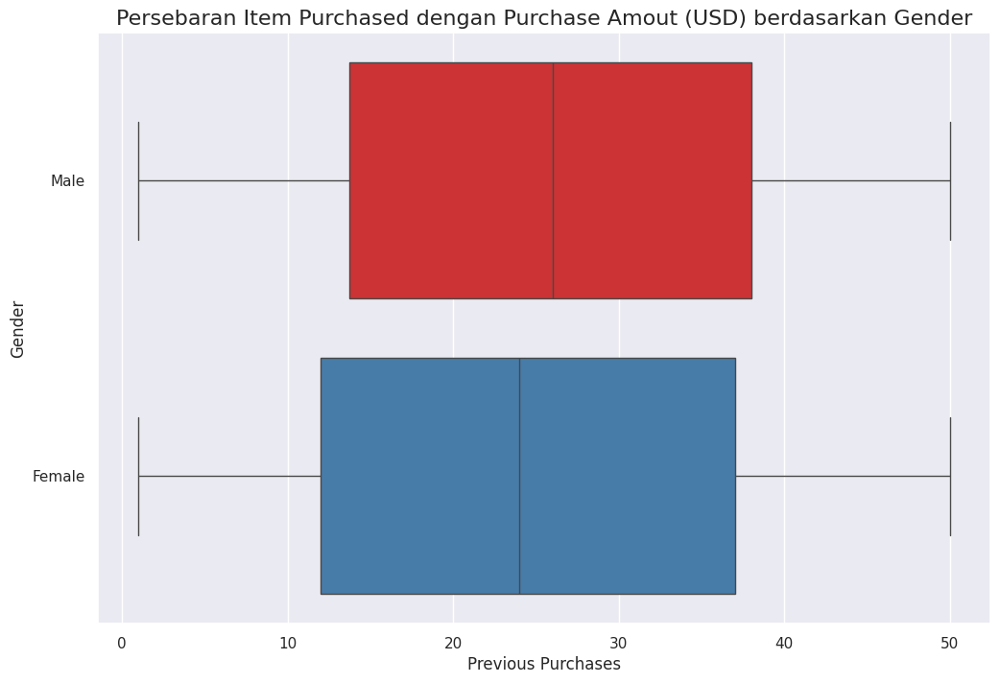

In [ ]:
for column in ["Gender"]:
  boxplot_of_purchase(column, "Previous Purchases", title="Persebaran Item Purchased dengan Purchase Amout (USD) berdasarkan Gender")

## Distribusi kolom numerik yang diklasifikasi berdasarkan Gender

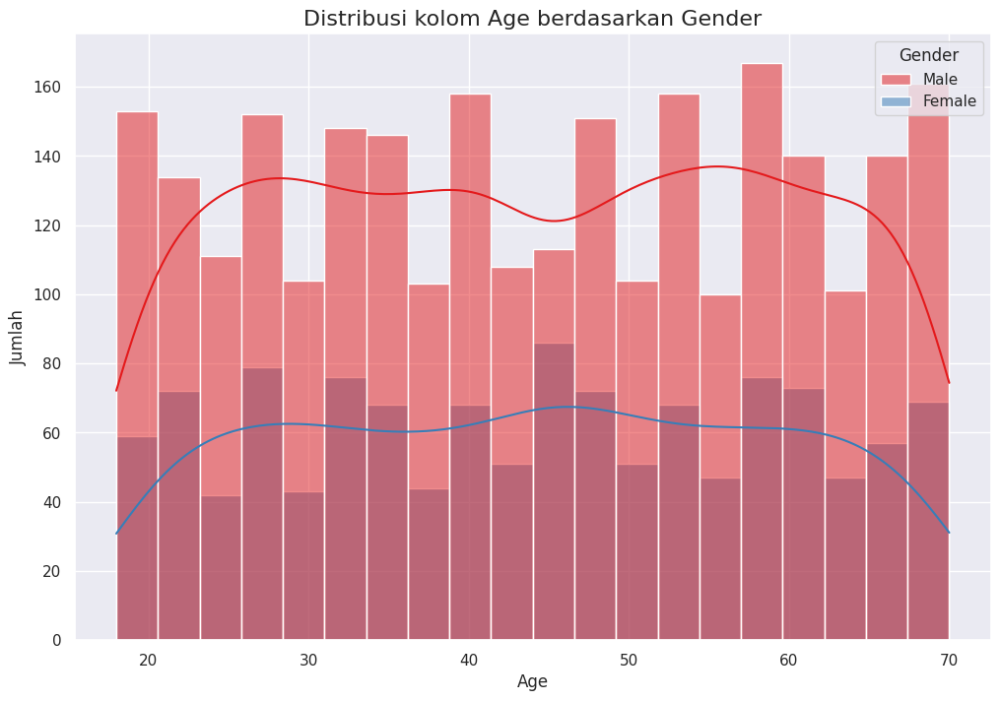

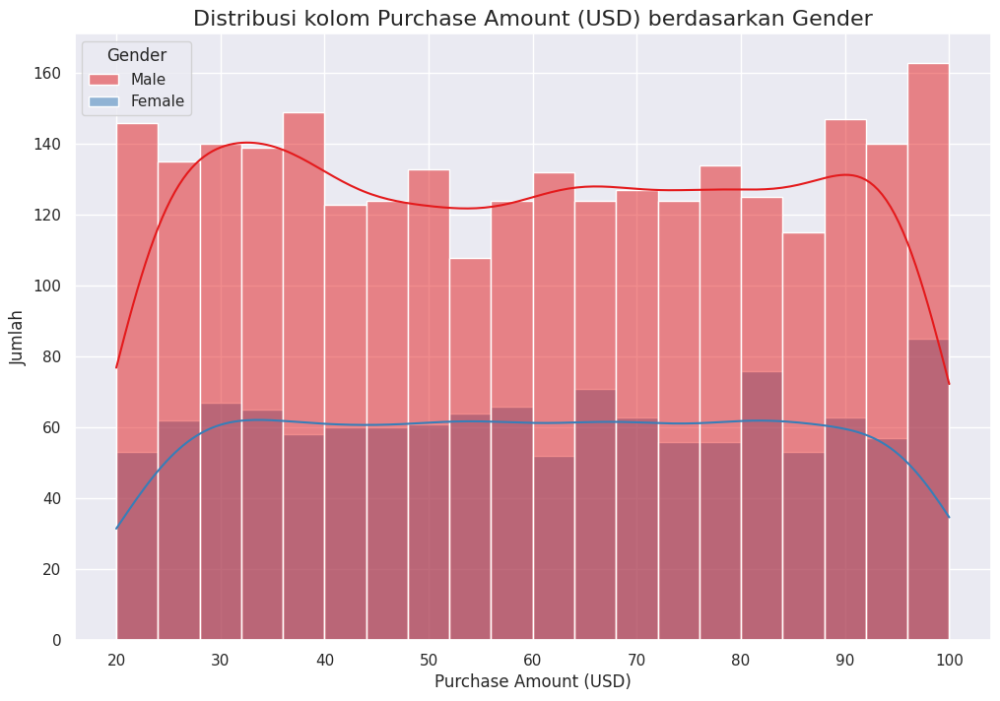

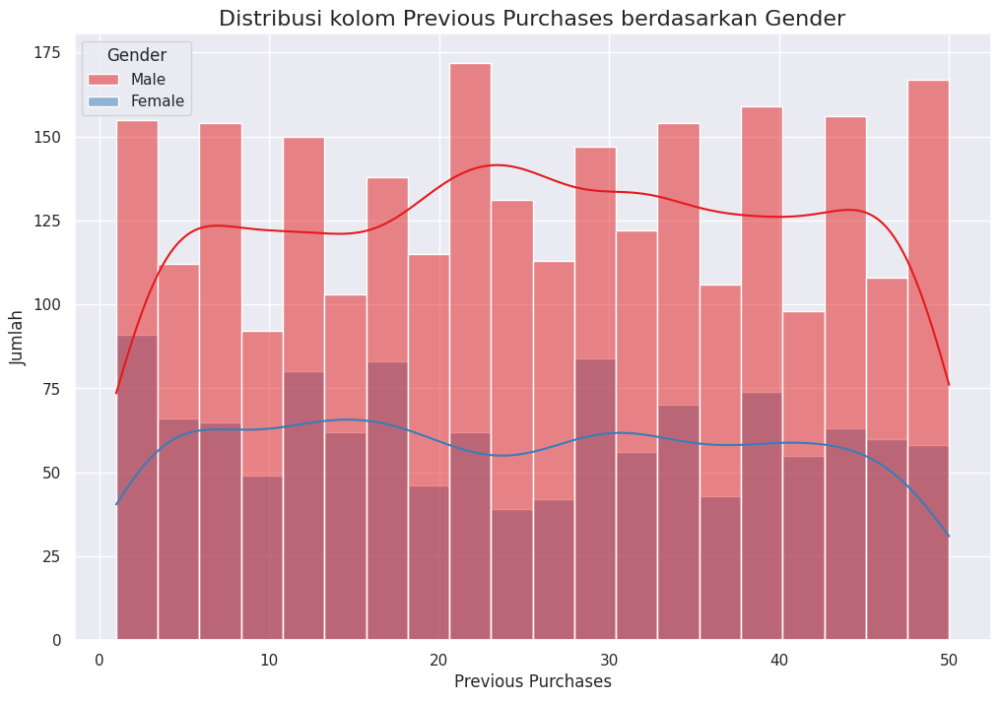

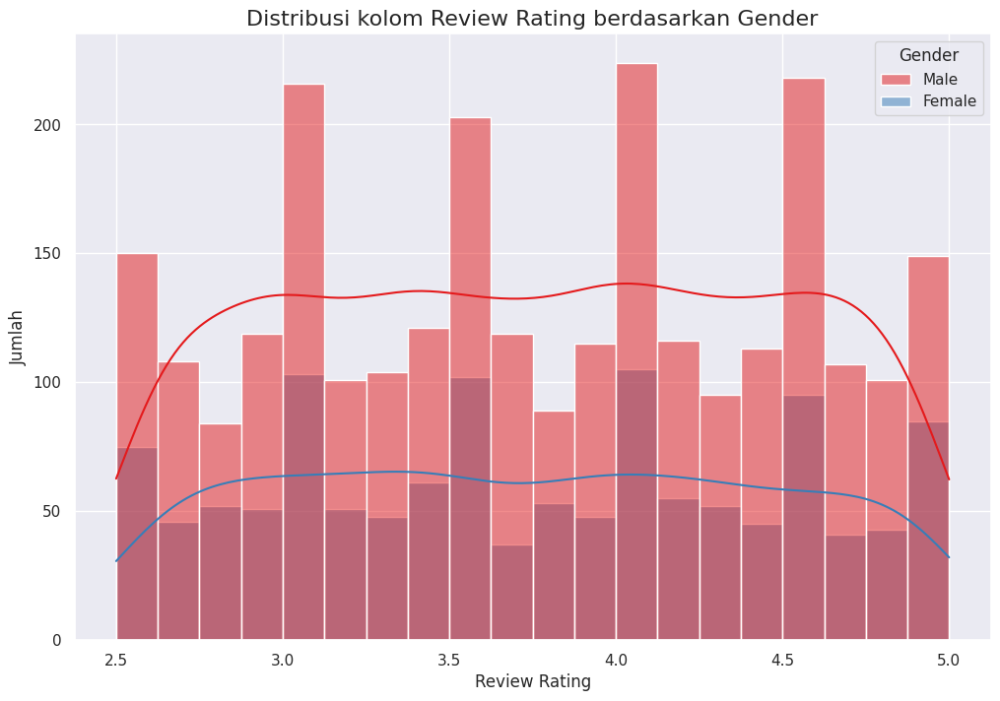

In [ ]:
for column in num_data:
  if column == "Customer ID":
    continue
  plt.figure(figsize=(12, 8))
  plt.title(f"Distribusi kolom {column} berdasarkan Gender", fontsize=16)
  sns.histplot(data=data, x=column, hue='Gender', bins=20, kde=True, palette="Set1")
  plt.xlabel(column, fontsize=12)
  plt.ylabel("Jumlah", fontsize=12)
  plt.show()

## Bagaimana korelasi antar kolom numerik (dan kolom boolean) satu sama lain (Heatmap)

<ipython-input-466-0962401c555b>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True);


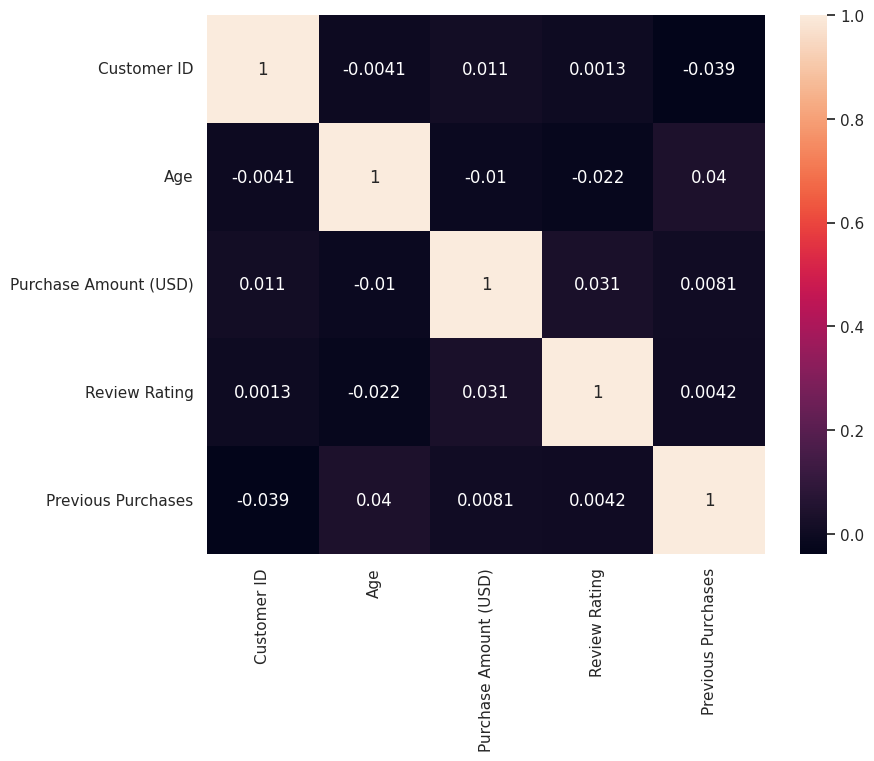

In [ ]:
plt.figure(figsize=(9,7))
sns.heatmap(data.corr(), annot=True);
plt.show()

In [ ]:
new_data = data.copy()

In [ ]:
gender_mapping = {"Male":1, "Female":0}
new_data["Gender"] = new_data["Gender"].map(gender_mapping)

In [ ]:
yes_mapping = {"Yes":1, "No":0}
new_data["Promo Code Used"] = new_data["Promo Code Used"].map(yes_mapping)
new_data["Discount Applied"] = new_data["Discount Applied"].map(yes_mapping)
new_data["Subscription Status"] = new_data["Subscription Status"].map(yes_mapping)

<ipython-input-470-1f739fb468ba>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(new_data.corr(), annot=True);


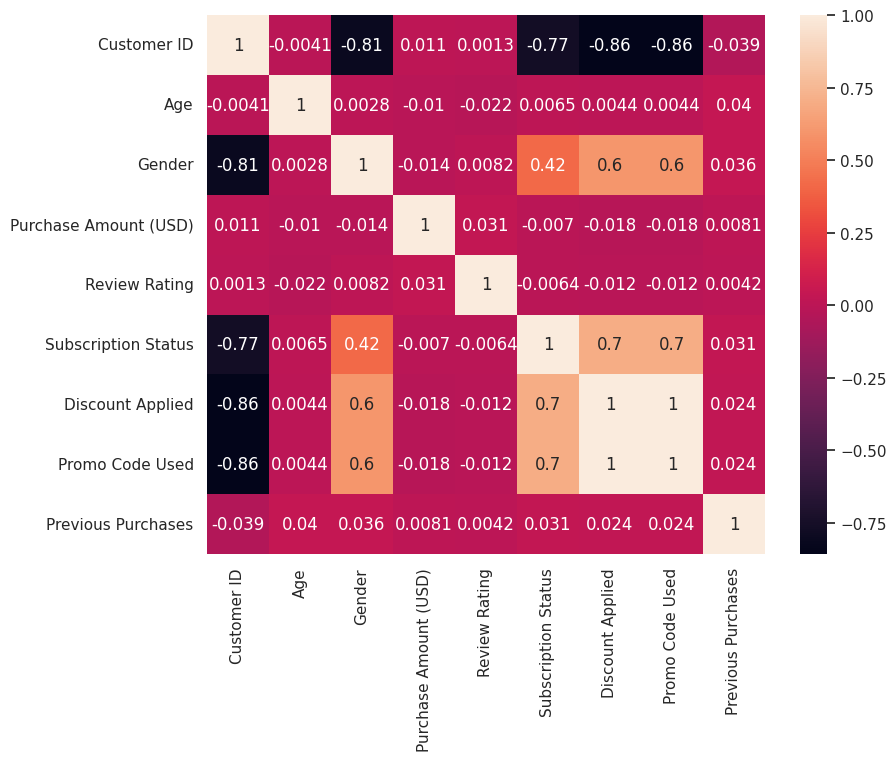

In [ ]:
plt.figure(figsize=(9,7))
sns.heatmap(new_data.corr(), annot=True);
plt.show()

## Bagaimana persebaran customer behavior dan habits (Count Plot)

<ipython-input-162-80280315fdcb>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")


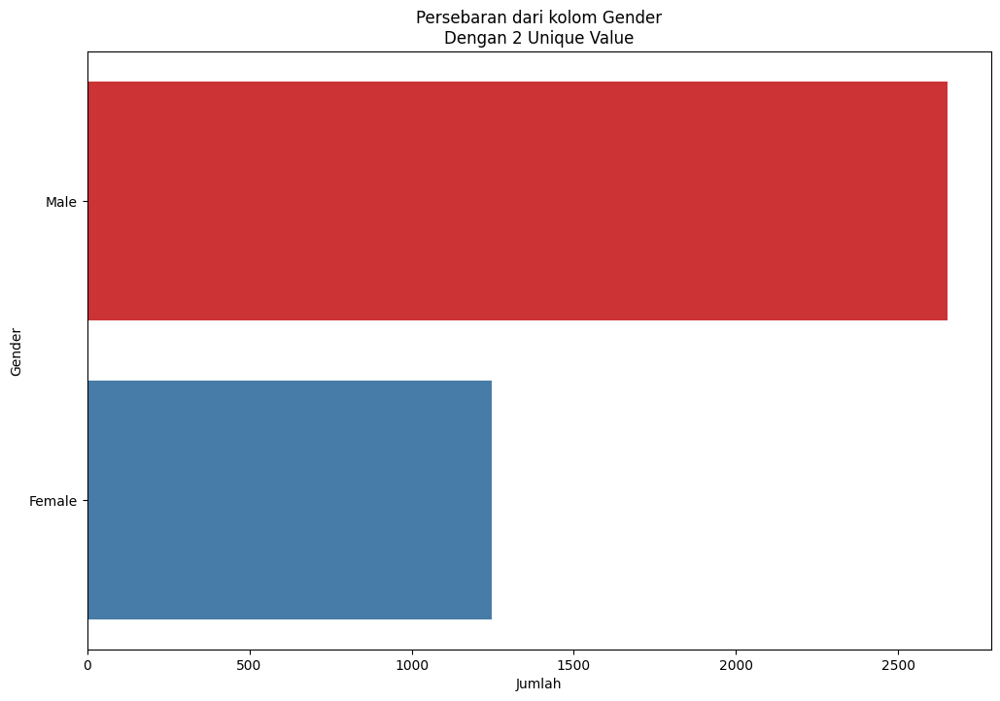

<ipython-input-162-80280315fdcb>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")


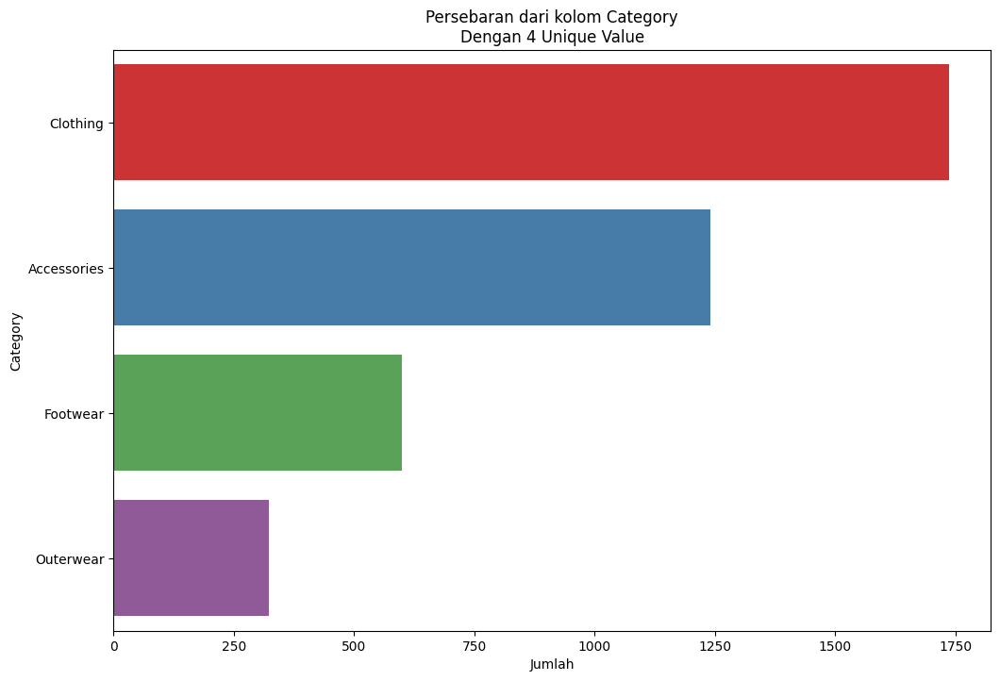

<ipython-input-162-80280315fdcb>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")


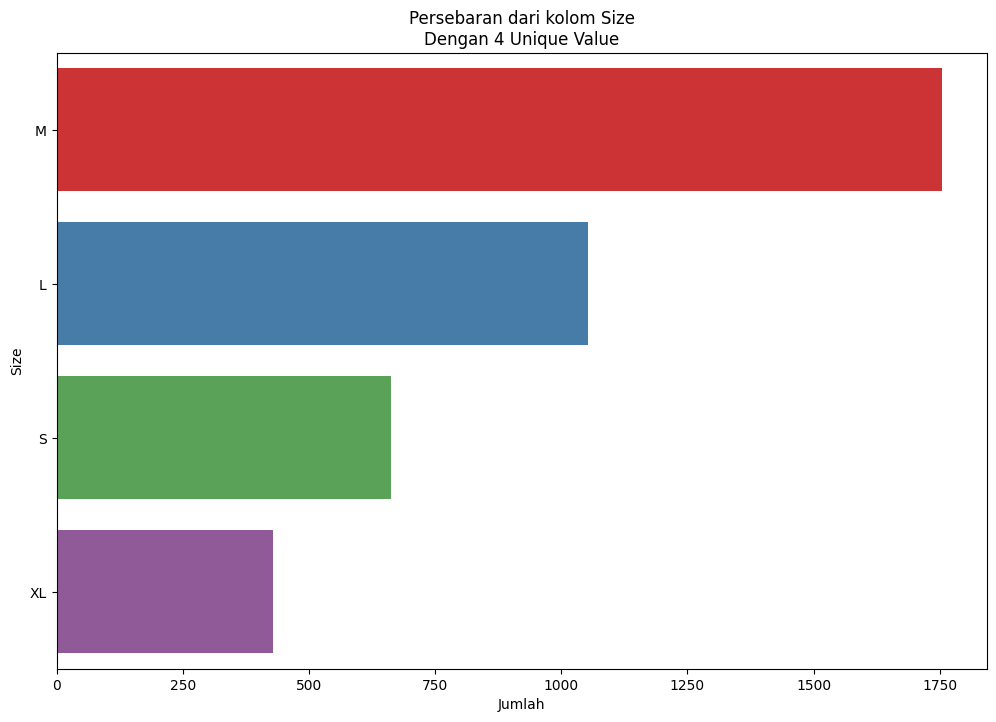

<ipython-input-162-80280315fdcb>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")


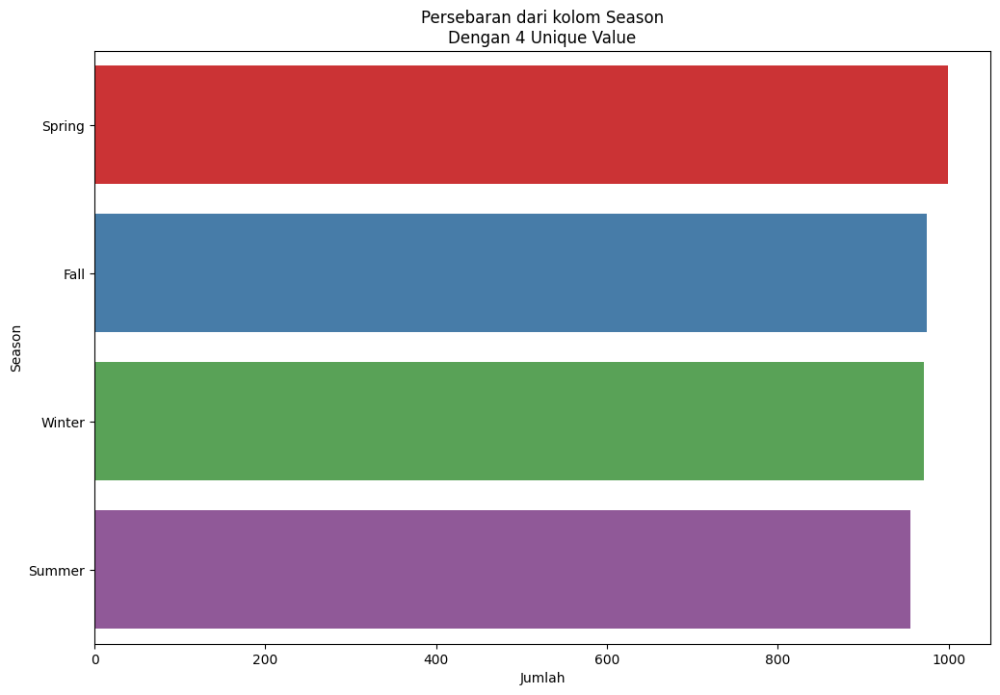

<ipython-input-162-80280315fdcb>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")


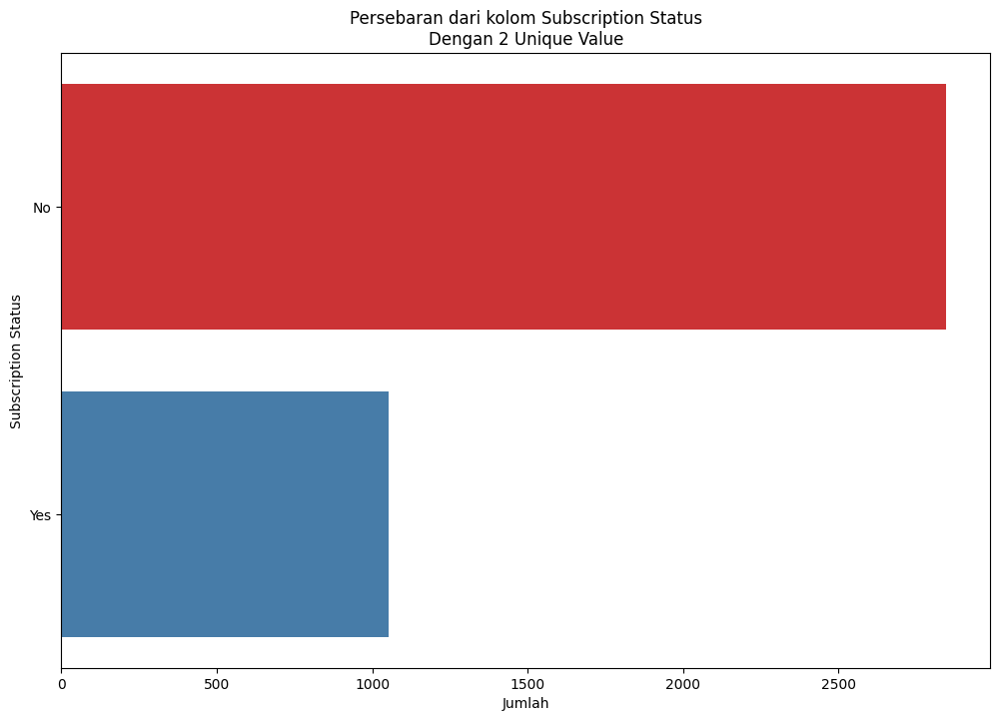

<ipython-input-162-80280315fdcb>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")


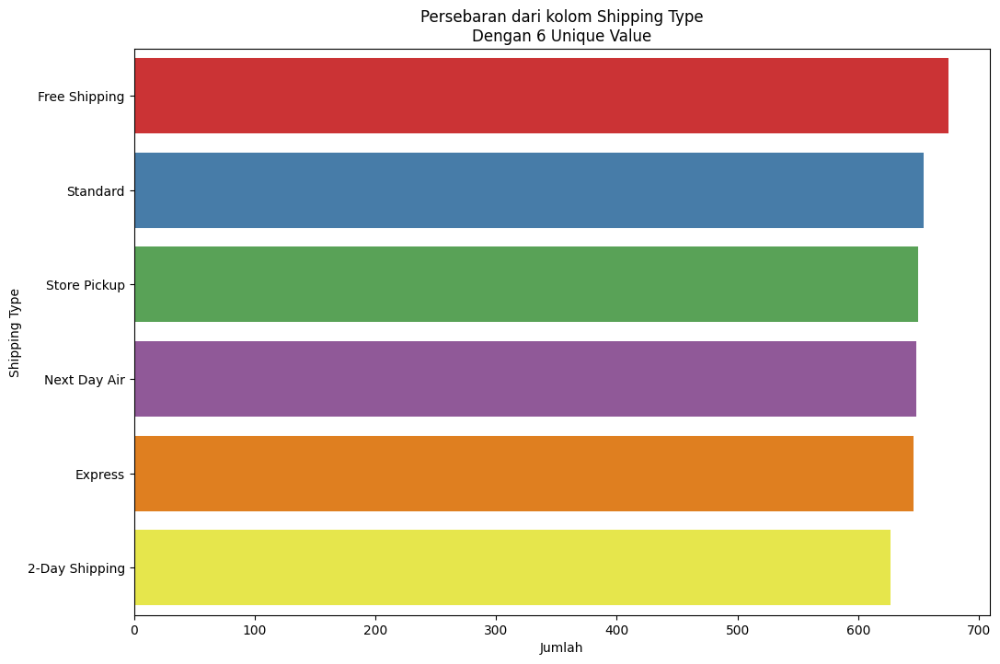

<ipython-input-162-80280315fdcb>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")


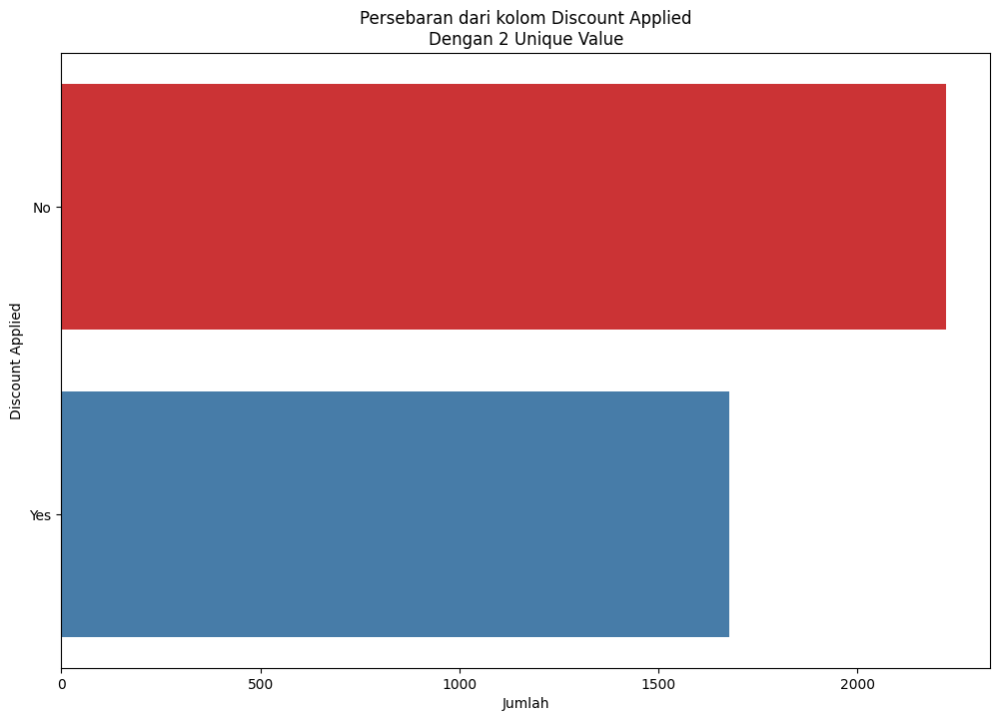

<ipython-input-162-80280315fdcb>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")


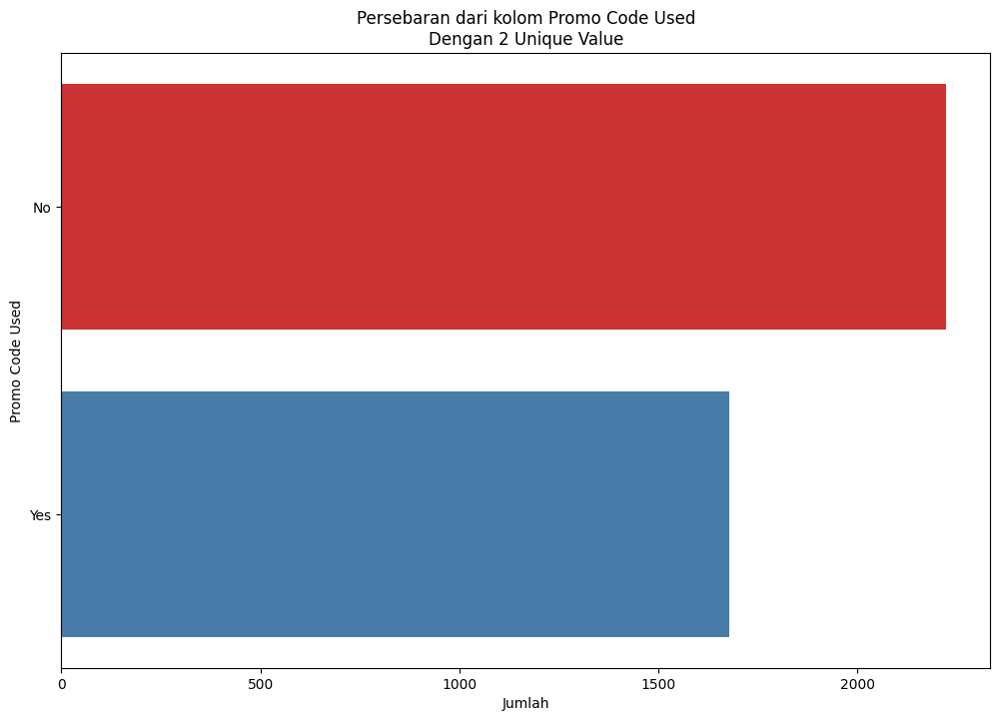

<ipython-input-162-80280315fdcb>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")


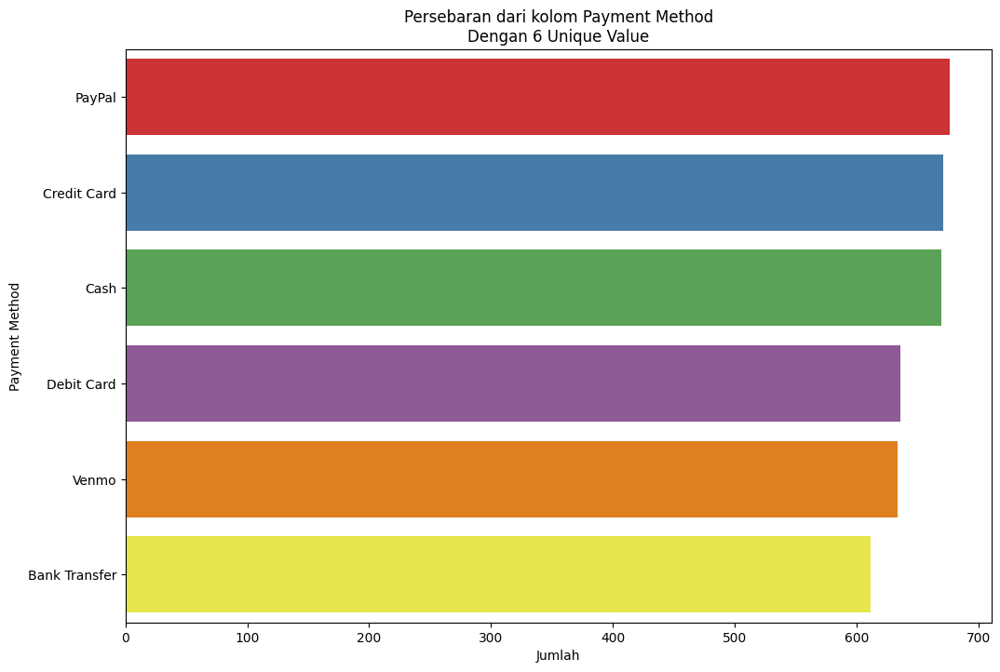

In [ ]:
for column in object_columns:
    plt.figure(figsize=(12, 8))

    # Sorting the data for the current column
    sorted_data = data[column].value_counts().reset_index().rename(columns={'index': column, column: 'count'})
    sorted_data = sorted_data.sort_values(by='count', ascending=False)

    ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")

    plt.title(f'Persebaran dari kolom {column}\nDengan {len(data[column].unique())} Unique Value')
    plt.xlabel('Jumlah')
    plt.ylabel(column)

    plt.show()

<ipython-input-163-a62a16dca3a4>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")


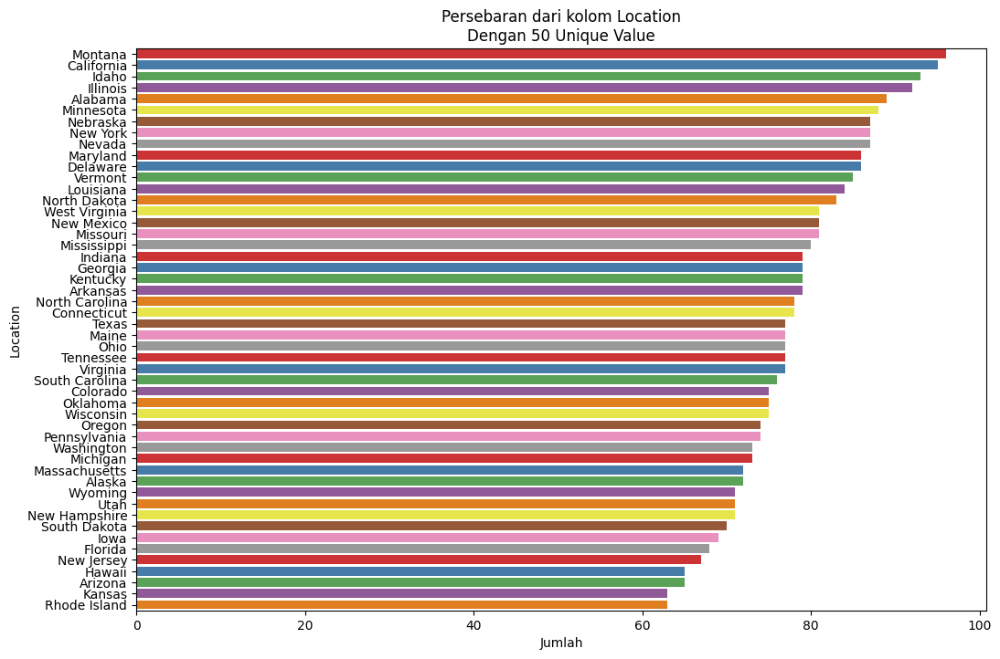

In [ ]:
column = "Location"

plt.figure(figsize=(12, 8))

# Sorting the data for the current column
sorted_data = data[column].value_counts().reset_index().rename(columns={'index': column, column: 'count'})
sorted_data = sorted_data.sort_values(by='count', ascending=False)

ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")

plt.title(f'Persebaran dari kolom {column}\nDengan {len(data[column].unique())} Unique Value')
plt.xlabel('Jumlah')
plt.ylabel(column)

plt.show()

<ipython-input-37-893b1079a5be>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")


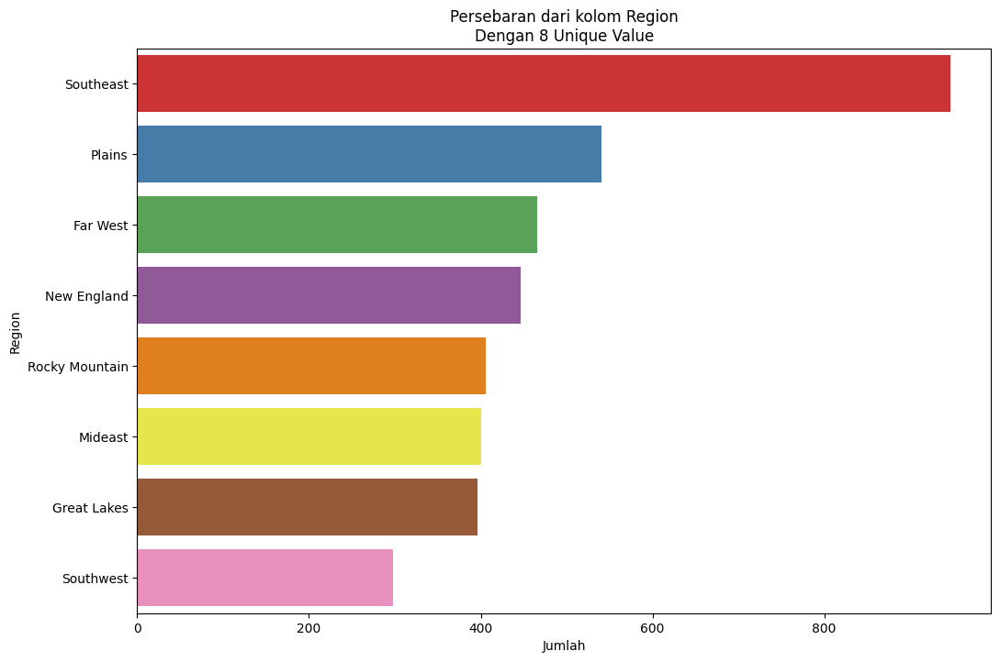

In [ ]:
column = "Region"

plt.figure(figsize=(12, 8))

# Sorting the data for the current column
sorted_data = data[column].value_counts().reset_index().rename(columns={'index': column, column: 'count'})
sorted_data = sorted_data.sort_values(by='count', ascending=False)

ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")

plt.title(f'Persebaran dari kolom {column}\nDengan {len(data[column].unique())} Unique Value')
plt.xlabel('Jumlah')
plt.ylabel(column)

plt.show()

<ipython-input-48-b3caa6bdd568>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")


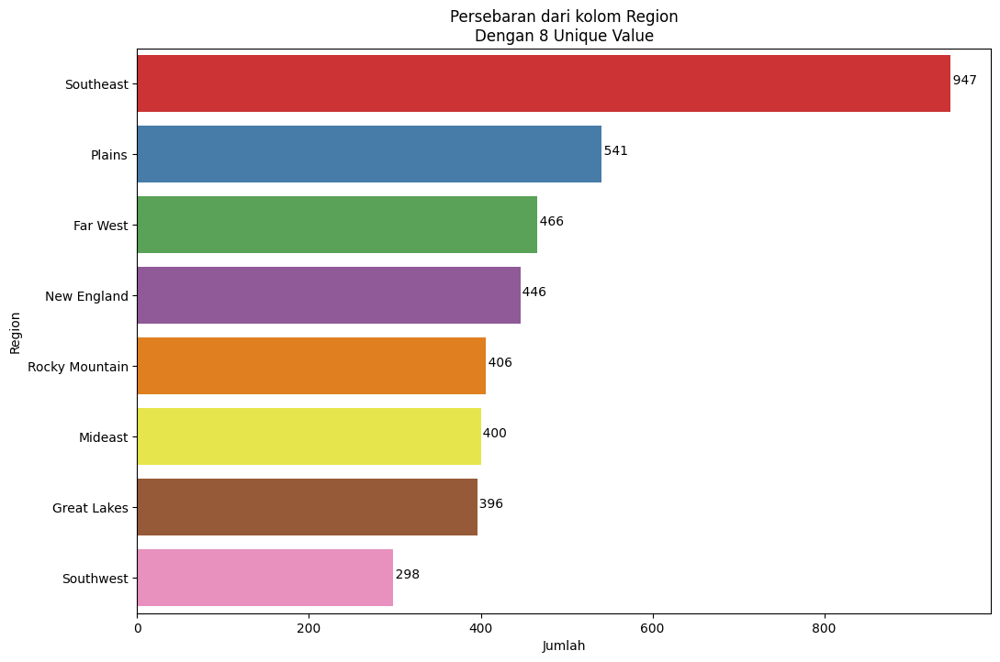

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

column = "Region"

plt.figure(figsize=(12, 8))

# Sorting the data for the current column
sorted_data = data[column].value_counts().reset_index().rename(columns={'index': column, column: 'count'})
sorted_data = sorted_data.sort_values(by='count', ascending=False)

ax = sns.countplot(y=column, data=data, order=sorted_data[column], palette="Set1")

# Menambahkan keterangan jumlah pada tiap bar
for index, value in enumerate(sorted_data['count']):
    ax.text(value, index, f"       {value}", color='black', ha="center")

plt.title(f'Persebaran dari kolom {column}\nDengan {len(data[column].unique())} Unique Value')
plt.xlabel('Jumlah')
plt.ylabel(column)

plt.show()


## Scatter plot

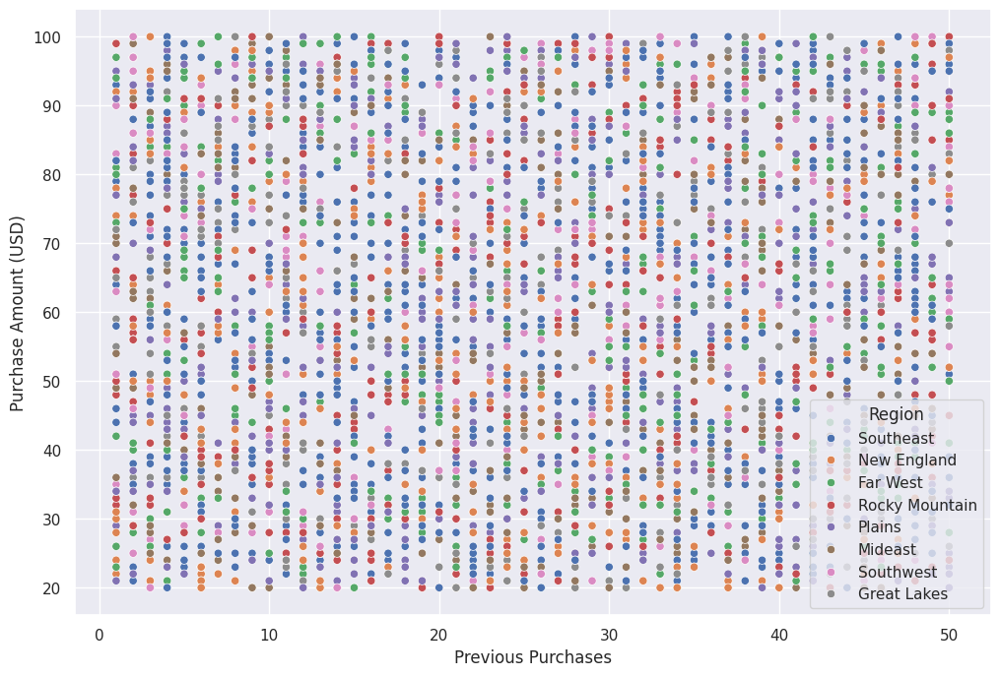

In [ ]:
plt.figure(figsize=(12,8))
sns.scatterplot(data=data, x='Previous Purchases', y='Purchase Amount (USD)', hue="Region")
plt.show()

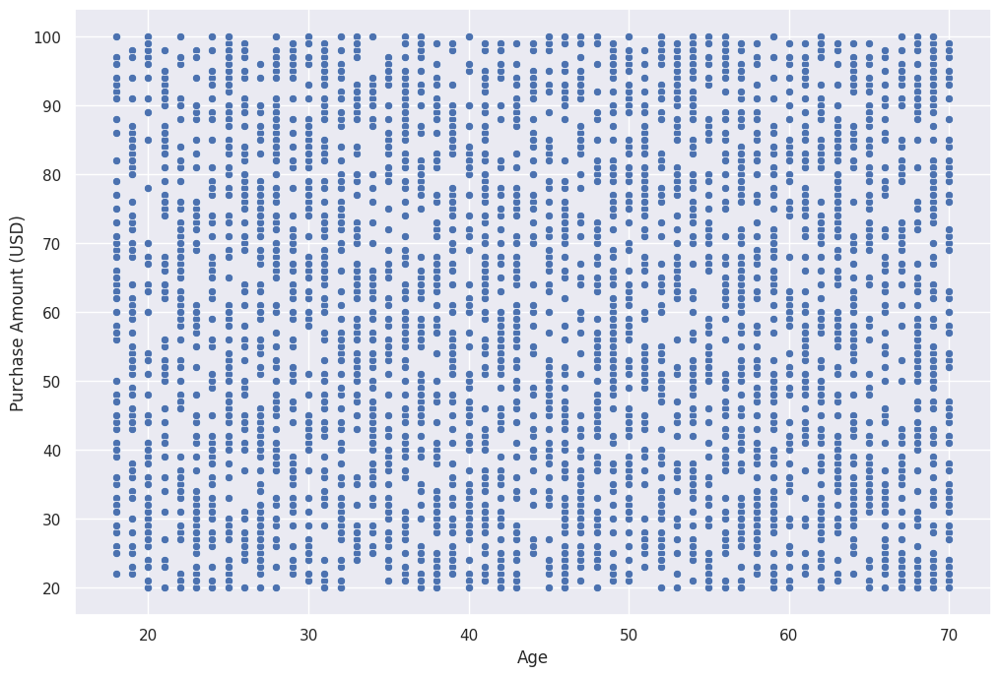

In [ ]:
plt.figure(figsize=(12,8))
sns.scatterplot(data=data, x='Age', y='Purchase Amount (USD)')
plt.show()

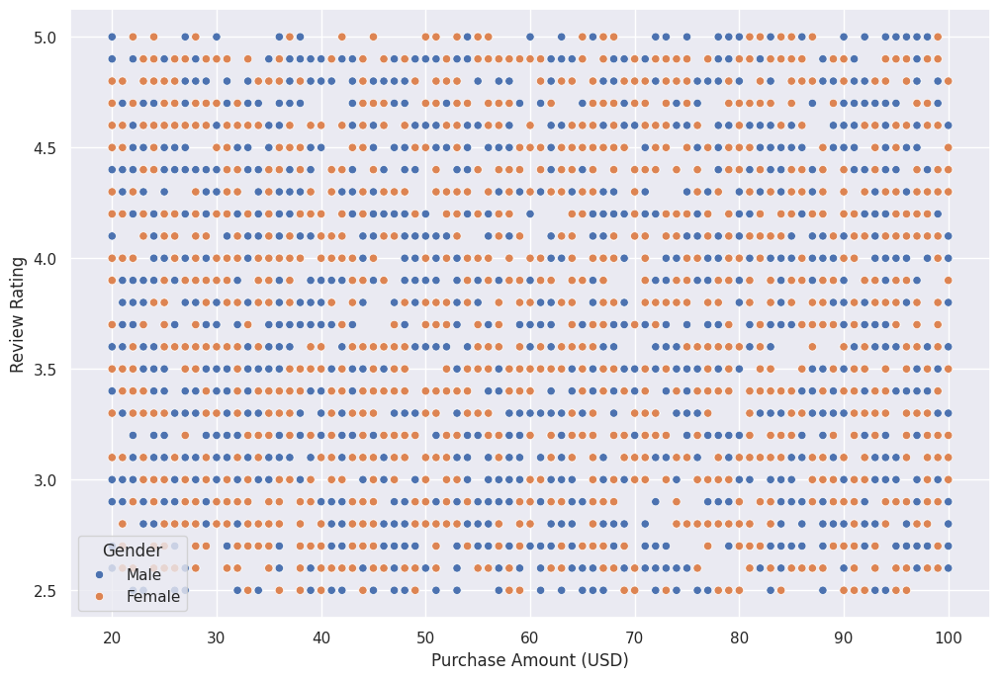

In [ ]:
plt.figure(figsize=(12,8))
sns.scatterplot(data=data, y='Review Rating', x='Purchase Amount (USD)', hue="Gender")
plt.show()

array([[<Axes: title={'center': 'Customer ID'}>,
        <Axes: title={'center': 'Age'}>],
       [<Axes: title={'center': 'Purchase Amount (USD)'}>,
        <Axes: title={'center': 'Previous Purchases'}>],
       [<Axes: title={'center': 'Review Rating'}>, <Axes: >]],
      dtype=object)

<Figure size 1200x800 with 0 Axes>

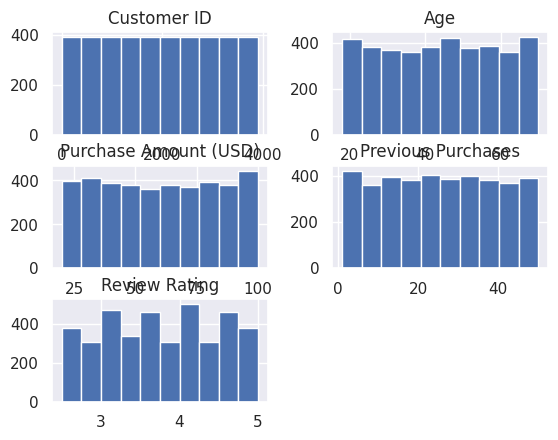

In [ ]:
plt.figure(figsize=(12, 8))
num_data.hist()

## Density Plot

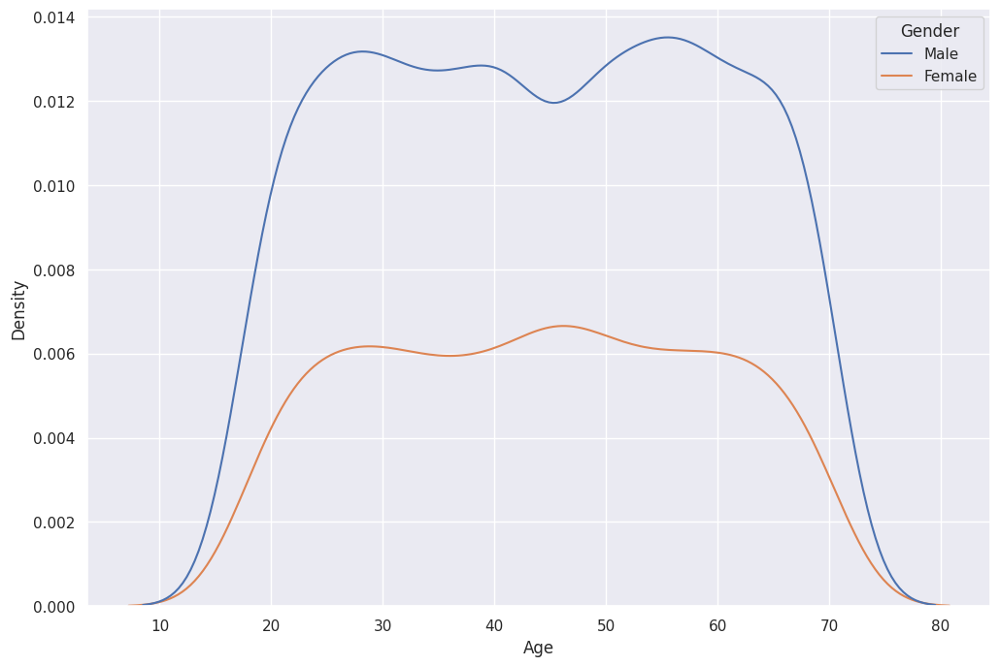

In [ ]:
plt.figure(figsize=(12, 8))
sns.kdeplot(data=data, x ='Age', hue='Gender')
plt.show()

## Violin Plot

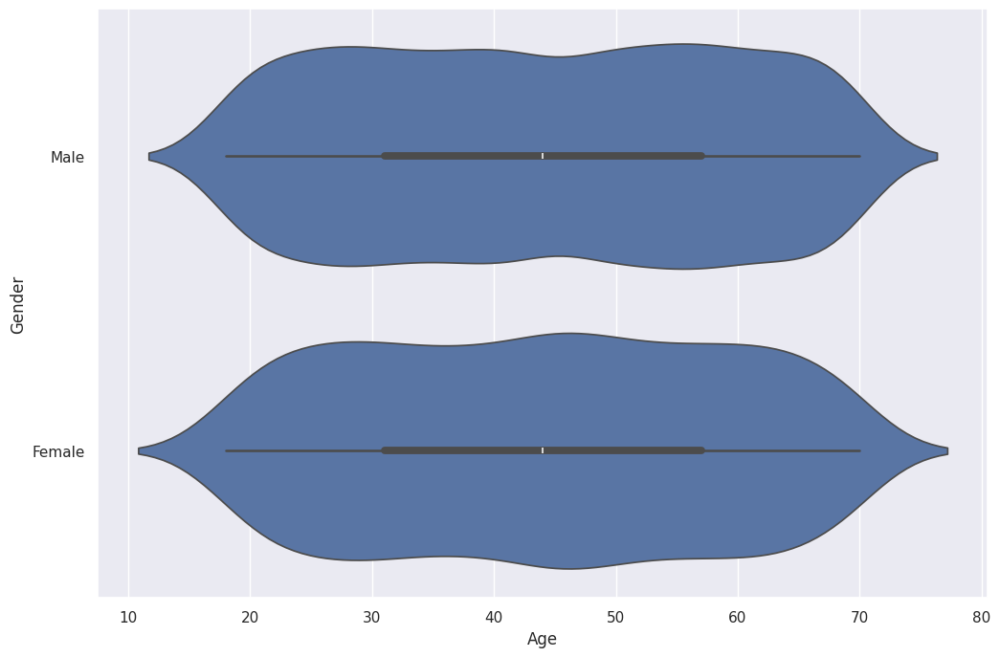

In [ ]:
plt.figure(figsize=(12,8))
sns.violinplot(data=data, x='Age', y="Gender")
plt.show()

In [ ]:
plt.figure(figsize=(25, 25))
sns.catplot(x="Review Rating", y="Age", hue="Gender", kind="violin", split=True, data=data)

## Pair Plot (Too long to load)

In [ ]:
# for column in object_columns[0]:
#   plt.figure(figsize=(20,8))
#   sns.pairplot(data, hue=column, diag_kind="kde")
#   plt.show()

## Pie Chart

In [ ]:
for column in object_columns:
  pie_data = data[column]
  # Hitung jumlah nilai unik
  unique_values = len(pie_data.unique())

  # Hitung frekuensi setiap nilai
  value_counts = pie_data.value_counts()

  # Persiapkan warna
  colors = plt.cm.tab20.colors[:unique_values]

  # Buat plot pie dengan bagian tengah bolong
  plt.pie(value_counts, labels=value_counts.index, colors=colors, autopct='%1.1f%%')

  # Tambahkan tulisan
  plt.title(f'Komposisi Kolom {column}\nDengan {unique_values} Unique Values', fontsize=16)
  plt.axis('equal')  # Supaya plot menjadi lingkaran
  plt.tight_layout()

  # Tampilkan plot
  plt.show()

In [ ]:
plt.figure(figsize=(6, 4))
data["Gender"].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title(f'Gender Distribution')
plt.ylabel('')
plt.show()

## Sankey Diagram

In [ ]:
!pip install pySankey

In [ ]:
import pandas as pd

# Import the sankey function from the sankey module within pySankey
from pySankey.sankey import sankey

In [ ]:
df = data.filter(["Item", "Season"])

# colors = {
#     "Summer": "#f71b1b",
#     "Spring": "#1b7ef7",
#     "Fall": "#f3f71b",
#     "Winter": "#12e23f",
# }

sankey(data["Season"], data["Region"], aspect=20, fontsize=12)

## Persebaran Customer di Amerika Map (Failed)

In [ ]:
# pip install wget

In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt
# from matplotlib.ticker import FuncFormatter
# import matplotlib.colors as mcolors
# import seaborn as sns
# import geopandas as gpd
# from shapely.geometry import Polygon
# import missingno as msno
# import os
# import wget
# import openpyxl
# import math

Mendapatkan dataset terlebih dahulu

In [ ]:
# filtered_data = data.filter(["Location", "Purchase Amount (USD)"])
# filtered_data.head()

In [ ]:
# wget.download("https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_500k.zip")

In [ ]:
# gdf = gpd.read_file('/content/')

In [ ]:
# gdf.head()

In [ ]:
# gdf = gdf.merge(filtered_data, left_on='NAME',right_on='Location')

In [ ]:
# gdf.head()

In [ ]:
# gdf.plot()

In [ ]:
# alaska_gdf = gdf[gdf.NAME =='Alaska']

In [ ]:
# hawaii_gdf = gdf[gdf.NAME=='Hawaii']

In [ ]:
# alaska_gdf.plot()

In [ ]:
# world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))



# # NOTE: the convention for polygon points is (Long, Lat)....counterintuitive
# polygon = Polygon([(-175,50),(-175,72),(-140, 72),(-140,50)])
# # polygon = Polygon([(-180,0),(-180,90),(-120,90),(-120,0)])

# # polygon=hipolygon
# poly_gdf = gpd.GeoDataFrame( geometry=[polygon], crs=world.crs)

# fig, ax1 = plt.subplots(1, figsize=(8, 18))
# world.plot(ax=ax1)
# poly_gdf.boundary.plot(ax = ax1, color="red")
# ax1.set_title("The red polygon can be used to clip Alaska's western islands", fontsize=20)
# ax1.set_axis_off()
# plt.show()

In [ ]:
# polygon = Polygon([(-170,50),(-170,72),(-140, 72),(-140,50)])
# # apply1(alaska_gdf,0,36)
# alaska_gdf.clip(polygon).plot( color='lightblue', linewidth=0.8, edgecolor='0.8')
# # alaska_gdf.clip(polygon).plot(column=variable, cmap = colormap, linewidth=0.8,ax=akax, edgecolor='0.8')

In [ ]:
# hawaii_gdf.plot()

In [ ]:
# hipolygon = Polygon([(-161,0),(-161,90),(-120,90),(-120,0)])
# hawaii_gdf.clip(hipolygon).plot(color='lightblue', linewidth=0.8, edgecolor='0.8')

In [ ]:
# # Create a "copy" of gdf for re-projecting
# visframe = gdf.to_crs({'init':'epsg:2163'})

# # create figure and axes for with Matplotlib for main map
# fig, ax = plt.subplots(1, figsize=(18, 14))
# # remove the axis box from the main map
# ax.axis('off')


# # create map of all states except AK and HI in the main map axis
# visframe[~visframe.NAME.isin(['Hawaii','Alaska'])].plot(color='lightblue', linewidth=0.8, ax=ax, edgecolor='0.8')


# # Add Alaska Axis (x, y, width, height)
# akax = fig.add_axes([0.1, 0.17, 0.17, 0.16])


# # Add Hawaii Axis(x, y, width, height)
# hiax = fig.add_axes([.28, 0.20, 0.1, 0.1])

# # We'll later map Alaska in "akax" and Hawaii in "hiax"

In [ ]:
# gdf["Purchase Amount (USD)"].describe()

In [ ]:
# # Apply this the gdf to ensure that all states are assigned colors by the same function
# def makeColorColumn(gdf,variable,vmin,vmax):
#     # apply a function to a column to create a new column of assigned colors & return full frame
#     norm = mcolors.Normalize(vmin=vmin, vmax=vmax, clip=True)
#     mapper = plt.cm.ScalarMappable(norm=norm, cmap=plt.cm.YlOrBr)
#     gdf['value_determined_color'] = gdf[variable].apply(lambda x: mcolors.to_hex(mapper.to_rgba(x)))
#     return gdf

In [ ]:
# # **************************
# # set the value column that will be visualised
# variable = 'Purchase Amount (USD)'

# # make a column for value_determined_color in gdf
# # set the range for the choropleth values with the upper bound the rounded up maximum value
# vmin, vmax = gdf["Purchase Amount (USD)"].min(), gdf["Purchase Amount (USD)"].max() #math.ceil(gdf.pct_food_insecure.max())
# # Choose the continuous colorscale "YlOrBr" from https://matplotlib.org/stable/tutorials/colors/colormaps.html
# colormap = "YlOrBr"
# gdf = makeColorColumn(gdf,variable,vmin,vmax)

# # create "visframe" as a re-projected gdf using EPSG 2163
# visframe = gdf.to_crs({'init':'epsg:2163'})



# # create figure and axes for Matplotlib
# fig, ax = plt.subplots(1, figsize=(18, 14))
# # remove the axis box around the vis
# ax.axis('off')

# # set the font for the visualization to Arial
# # hfont = {'fontname':'Times New Roman'}

# # add a title and annotation
# ax.set_title('Food Insecurity by Percentage of State Households\n2019-2021', fontdict={'fontsize': '42', 'fontweight' : '1'})

# # Create colorbar legend
# fig = ax.get_figure()
# # add colorbar axes to the figure
# # This will take some iterating to get it where you want it [l,b,w,h] right
# # l:left, b:bottom, w:width, h:height; in normalized unit (0-1)
# cbax = fig.add_axes([0.89, 0.21, 0.03, 0.31])

# cbax.set_title('Percentage of state households\nexperiencing food insecurity\n', fontdict={'fontsize': '15', 'fontweight' : '0'})

# # add color scale
# sm = plt.cm.ScalarMappable(cmap=colormap, \
#                  norm=plt.Normalize(vmin=vmin, vmax=vmax))
# # reformat tick labels on legend
# sm._A = []
# comma_fmt = FuncFormatter(lambda x, p: format(x/100, '.0%'))
# fig.colorbar(sm, cax=cbax, format=comma_fmt)
# tick_font_size = 16
# cbax.tick_params(labelsize=tick_font_size)
# ax.annotate("Data: USDA Economic Research Service, accessed 15 Jan 23\nhttps://www.ers.usda.gov/topics/food-nutrition-assistance/food-security-in-the-u-s/key-statistics-graphics/#map", xy=(0.22, .085), xycoords='figure fraction', fontsize=14, color='#555555')


# # create map
# # Note: we're going state by state here because of unusual coloring behavior when trying to plot the entire dataframe using the "value_determined_color" column
# for row in visframe.itertuples():
#     if row.NAME not in ['Alaska', 'Hawaii']:
#         vf = visframe[visframe.NAME==row.NAME]
#         c = gdf[gdf.NAME==row.NAME][0:1].value_determined_color.item()
#         vf.plot(color=c, linewidth=0.8, ax=ax, edgecolor='0.8')



# # add Alaska
# akax = fig.add_axes([0.1, 0.17, 0.2, 0.19])
# akax.axis('off')
# # polygon to clip western islands
# polygon = Polygon([(-170,50),(-170,72),(-140, 72),(-140,50)])
# alaska_gdf = gdf[gdf.NAME=='Alaska']
# alaska_gdf.clip(polygon).plot(color=gdf[gdf.NAME=='Alaska'].value_determined_color, linewidth=0.8,ax=akax, edgecolor='0.8')


# # add Hawaii
# hiax = fig.add_axes([.28, 0.20, 0.1, 0.1])
# hiax.axis('off')
# # polygon to clip western islands
# hipolygon = Polygon([(-160,0),(-160,90),(-120,90),(-120,0)])
# hawaii_gdf = gdf[gdf.NAME=='Hawaii']
# hawaii_gdf.clip(hipolygon).plot(column=variable, color=hawaii_gdf['value_determined_color'], linewidth=0.8,ax=hiax, edgecolor='0.8')



# fig.savefig('/content/',dpi=400, bbox_inches="tight")
# # bbox_inches="tight" keeps the vis from getting cut off at the edges in the saved png
# # dip is "dots per inch" and controls image quality.  Many scientific journals have specifications for this
# # https://stackoverflow.com/questions/16183462/saving-images-in-python-at-a-very-high-quality

In [ ]:
# pip install basemap

In [ ]:
# from __future__ import (absolute_import, division, print_function)

# import numpy as np
# import matplotlib.pyplot as plt
# from mpl_toolkits.basemap import Basemap as Basemap
# from matplotlib.colors import rgb2hex, Normalize
# from matplotlib.patches import Polygon
# from matplotlib.colorbar import ColorbarBase

# fig, ax = plt.subplots()

# # Lambert Conformal map of lower 48 states.
# m = Basemap(llcrnrlon=-119,llcrnrlat=20,urcrnrlon=-64,urcrnrlat=49,
#             projection='lcc',lat_1=33,lat_2=45,lon_0=-95)

# # Mercator projection, for Alaska and Hawaii
# m_ = Basemap(llcrnrlon=-190,llcrnrlat=20,urcrnrlon=-143,urcrnrlat=46,
#             projection='merc',lat_ts=20)  # do not change these numbers

# #%% ---------   draw state boundaries  ----------------------------------------
# ## data from U.S Census Bureau
# ## http://www.census.gov/geo/www/cob/st2000.html
# shp_info = m.readshapefile('cb_2018_us_state_500k','state',drawbounds=True,
#                            linewidth=0.45,color='gray')
# shp_info_ = m_.readshapefile('cb_2018_us_state_500k','state',drawbounds=False)

# ## population density by state from
# ## http://en.wikipedia.org/wiki/List_of_U.S._states_by_population_density
# popdensity = {
# 'New Jersey':  438.00,
# 'Rhode Island':   387.35,
# 'Massachusetts':   312.68,
# 'Connecticut':	  271.40,
# 'Maryland':   209.23,
# 'New York':    155.18,
# 'Delaware':    154.87,
# 'Florida':     114.43,
# 'Ohio':	 107.05,
# 'Pennsylvania':	 105.80,
# 'Illinois':    86.27,
# 'California':  83.85,
# 'Hawaii':  72.83,
# 'Virginia':    69.03,
# 'Michigan':    67.55,
# 'Indiana':    65.46,
# 'North Carolina':  63.80,
# 'Georgia':     54.59,
# 'Tennessee':   53.29,
# 'New Hampshire':   53.20,
# 'South Carolina':  51.45,
# 'Louisiana':   39.61,
# 'Kentucky':   39.28,
# 'Wisconsin':  38.13,
# 'Washington':  34.20,
# 'Alabama':     33.84,
# 'Missouri':    31.36,
# 'Texas':   30.75,
# 'West Virginia':   29.00,
# 'Vermont':     25.41,
# 'Minnesota':  23.86,
# 'Mississippi':	 23.42,
# 'Iowa':	 20.22,
# 'Arkansas':    19.82,
# 'Oklahoma':    19.40,
# 'Arizona':     17.43,
# 'Colorado':    16.01,
# 'Maine':  15.95,
# 'Oregon':  13.76,
# 'Kansas':  12.69,
# 'Utah':	 10.50,
# 'Nebraska':    8.60,
# 'Nevada':  7.03,
# 'Idaho':   6.04,
# 'New Mexico':  5.79,
# 'South Dakota':	 3.84,
# 'North Dakota':	 3.59,
# 'Montana':     2.39,
# 'Wyoming':      1.96,
# 'Alaska':     0.42}

# #%% -------- choose a color for each state based on population density. -------
# colors={}
# statenames=[]
# cmap = plt.cm.hot_r # use 'reversed hot' colormap
# vmin = 0; vmax = 450 # set range.
# norm = Normalize(vmin=vmin, vmax=vmax)
# for shapedict in m.state_info:
#     statename = shapedict['NAME']
#     # skip DC and Puerto Rico.
#     if statename not in ['District of Columbia','Puerto Rico']:
#         pop = popdensity[statename]
#         # calling colormap with value between 0 and 1 returns
#         # rgba value.  Invert color range (hot colors are high
#         # population), take sqrt root to spread out colors more.
#         colors[statename] = cmap(np.sqrt((pop-vmin)/(vmax-vmin)))[:3]
#     statenames.append(statename)

# #%% ---------  cycle through state names, color each one.  --------------------
# for nshape,seg in enumerate(m.states):
#     # skip DC and Puerto Rico.
#     if statenames[nshape] not in ['Puerto Rico', 'District of Columbia']:
#         color = rgb2hex(colors[statenames[nshape]])
#         poly = Polygon(seg,facecolor=color,edgecolor=color)
#         ax.add_patch(poly)

# AREA_1 = 0.005  # exclude small Hawaiian islands that are smaller than AREA_1
# AREA_2 = AREA_1 * 30.0  # exclude Alaskan islands that are smaller than AREA_2
# AK_SCALE = 0.19  # scale down Alaska to show as a map inset
# HI_OFFSET_X = -1900000  # X coordinate offset amount to move Hawaii "beneath" Texas
# HI_OFFSET_Y = 250000    # similar to above: Y offset for Hawaii
# AK_OFFSET_X = -250000   # X offset for Alaska (These four values are obtained
# AK_OFFSET_Y = -750000   # via manual trial and error, thus changing them is not recommended.)

# for nshape, shapedict in enumerate(m_.states_info):  # plot Alaska and Hawaii as map insets
#     if shapedict['NAME'] in ['Alaska', 'Hawaii']:
#         seg = m_.states[int(shapedict['SHAPENUM'] - 1)]
#         if shapedict['NAME'] == 'Hawaii' and float(shapedict['AREA']) > AREA_1:
#             seg = [(x + HI_OFFSET_X, y + HI_OFFSET_Y) for x, y in seg]
#             color = rgb2hex(colors[statenames[nshape]])
#         elif shapedict['NAME'] == 'Alaska' and float(shapedict['AREA']) > AREA_2:
#             seg = [(x*AK_SCALE + AK_OFFSET_X, y*AK_SCALE + AK_OFFSET_Y)\
#                    for x, y in seg]
#             color = rgb2hex(colors[statenames[nshape]])
#         poly = Polygon(seg, facecolor=color, edgecolor='gray', linewidth=.45)
#         ax.add_patch(poly)

# ax.set_title('United states population density by state')

# #%% ---------  Plot bounding boxes for Alaska and Hawaii insets  --------------
# light_gray = [0.8]*3  # define light gray color RGB
# x1,y1 = m_([-190,-183,-180,-180,-175,-171,-171],[29,29,26,26,26,22,20])
# x2,y2 = m_([-180,-180,-177],[26,23,20])  # these numbers are fine-tuned manually
# m_.plot(x1,y1,color=light_gray,linewidth=0.8)  # do not change them drastically
# m_.plot(x2,y2,color=light_gray,linewidth=0.8)

# #%% ---------   Show color bar  ---------------------------------------
# ax_c = fig.add_axes([0.9, 0.1, 0.03, 0.8])
# cb = ColorbarBase(ax_c,cmap=cmap,norm=norm,orientation='vertical',
#                   label=r'[population per $\mathregular{km^2}$]')

# plt.show()

In [ ]:
# for nshape,seg in enumerate(m.states):
#     # skip DC and Puerto Rico.
#     if statenames[nshape] not in ['Puerto Rico', 'District of Columbia']:
#     # Offset Alaska and Hawaii to the lower-left corner.
#         if statenames[nshape] == 'Alaska':
#         # Alaska is too big. Scale it down to 35% first, then transate it.
#             seg = list(map(lambda (x,y): (0.35*x + 1100000, 0.35*y-1300000), seg))
#         if statenames[nshape] == 'Hawaii':
#             seg = list(map(lambda (x,y): (x + 5100000, y-900000), seg))

#         color = rgb2hex(colors[statenames[nshape]])
#         poly = Polygon(seg,facecolor=color,edgecolor=color)
#         ax.add_patch(poly)

# Preprocessing (Non Feature Engineering Data, Non Encoding Data, Processed Data)

In [ ]:
process_data = data.copy()
process_data.head()

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,Southeast,Middle_Age
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,New England,Teenager
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,New England,Middle_Age
3,4,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,New England,Young_Adult
4,5,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,Far West,Middle_Age


In [ ]:
process_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Customer ID             3900 non-null   int64  
 1   Age                     3900 non-null   int64  
 2   Gender                  3900 non-null   object 
 3   Item Purchased          3900 non-null   object 
 4   Category                3900 non-null   object 
 5   Purchase Amount (USD)   3900 non-null   int64  
 6   Location                3900 non-null   object 
 7   Size                    3900 non-null   object 
 8   Color                   3900 non-null   object 
 9   Season                  3900 non-null   object 
 10  Review Rating           3900 non-null   float64
 11  Subscription Status     3900 non-null   object 
 12  Shipping Type           3900 non-null   object 
 13  Discount Applied        3900 non-null   object 
 14  Promo Code Used         3900 non-null   

Bagi jadi tiga,
nan_process_data,
nan_encoding_data,
processed_data,

## Drop Useless Column

In [ ]:
def drop_column(data, all_columns):
  clean_data = data.drop(columns=all_columns)
  return clean_data

In [ ]:
nan_process_data = drop_column(data.copy(), ["Customer ID"])
nan_process_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3900 non-null   int64  
 1   Gender                  3900 non-null   object 
 2   Item Purchased          3900 non-null   object 
 3   Category                3900 non-null   object 
 4   Purchase Amount (USD)   3900 non-null   int64  
 5   Location                3900 non-null   object 
 6   Size                    3900 non-null   object 
 7   Color                   3900 non-null   object 
 8   Season                  3900 non-null   object 
 9   Review Rating           3900 non-null   float64
 10  Subscription Status     3900 non-null   object 
 11  Shipping Type           3900 non-null   object 
 12  Discount Applied        3900 non-null   object 
 13  Promo Code Used         3900 non-null   object 
 14  Previous Purchases      3900 non-null   

In [ ]:
nan_encoding_data = processed_data = drop_column(data.copy(), ["Customer ID", "Item Purchased", "Color", "Location"])
processed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3900 non-null   int64  
 1   Gender                  3900 non-null   object 
 2   Category                3900 non-null   object 
 3   Purchase Amount (USD)   3900 non-null   int64  
 4   Size                    3900 non-null   object 
 5   Season                  3900 non-null   object 
 6   Review Rating           3900 non-null   float64
 7   Subscription Status     3900 non-null   object 
 8   Shipping Type           3900 non-null   object 
 9   Discount Applied        3900 non-null   object 
 10  Promo Code Used         3900 non-null   object 
 11  Previous Purchases      3900 non-null   int64  
 12  Payment Method          3900 non-null   object 
 13  Frequency of Purchases  3900 non-null   object 
 14  Region                  3900 non-null   

## Splitting Categorical Value into Indicator Value

In [ ]:
# Method for preprocessing
def prep(df):

  # Convert kategorikal ke variabel indikator
  df_dummies_freq = pd.get_dummies(df['Frequency of Purchases'])
  df_dummies_reg = pd.get_dummies(df['Region'])
  df_dummies_age = pd.get_dummies(df['Age Group'])

  # Menggabungkan DataFrame asli dengan DataFrame hasil get_dummies
  df = pd.concat([df, df_dummies_freq, df_dummies_reg, df_dummies_age], axis=1)

  # Hapus kolom yang sudah di convert
  df.drop(columns=['Frequency of Purchases', 'Region', 'Age Group'], axis=1, inplace=True)

  return df

In [ ]:
processed_data = prep(processed_data)
processed_data

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,...,New England,Plains,Rocky Mountain,Southeast,Southwest,Adult,Elder,Middle_Age,Teenager,Young_Adult
0,55,Male,Clothing,53,L,Winter,3.1,Yes,Express,Yes,...,0,0,0,1,0,0,0,1,0,0
1,19,Male,Clothing,64,L,Winter,3.1,Yes,Express,Yes,...,1,0,0,0,0,0,0,0,1,0
2,50,Male,Clothing,73,S,Spring,3.1,Yes,Free Shipping,Yes,...,1,0,0,0,0,0,0,1,0,0
3,21,Male,Footwear,90,M,Spring,3.5,Yes,Next Day Air,Yes,...,1,0,0,0,0,0,0,0,0,1
4,45,Male,Clothing,49,M,Spring,2.7,Yes,Free Shipping,Yes,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3895,40,Female,Clothing,28,L,Summer,4.2,No,2-Day Shipping,No,...,0,0,0,1,0,1,0,0,0,0
3896,52,Female,Accessories,49,L,Spring,4.5,No,Store Pickup,No,...,0,1,0,0,0,0,0,1,0,0
3897,46,Female,Accessories,33,L,Spring,2.9,No,Standard,No,...,0,0,0,0,0,0,0,1,0,0
3898,44,Female,Footwear,77,S,Summer,3.8,No,Express,No,...,0,1,0,0,0,1,0,0,0,0


In [ ]:
processed_data.shape

(3900, 33)

In [ ]:
nan_column_type = nan_process_data.dtypes

In [ ]:
nan_object_columns = nan_column_type[nan_column_type == 'object'].index.tolist()
nan_object_columns

['Gender',
 'Item Purchased',
 'Category',
 'Location',
 'Size',
 'Color',
 'Season',
 'Subscription Status',
 'Shipping Type',
 'Discount Applied',
 'Promo Code Used',
 'Payment Method',
 'Frequency of Purchases',
 'Region',
 'Age Group']

In [ ]:
enco_column_types = nan_encoding_data.dtypes

In [ ]:
enco_object_columns = enco_column_types[enco_column_types == 'object'].index.tolist()
enco_object_columns

['Gender',
 'Category',
 'Size',
 'Season',
 'Subscription Status',
 'Shipping Type',
 'Discount Applied',
 'Promo Code Used',
 'Payment Method',
 'Frequency of Purchases',
 'Region',
 'Age Group']

In [ ]:
column_types = processed_data.dtypes

In [ ]:
object_columns = column_types[column_types == 'object'].index.tolist()
object_columns

['Gender',
 'Category',
 'Size',
 'Season',
 'Subscription Status',
 'Shipping Type',
 'Discount Applied',
 'Promo Code Used',
 'Payment Method']

## Splitting Categorical Value

In [ ]:
# menggunakan LabelEncoding untuk nan_process_data
le = LabelEncoder()

for column in nan_object_columns:
  nan_process_data[column] = le.fit_transform(nan_process_data[column])

nan_process_data.head()

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group
0,55,1,2,1,53,16,0,7,3,3.1,1,1,1,1,14,5,3,6,2
1,19,1,23,1,64,18,0,12,3,3.1,1,1,1,1,2,1,3,3,3
2,50,1,11,1,73,20,2,12,1,3.1,1,2,1,1,23,2,6,3,2
3,21,1,14,2,90,38,1,12,1,3.5,1,3,1,1,49,4,6,3,4
4,45,1,2,1,49,36,1,21,1,2.7,1,2,1,1,31,4,0,0,2


In [ ]:
# menggunakan LabelEncoding untuk nan_encoding_dtaa
for column in enco_object_columns:
  nan_encoding_data[column] = le.fit_transform(nan_encoding_data[column])

nan_encoding_data.head()

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group
0,55,1,1,53,0,3,3.1,1,1,1,1,14,5,3,6,2
1,19,1,1,64,0,3,3.1,1,1,1,1,2,1,3,3,3
2,50,1,1,73,2,1,3.1,1,2,1,1,23,2,6,3,2
3,21,1,2,90,1,1,3.5,1,3,1,1,49,4,6,3,4
4,45,1,1,49,1,1,2.7,1,2,1,1,31,4,0,0,2


In [ ]:
# menggunakan LabelEncoding untuk nominal fitur
for column in object_columns:
  processed_data[column] = le.fit_transform(processed_data[column])

processed_data.head()

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,...,New England,Plains,Rocky Mountain,Southeast,Southwest,Adult,Elder,Middle_Age,Teenager,Young_Adult
0,55,1,1,53,0,3,3.1,1,1,1,...,0,0,0,1,0,0,0,1,0,0
1,19,1,1,64,0,3,3.1,1,1,1,...,1,0,0,0,0,0,0,0,1,0
2,50,1,1,73,2,1,3.1,1,2,1,...,1,0,0,0,0,0,0,1,0,0
3,21,1,2,90,1,1,3.5,1,3,1,...,1,0,0,0,0,0,0,0,0,1
4,45,1,1,49,1,1,2.7,1,2,1,...,0,0,0,0,0,0,0,1,0,0


## Splitting Features and Target

In [ ]:
X_train_raw = nan_process_data.drop('Age', axis=1)
y_train_raw = nan_process_data['Age']

print("X_train (Raw Column) shape:", X_train_raw.shape)
print("y_train (Raw Column) shape:", y_train_raw.shape, "\n")

X_train (Raw Column) shape: (3900, 18)
y_train (Raw Column) shape: (3900,) 



In [ ]:
X_train_enco = nan_encoding_data.drop('Age', axis=1)
y_train_enco = nan_encoding_data['Age']

print("X_train (Without Encoding Column) shape:", X_train_enco.shape)
print("y_train (Without Encoding Column) shape:", y_train_enco.shape, "\n")

X_train (Without Encoding Column) shape: (3900, 15)
y_train (Without Encoding Column) shape: (3900,) 



In [ ]:
X_train = processed_data.drop('Age', axis=1)
y_train = processed_data['Age']

print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape, "\n")

X_train shape: (3900, 32)
y_train shape: (3900,) 



## Data transformation

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train) , columns = X_train.columns)

In [ ]:
X_train.head()

,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,...,New England,Plains,Rocky Mountain,Southeast,Southwest,Adult,Elder,Middle_Age,Teenager,Young_Adult
0,0.685994,-0.002002,-0.285629,-1.203814,1.349198,-0.907584,1.644294,-0.892178,1.151339,1.151339,...,-0.359341,-0.401323,-0.34088,1.765862,-0.287631,-0.595514,-0.503203,1.554047,-0.2,-0.507601
1,0.685994,-0.002002,0.178852,-1.203814,1.349198,-0.907584,1.644294,-0.892178,1.151339,1.151339,...,2.782875,-0.401323,-0.34088,-0.566296,-0.287631,-0.595514,-0.503203,-0.643481,5.0,-0.507601
2,0.685994,-0.002002,0.558882,0.945854,-0.441163,-0.907584,1.644294,-0.303032,1.151339,1.151339,...,2.782875,-0.401323,-0.34088,-0.566296,-0.287631,-0.595514,-0.503203,1.554047,-0.2,-0.507601
3,0.685994,1.113356,1.276716,-0.128980,-0.441163,-0.349027,1.644294,0.286113,1.151339,1.151339,...,2.782875,-0.401323,-0.34088,-0.566296,-0.287631,-0.595514,-0.503203,-0.643481,-0.2,1.970051
4,0.685994,-0.002002,-0.454531,-0.128980,-0.441163,-1.466141,1.644294,-0.303032,1.151339,1.151339,...,-0.359341,-0.401323,-0.34088,-0.566296,-0.287631,-0.595514,-0.503203,1.554047,-0.2,-0.507601


In [ ]:
# Nan Encoding Data
X_train_enco = pd.DataFrame(scaler.fit_transform(X_train_enco) , columns = X_train_enco.columns)

In [ ]:
X_train_enco.head()

,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group
0,0.685994,-0.002002,-0.285629,-1.203814,1.349198,-0.907584,1.644294,-0.892178,1.151339,1.151339,-0.785831,1.471636,0.012575,1.017650,0.194712
1,0.685994,-0.002002,0.178852,-1.203814,1.349198,-0.907584,1.644294,-0.892178,1.151339,1.151339,-1.616552,-0.894631,0.012575,-0.319559,0.896538
2,0.685994,-0.002002,0.558882,0.945854,-0.441163,-0.907584,1.644294,-0.303032,1.151339,1.151339,-0.162789,-0.303064,1.513849,-0.319559,0.194712
3,0.685994,1.113356,1.276716,-0.128980,-0.441163,-0.349027,1.644294,0.286113,1.151339,1.151339,1.637107,0.880069,1.513849,-0.319559,1.598364
4,0.685994,-0.002002,-0.454531,-0.128980,-0.441163,-1.466141,1.644294,-0.303032,1.151339,1.151339,0.391025,0.880069,-1.488699,-1.656767,0.194712


In [ ]:
# Raw Model
X_train_raw = pd.DataFrame(scaler.fit_transform(X_train_raw) , columns = X_train_raw.columns)

In [ ]:
X_train_raw.head()

,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group
0,0.685994,-1.394144,-0.002002,-0.285629,-0.576399,-1.203814,-0.707620,1.349198,-0.907584,1.644294,-0.892178,1.151339,1.151339,-0.785831,1.471636,0.012575,1.017650,0.194712
1,0.685994,1.523236,-0.002002,0.178852,-0.436944,-1.203814,-0.015163,1.349198,-0.907584,1.644294,-0.892178,1.151339,1.151339,-1.616552,-0.894631,0.012575,-0.319559,0.896538
2,0.685994,-0.143839,-0.002002,0.558882,-0.297488,0.945854,-0.015163,-0.441163,-0.907584,1.644294,-0.303032,1.151339,1.151339,-0.162789,-0.303064,1.513849,-0.319559,0.194712
3,0.685994,0.272930,1.113356,1.276716,0.957614,-0.128980,-0.015163,-0.441163,-0.349027,1.644294,0.286113,1.151339,1.151339,1.637107,0.880069,1.513849,-0.319559,1.598364
4,0.685994,-1.394144,-0.002002,-0.454531,0.818159,-0.128980,1.231259,-0.441163,-1.466141,1.644294,-0.303032,1.151339,1.151339,0.391025,0.880069,-1.488699,-1.656767,0.194712


## Feature Selection Using Correlation

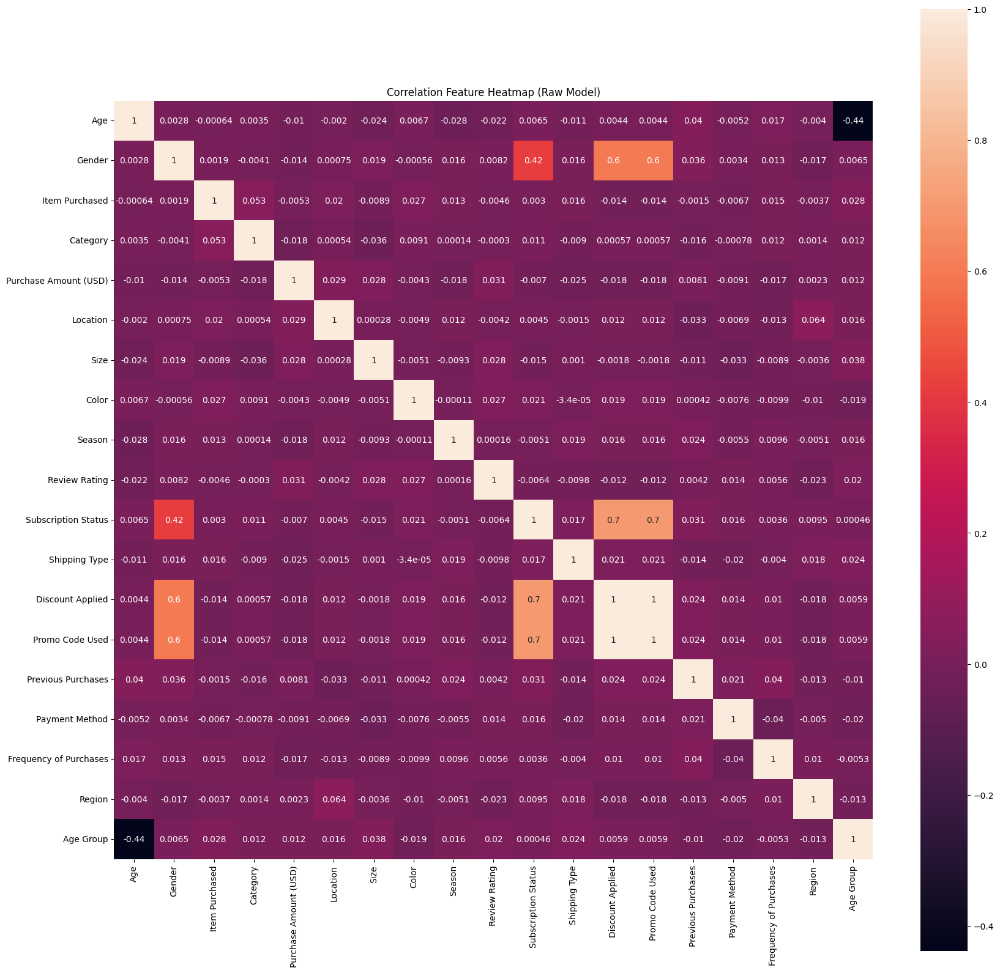

In [ ]:
corrmat = nan_process_data.corr(method='pearson')
f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corrmat, annot=True, vmax=1, square=True);
plt.title('Correlation Feature Heatmap (Raw Model)');
plt.show()

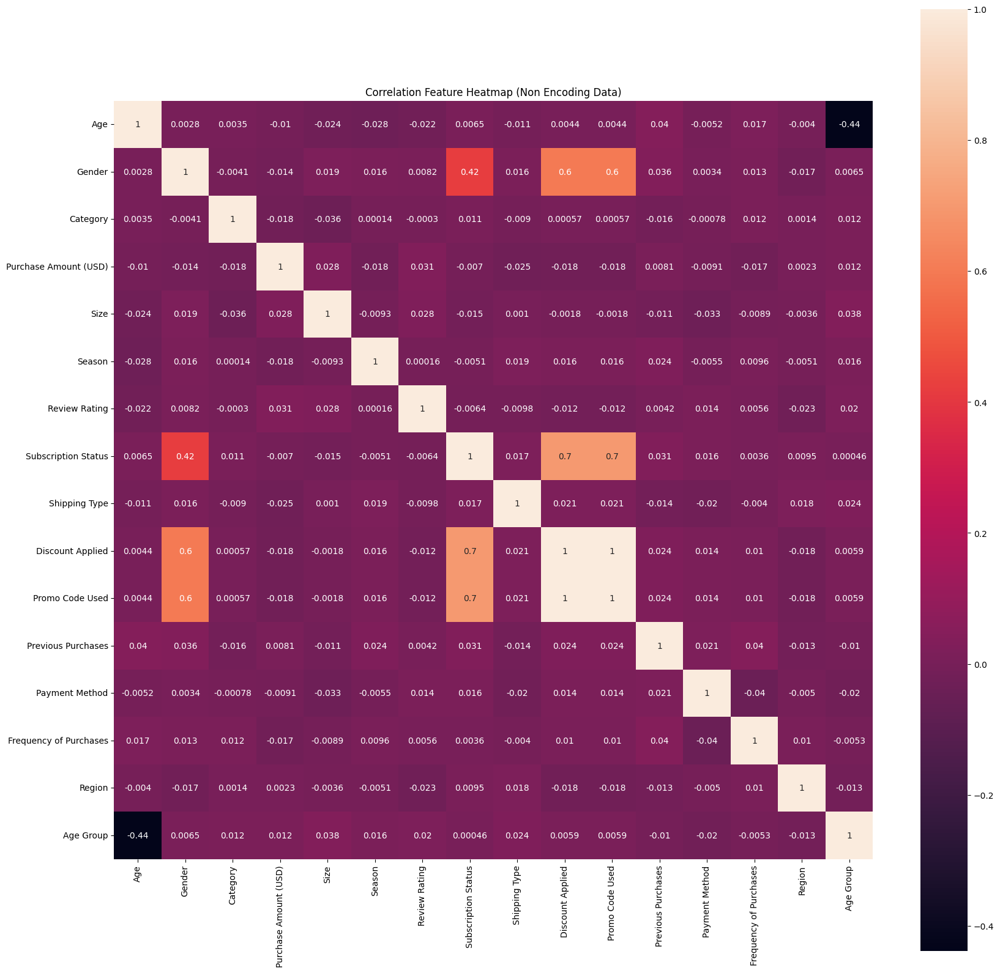

In [ ]:
corrmat = nan_encoding_data.corr(method='pearson')
f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corrmat, annot=True, vmax=1, square=True);
plt.title('Correlation Feature Heatmap (Non Encoding Data)');
plt.show()

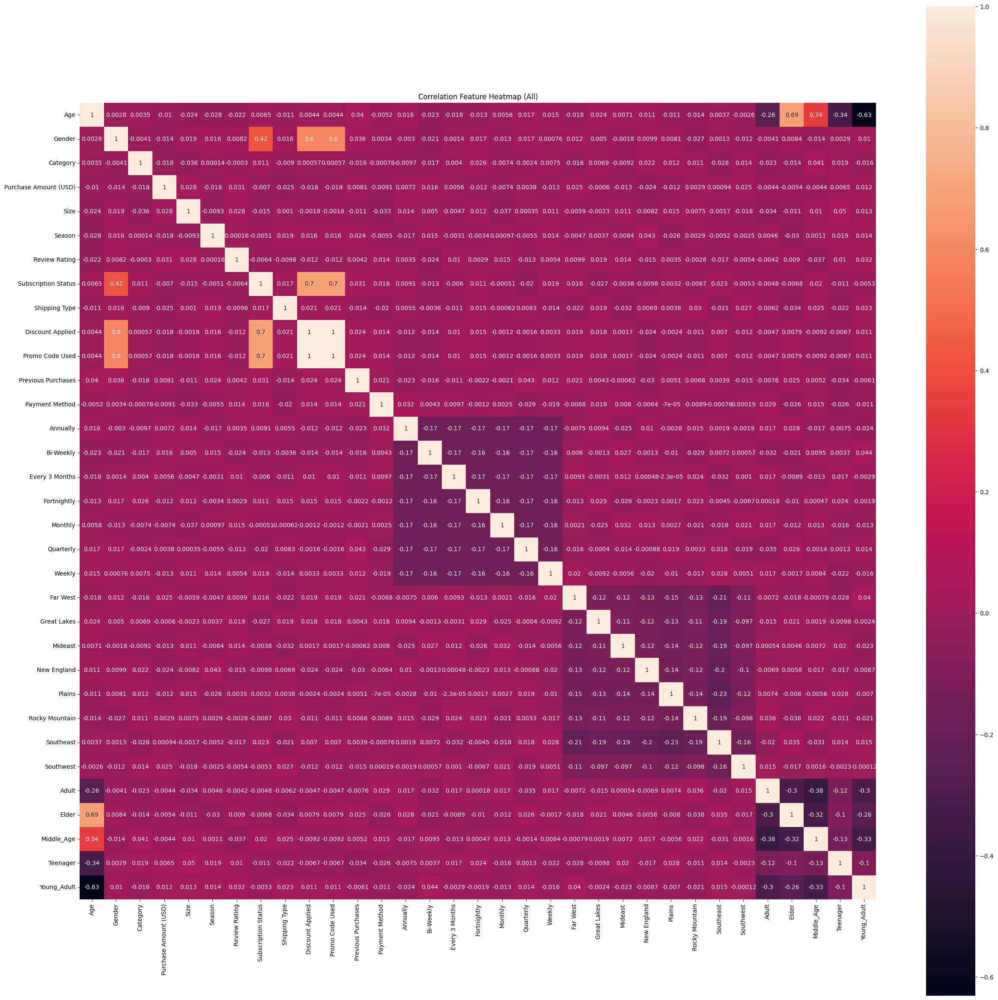

In [ ]:
corrmat = processed_data.corr(method='pearson')
f, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(corrmat, annot=True, vmax=1, square=True);
plt.title('Correlation Feature Heatmap (All)');
plt.show()

## Feature Selection Using Embedded Method

In [ ]:
# This doesnt use, bc WE ACTUALLY DONT USE RANDOMFORESTCLASSIFIER

# model = RandomForestClassifier(n_estimators=100, random_state=42)
# model.fit(X_train, y_train)

# feature_importances = model.feature_importances_

# importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})
# importances_df = importances_df.sort_values(by='Importance', ascending=False)

# plt.figure(figsize=(10, 6))
# plt.barh(importances_df['Feature'], importances_df['Importance'])
# plt.xlabel('Importance')
# plt.ylabel('Feature')
# plt.title('Feature Importance')
# plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

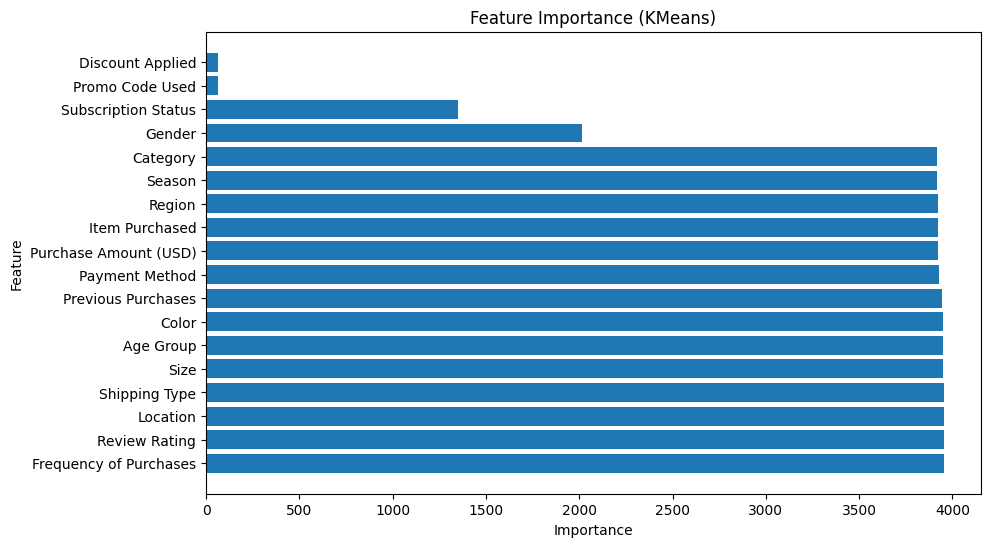

In [ ]:
from sklearn.cluster import KMeans
import numpy as np

def calculate_inertia(X, k):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    return kmeans.inertia_

def feature_importance_kmeans(X, k):
    baseline_inertia = calculate_inertia(X, k)
    importances = []
    for feature in range(X.shape[1]):
        X_subset = np.delete(X, feature, axis=1)
        inertia = calculate_inertia(X_subset, k)
        importance = baseline_inertia - inertia
        importances.append(importance)
    return importances

# Example usage:
X = X_train_raw.values
k = 5  # Number of clusters
feature_importances = feature_importance_kmeans(X, k)

# Create DataFrame for visualization
importances_df = pd.DataFrame({'Feature': X_train_raw.columns, 'Importance': feature_importances})
importances_df = importances_df.sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(importances_df['Feature'], importances_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance (KMeans)')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

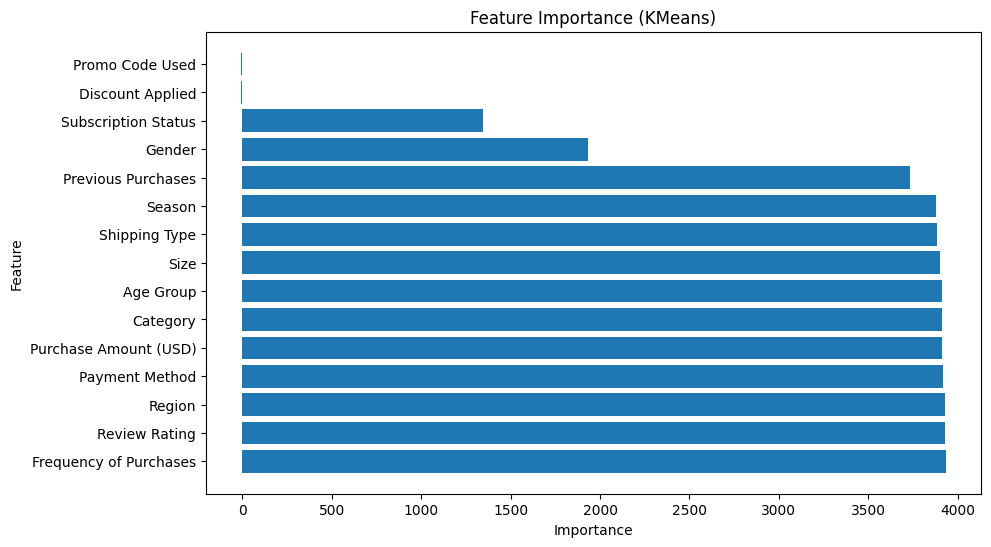

In [ ]:
# Example usage:
X = X_train_enco.values  # Assuming X_train is your feature matrix
k = 5  # Number of clusters
feature_importances = feature_importance_kmeans(X, k)

# Create DataFrame for visualization
importances_df = pd.DataFrame({'Feature': X_train_enco.columns, 'Importance': feature_importances})
importances_df = importances_df.sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(importances_df['Feature'], importances_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance (KMeans)')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

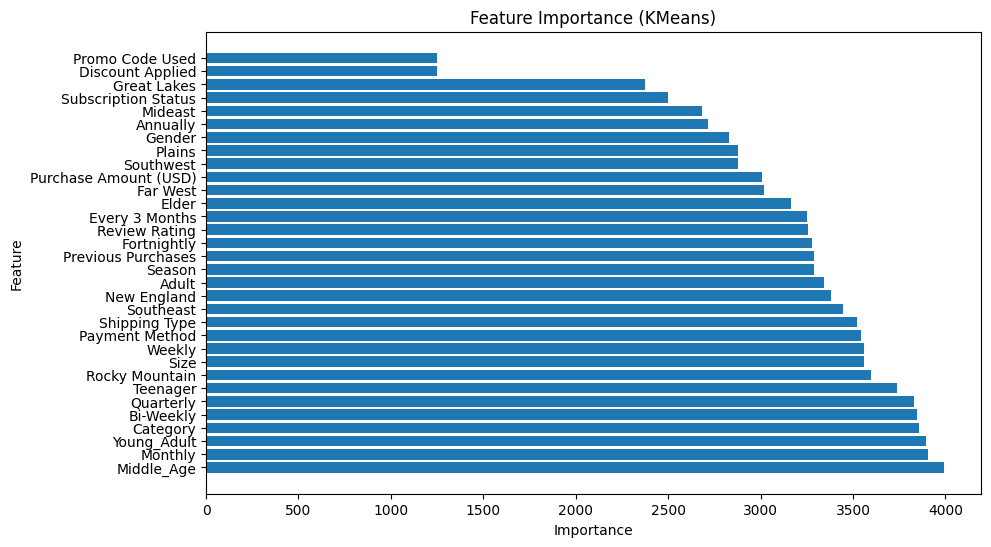

In [ ]:
# Example usage:
X = X_train.values  # Assuming X_train is your feature matrix
k = 5  # Number of clusters
feature_importances = feature_importance_kmeans(X, k)

# Create DataFrame for visualization
importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})
importances_df = importances_df.sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(importances_df['Feature'], importances_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance (KMeans)')
plt.show()

In [ ]:
clus_score = pd.DataFrame(columns=["Model", "Silhouette Score"])

In [ ]:
X_column = 'Age'
y_column = 'Purchase Amount (USD)'

# Modeling (All Preprocessing)

## Preparing

In [ ]:
processed_data.head()

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,...,New England,Plains,Rocky Mountain,Southeast,Southwest,Adult,Elder,Middle_Age,Teenager,Young_Adult
0,55,1,1,53,0,3,3.1,1,1,1,...,0,0,0,1,0,0,0,1,0,0
1,19,1,1,64,0,3,3.1,1,1,1,...,1,0,0,0,0,0,0,0,1,0
2,50,1,1,73,2,1,3.1,1,2,1,...,1,0,0,0,0,0,0,1,0,0
3,21,1,2,90,1,1,3.5,1,3,1,...,1,0,0,0,0,0,0,0,0,1
4,45,1,1,49,1,1,2.7,1,2,1,...,0,0,0,0,0,0,0,1,0,0


Target pertama, yaitu hubungan Age dengan Purchase Amount (USD)
Target kedua, yaitu hubungan Age, Purchase Amount, Review Rating dan Category
Target ketiga, yaitu hubungan Age, Purchase Amount, Review Rating
Target keempat, semua

In [ ]:
X = processed_data[[ 'Age', 'Purchase Amount (USD)']]
X.head()

,Age,Purchase Amount (USD)
0,55,53
1,19,64
2,50,73
3,21,90
4,45,49


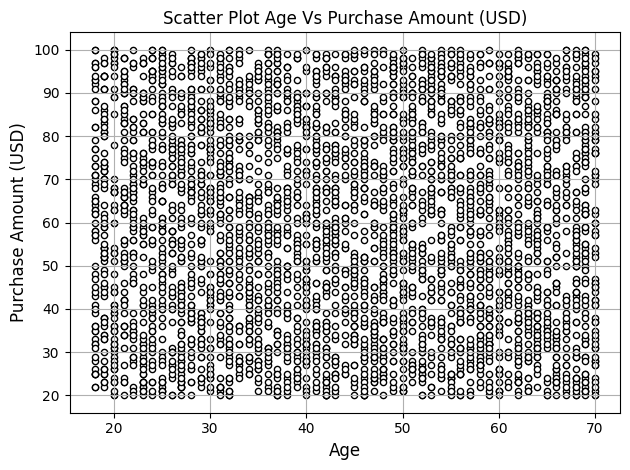

In [ ]:
plt.scatter(processed_data[X_column],
            processed_data[y_column],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)
plt.tight_layout()
plt.show()

## Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X)

X_scaled = scaler.transform(X)

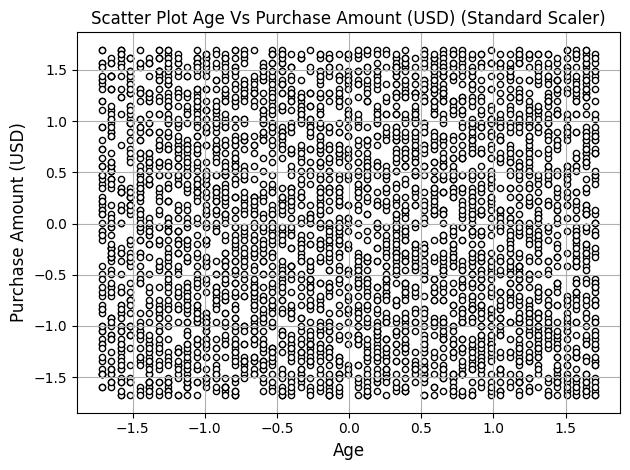

In [ ]:
plt.scatter(X_scaled[:, 0],
            X_scaled[:, 1],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title(f"Scatter Plot {X_column} Vs {y_column} (Standard Scaler)")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)

X_scaled_mm = scaler.transform(X)

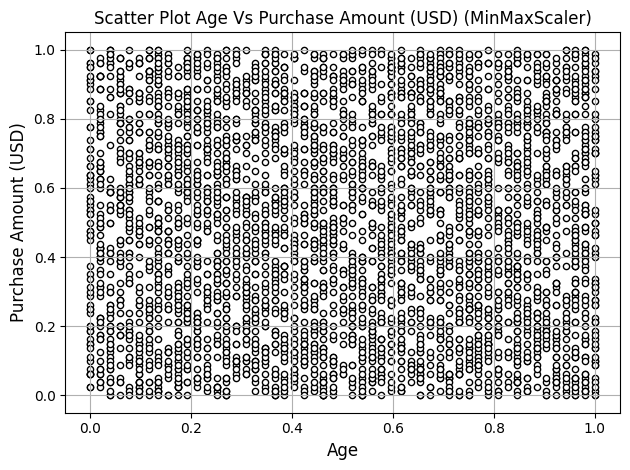

In [ ]:
plt.scatter(X_scaled_mm[:, 0],
            X_scaled_mm[:, 1],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title(f"Scatter Plot {X_column} Vs {y_column} (MinMaxScaler)")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)
plt.tight_layout()
plt.show()

## KMeans Clustering

In [ ]:
from sklearn.cluster import KMeans

# n_init : cara inisilisasi
km = KMeans(n_clusters=4, random_state=45, n_init="auto")
km.fit(X_scaled)

y_km = km.predict(X_scaled)

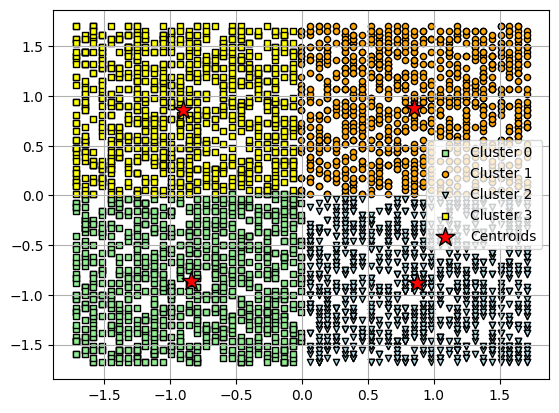

In [ ]:
plt.scatter(X_scaled[y_km == 0, 0],
            X_scaled[y_km == 0, 1],
            s=20,
            c='lightgreen',
            marker='s',
            edgecolor='black',
            label='Cluster 0')

plt.scatter(X_scaled[y_km == 1, 0],
            X_scaled[y_km == 1, 1],
            s=20, c='orange',
            marker='o',
            edgecolor='black',
            label='Cluster 1')

plt.scatter(X_scaled[y_km == 2, 0],
            X_scaled[y_km == 2, 1],
            s=20, c='lightblue',
            marker='v',
            edgecolor='black',
            label='Cluster 2')

plt.scatter(X_scaled[y_km == 3, 0],
            X_scaled[y_km == 3, 1],
            s=20, c='yellow',
            marker='s',
            edgecolor='black',
            label='Cluster 3')

plt.scatter(km.cluster_centers_[:, 0],
            km.cluster_centers_[:, 1],
            s=200, marker='*',
            c='red',
            edgecolor='black',
            label='Centroids')

plt.legend(scatterpoints=1)
plt.grid()

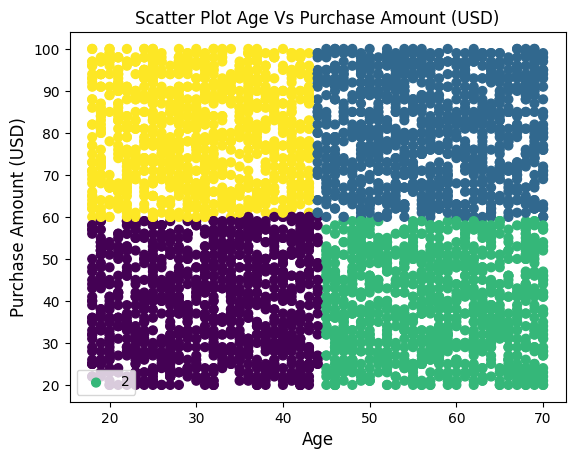

In [ ]:
# Plot clusters
plt.scatter(X[X_column], X[y_column], c=y_km, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km)
plt.show()

In [ ]:
km_mm = KMeans(n_clusters=4, random_state=45, n_init="auto")
km_mm.fit(X_scaled_mm)

y_km_mm = km_mm.predict(X_scaled_mm)

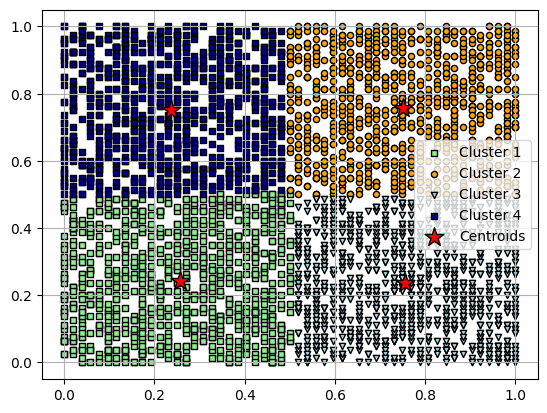

In [ ]:
plt.scatter(X_scaled_mm[y_km_mm == 0, 0],
            X_scaled_mm[y_km_mm == 0, 1],
            s=20,
            c='lightgreen',
            marker='s',
            edgecolor='black',
            label='Cluster 1')

plt.scatter(X_scaled_mm[y_km_mm == 1, 0],
            X_scaled_mm[y_km_mm == 1, 1],
            s=20, c='orange',
            marker='o',
            edgecolor='black',
            label='Cluster 2')

plt.scatter(X_scaled_mm[y_km_mm == 2, 0],
            X_scaled_mm[y_km_mm == 2, 1],
            s=20, c='lightblue',
            marker='v',
            edgecolor='black',
            label='Cluster 3')

plt.scatter(X_scaled_mm[y_km_mm == 3, 0],
            X_scaled_mm[y_km_mm == 3, 1],
            s=20, c='darkblue',
            marker='s',
            edgecolor='black',
            label='Cluster 4')

plt.scatter(km_mm.cluster_centers_[:, 0],
            km_mm.cluster_centers_[:, 1],
            s=200, marker='*',
            c='red',
            edgecolor='black',
            label='Centroids')

plt.legend(scatterpoints=1)
plt.grid()

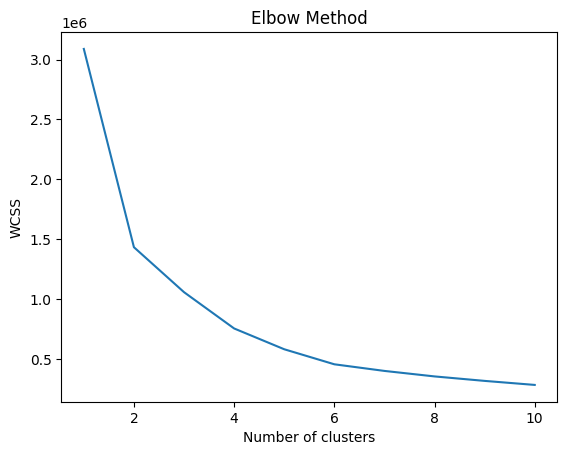

In [ ]:
from sklearn.cluster import KMeans

features = process_data[[X_column, y_column]]

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=500, n_init=10, random_state=0)
    kmeans.fit(features)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

In [ ]:
score = silhouette_score(X_scaled, y_km)

new_row = {"Model": f"K-Means {X_column} {y_column} SS", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
12,K-Means Age Purchase Amount (USD) SS,0.413762
10,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.361019
11,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.360399
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
7,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350477
8,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.329177
9,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.327325
5,Gaussian Age Purchase Amount (USD) MM,0.119157
1,K-Means Age Purchase Amount (USD) MM,0.118994
0,K-Means Age Purchase Amount (USD) SS,0.103666


In [ ]:
score = silhouette_score(X_scaled_mm, y_km_mm)

new_row = {"Model": f"K-Means {X_column} {y_column} MM", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
12,K-Means Age Purchase Amount (USD) SS,0.413762
13,K-Means Age Purchase Amount (USD) MM,0.413725
10,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.361019
11,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.360399
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
7,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350477
8,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.329177
9,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.327325
5,Gaussian Age Purchase Amount (USD) MM,0.119157
1,K-Means Age Purchase Amount (USD) MM,0.118994


In [ ]:
pd.DataFrame(y_km).value_counts()

1    987
0    977
2    972
3    964
dtype: int64

In [ ]:
kmeans = pd.DataFrame(y_km, columns=["KMeans Cluster"])
kmeans

,KMeans Cluster
0,2
1,3
2,1
3,3
4,2
...,...
3895,0
3896,2
3897,2
3898,1


## Agglomerative Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit model and predict clusters
y_pred = AC.fit_predict(X_scaled)

score = silhouette_score(X_scaled, y_pred)
print(f"Silhouette Score: {score}")

Silhouette Score: 0.3723963462947772


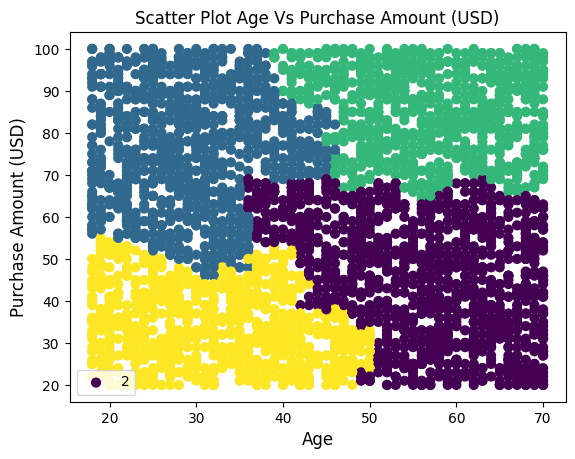

In [ ]:
# Plot clusters
plt.scatter(X[X_column], X[y_column], c=y_pred, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km)
plt.show()

In [ ]:
# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit model and predict clusters
y_pred_mm = AC.fit_predict(X_scaled_mm)

score = silhouette_score(X_scaled_mm, y_pred_mm)
print(f"Silhouette Score: {score}")

Silhouette Score: 0.35009510587047377


In [ ]:
np.unique(y_km_mm)

array([0, 1, 2, 3], dtype=int32)

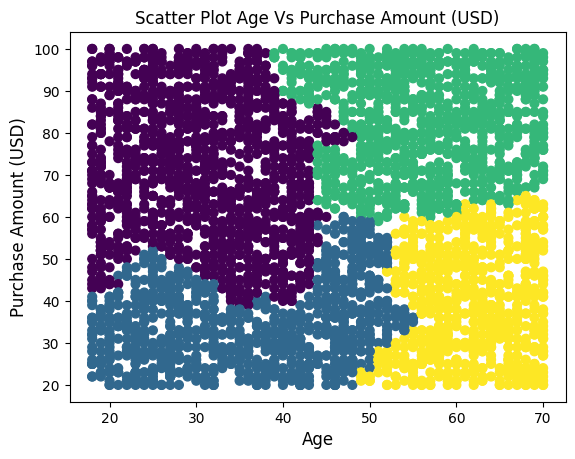

In [ ]:
# Plot clusters
plt.scatter(X[X_column], X[y_column], c=y_pred_mm, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.show()

In [ ]:
ahc = pd.DataFrame(y_pred, columns=["AHC Cluster"])
ahc

,AHC Cluster
0,0
1,1
2,2
3,1
4,0
...,...
3895,3
3896,0
3897,3
3898,1


In [ ]:
score = silhouette_score(X_scaled, y_pred)

new_row = {"Model": f"AHC {X_column} {y_column} SS", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
12,K-Means Age Purchase Amount (USD) SS,0.413762
13,K-Means Age Purchase Amount (USD) MM,0.413725
14,AHC Age Purchase Amount (USD) SS,0.372396
10,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.361019
11,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.360399
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
7,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350477
8,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.329177
9,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.327325
5,Gaussian Age Purchase Amount (USD) MM,0.119157


In [ ]:
score = silhouette_score(X_scaled_mm, y_pred_mm)

new_row = {"Model": f"AHC {X_column} {y_column} MM", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
12,K-Means Age Purchase Amount (USD) SS,0.413762
13,K-Means Age Purchase Amount (USD) MM,0.413725
14,AHC Age Purchase Amount (USD) SS,0.372396
10,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.361019
11,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.360399
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
7,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350477
15,AHC Age Purchase Amount (USD) MM,0.350095
8,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.329177
9,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.327325


## Density Based Spatial Clustering of Applications with Noise (DBSCAN)

In [ ]:
from sklearn.cluster import DBSCAN

In [ ]:
# from sklearn.cluster import DBSCAN
# from sklearn.preprocessing import StandardScaler
# from sklearn.metrics import silhouette_score

# # Inisialisasi model DBSCAN
# DB = DBSCAN(eps=0.5, min_samples=5)

# # Melakukan prediksi klaster dengan DBSCAN
# y_pred_db = DB.fit_predict(X_scaled)

# # Menghitung Silhouette Score
# score_db = silhouette_score(X_scaled, y_pred_db)
# print(f"Silhouette Score: {score_db}")

In [ ]:
# labels = DB.labels_

# n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
# n_clusters

## Gaussian Mixture Model


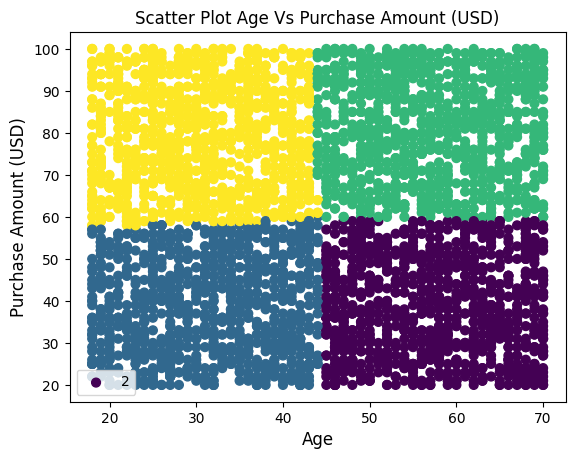

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.mixture import GaussianMixture

# Create an instance of Gaussian Mixture Model
gmm = GaussianMixture(n_components=4, random_state=42)

# Fit the model to the data
gmm.fit(X_scaled)

# Predict cluster labels
labels = gmm.predict(X_scaled)

# Plot clusters
plt.scatter(X[X_column], X[y_column], c=labels, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km)
plt.show()

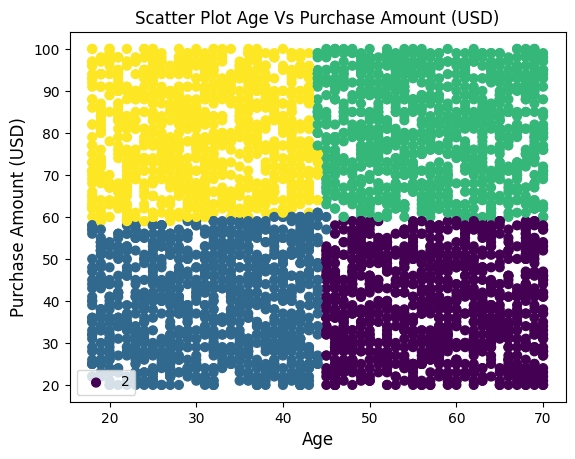

In [ ]:
# Create an instance of Gaussian Mixture Model
gmm = GaussianMixture(n_components=4, random_state=42)

# Fit the model to the data
gmm.fit(X_scaled_mm)

# Predict cluster labels
labels_mm = gmm.predict(X_scaled_mm)

# Plot clusters
plt.scatter(X[X_column], X[y_column], c=labels_mm, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km)
plt.show()

In [ ]:
silhouette_avg = silhouette_score(X_scaled, labels)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.41362385876442215


In [ ]:
silhouette_avg = silhouette_score(X_scaled_mm, labels_mm)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.41361499873161905


In [ ]:
score = silhouette_score(X_scaled, labels)

new_row = {"Model": f"Gaussian {X_column} {y_column} SS", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
12,K-Means Age Purchase Amount (USD) SS,0.413762
13,K-Means Age Purchase Amount (USD) MM,0.413725
16,Gaussian Age Purchase Amount (USD) SS,0.413624
14,AHC Age Purchase Amount (USD) SS,0.372396
10,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.361019
11,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.360399
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
7,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350477
15,AHC Age Purchase Amount (USD) MM,0.350095
8,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.329177


In [ ]:
score = silhouette_score(X_scaled_mm, labels_mm)

new_row = {"Model": f"Gaussian {X_column} {y_column} MM", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
12,K-Means Age Purchase Amount (USD) SS,0.413762
13,K-Means Age Purchase Amount (USD) MM,0.413725
16,Gaussian Age Purchase Amount (USD) SS,0.413624
17,Gaussian Age Purchase Amount (USD) MM,0.413615
14,AHC Age Purchase Amount (USD) SS,0.372396
10,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.361019
11,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.360399
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
7,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350477
15,AHC Age Purchase Amount (USD) MM,0.350095


In [ ]:
gauss = pd.DataFrame(labels, columns=["Gaussian Cluster"])
gauss

,Gaussian Cluster
0,0
1,3
2,2
3,3
4,0
...,...
3895,1
3896,0
3897,0
3898,2


## Mean-Shift clustering algorithm

In [ ]:
# from numpy import unique
# from numpy import where
# from matplotlib import pyplot
# from sklearn.datasets import make_classification
# from sklearn.cluster import MeanShift

# # define the model
# mean_model = MeanShift()

# # assign each data point to a cluster
# mean_result = mean_model.fit_predict(X_scaled)

# # get all of the unique clusters
# mean_clusters = unique(mean_result)

# # plot Mean-Shift the clusters
# for mean_cluster in mean_clusters:
#     # get data points that fall in this cluster
#     index = where(mean_result == mean_cluster)
#     # make the plot
#     pyplot.scatter(training_data[index, 0], training_data[index, 1])

# # show the Mean-Shift plot
# pyplot.show()

In [ ]:
# from sklearn.metrics import silhouette_score

# # Menghitung Silhouette Score
# silhouette_avg = silhouette_score(training_data, mean_result)
# print("Silhouette Score:", silhouette_avg)

## Evaluation

In [ ]:
from sklearn import metrics

def evaluate_clustering(labels_pred, data):
    print("Silhouette Score:", metrics.silhouette_score(data, labels_pred))
    print("Davies-Bouldin Index:", metrics.davies_bouldin_score(data, labels_pred))
    print("Calinski-Harabasz Index:", metrics.calinski_harabasz_score(data, labels_pred))
    # print("Dunn Index:", metrics.dunn_index(data, labels_pred))

In [ ]:
print("KMeans Clustering SS")
evaluate_clustering(y_km, X_scaled)

KMeans Clustering SS
Silhouette Score: 0.41376239328224496
Davies-Bouldin Index: 0.7619117599818386
Calinski-Harabasz Index: 3988.3176730254827


In [ ]:
print("KMeans Clustering MM")
evaluate_clustering(y_km_mm, X_scaled_mm)

KMeans Clustering MM
Silhouette Score: 0.4137246717263106
Davies-Bouldin Index: 0.7633413236110045
Calinski-Harabasz Index: 3988.927682908915


In [ ]:
print("Agglomerative Clustering SS")
evaluate_clustering(y_pred, X_scaled)

Agglomerative Clustering SS
Silhouette Score: 0.3723963462947772
Davies-Bouldin Index: 0.8328613808231153
Calinski-Harabasz Index: 3331.272482643654


In [ ]:
print("Agglomerative Clustering MM")
evaluate_clustering(y_pred_mm, X_scaled_mm)

Agglomerative Clustering MM
Silhouette Score: 0.35009510587047377
Davies-Bouldin Index: 0.8865070706124719
Calinski-Harabasz Index: 3096.5116826111835


In [ ]:
print("Gaussian Mixture Model SS")
evaluate_clustering(labels, X_scaled)

Gaussian Mixture Model SS
Silhouette Score: 0.41362385876442215
Davies-Bouldin Index: 0.7632915807747257
Calinski-Harabasz Index: 3985.2887484337352


In [ ]:
print("Gaussian Mixture Model MM")
evaluate_clustering(labels_mm, X_scaled_mm)

Gaussian Mixture Model MM
Silhouette Score: 0.41361499873161905
Davies-Bouldin Index: 0.7655228207891792
Calinski-Harabasz Index: 3986.49994806036


# Modeling (Nan Process Data)

## Preparing

In [ ]:
nan_process_data.head()

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group
0,55,1,2,1,53,16,0,7,3,3.1,1,1,1,1,14,5,3,6,2
1,19,1,23,1,64,18,0,12,3,3.1,1,1,1,1,2,1,3,3,3
2,50,1,11,1,73,20,2,12,1,3.1,1,2,1,1,23,2,6,3,2
3,21,1,14,2,90,38,1,12,1,3.5,1,3,1,1,49,4,6,3,4
4,45,1,2,1,49,36,1,21,1,2.7,1,2,1,1,31,4,0,0,2


Target pertama, yaitu hubungan Age dengan Purchase Amount (USD)
Target kedua, yaitu hubungan Age, Purchase Amount, Review Rating dan Category
Target ketiga, yaitu hubungan Age, Purchase Amount, Review Rating
Target keempat, semua

In [ ]:
# X_column = 'Location'

In [ ]:
X = nan_process_data[['Frequency of Purchases', 'Review Rating', 'Location', 'Shipping Type', 'Size', 'Age', 'Purchase Amount (USD)']]
X.head()

,Age,Purchase Amount (USD)
0,55,53
1,19,64
2,50,73
3,21,90
4,45,49


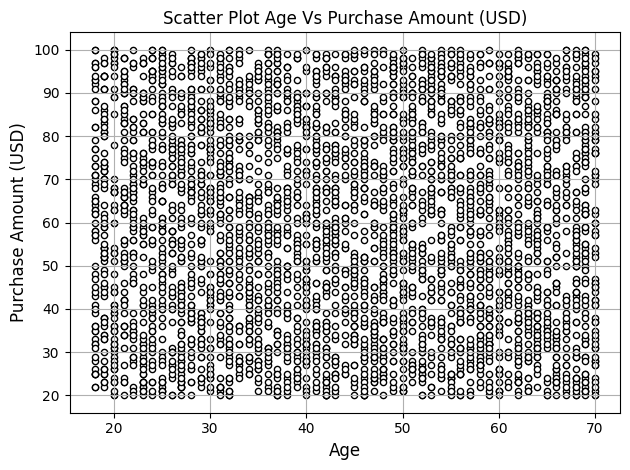

In [ ]:
plt.scatter(nan_process_data[X_column],
            nan_process_data[y_column],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)
plt.tight_layout()
plt.show()

## Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X)

X_scaled = scaler.transform(X)

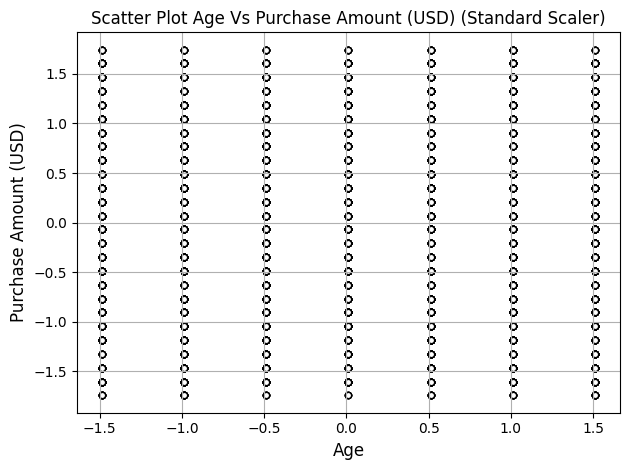

In [ ]:
plt.scatter(X_scaled[:, 0],
            X_scaled[:, 1],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title(f"Scatter Plot {X_column} Vs {y_column} (Standard Scaler)")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)

X_scaled_mm = scaler.transform(X)

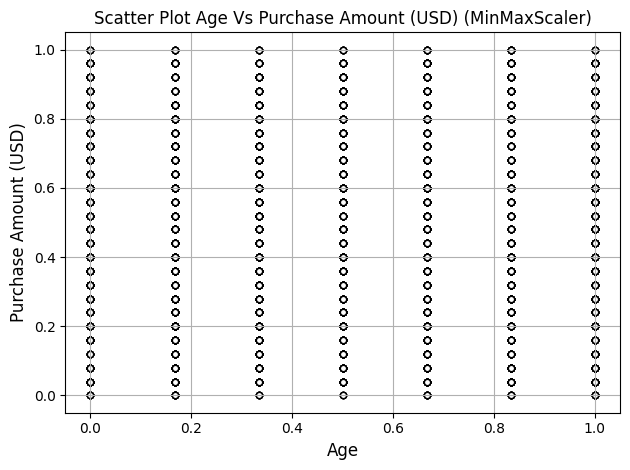

In [ ]:
plt.scatter(X_scaled_mm[:, 0],
            X_scaled_mm[:, 1],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title(f"Scatter Plot {X_column} Vs {y_column} (MinMaxScaler)")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)
plt.tight_layout()
plt.show()

## KMeans Clustering

In [ ]:
from sklearn.cluster import KMeans

# n_init : cara inisilisasi
km = KMeans(n_clusters=4, random_state=45, n_init="auto")
km.fit(X_scaled)

y_km = km.predict(X_scaled)

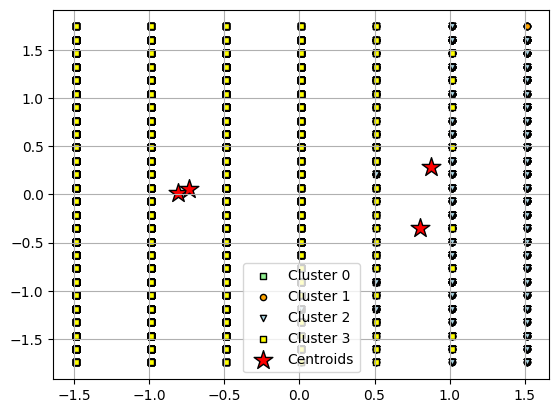

In [ ]:
plt.scatter(X_scaled[y_km == 0, 0],
            X_scaled[y_km == 0, 1],
            s=20,
            c='lightgreen',
            marker='s',
            edgecolor='black',
            label='Cluster 0')

plt.scatter(X_scaled[y_km == 1, 0],
            X_scaled[y_km == 1, 1],
            s=20, c='orange',
            marker='o',
            edgecolor='black',
            label='Cluster 1')

plt.scatter(X_scaled[y_km == 2, 0],
            X_scaled[y_km == 2, 1],
            s=20, c='lightblue',
            marker='v',
            edgecolor='black',
            label='Cluster 2')

plt.scatter(X_scaled[y_km == 3, 0],
            X_scaled[y_km == 3, 1],
            s=20, c='yellow',
            marker='s',
            edgecolor='black',
            label='Cluster 3')

plt.scatter(km.cluster_centers_[:, 0],
            km.cluster_centers_[:, 1],
            s=200, marker='*',
            c='red',
            edgecolor='black',
            label='Centroids')

plt.legend(scatterpoints=1)
plt.grid()

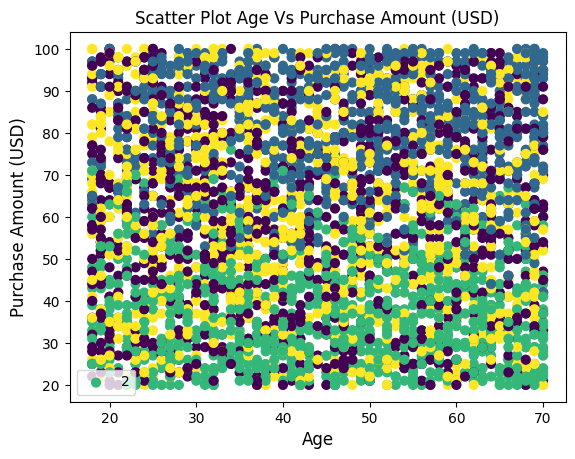

In [ ]:
# Plot clusters
plt.scatter(X[X_column], X[y_column], c=y_km, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km)
plt.show()

In [ ]:
km_mm = KMeans(n_clusters=4, random_state=45, n_init="auto")
km_mm.fit(X_scaled_mm)

y_km_mm = km_mm.predict(X_scaled_mm)

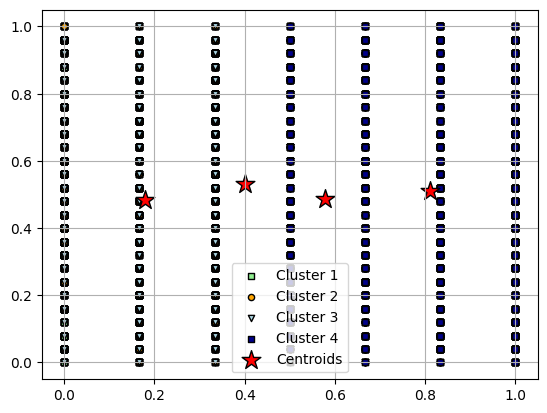

In [ ]:
plt.scatter(X_scaled_mm[y_km_mm == 0, 0],
            X_scaled_mm[y_km_mm == 0, 1],
            s=20,
            c='lightgreen',
            marker='s',
            edgecolor='black',
            label='Cluster 1')

plt.scatter(X_scaled_mm[y_km_mm == 1, 0],
            X_scaled_mm[y_km_mm == 1, 1],
            s=20, c='orange',
            marker='o',
            edgecolor='black',
            label='Cluster 2')

plt.scatter(X_scaled_mm[y_km_mm == 2, 0],
            X_scaled_mm[y_km_mm == 2, 1],
            s=20, c='lightblue',
            marker='v',
            edgecolor='black',
            label='Cluster 3')

plt.scatter(X_scaled_mm[y_km_mm == 3, 0],
            X_scaled_mm[y_km_mm == 3, 1],
            s=20, c='darkblue',
            marker='s',
            edgecolor='black',
            label='Cluster 4')

plt.scatter(km_mm.cluster_centers_[:, 0],
            km_mm.cluster_centers_[:, 1],
            s=200, marker='*',
            c='red',
            edgecolor='black',
            label='Centroids')

plt.legend(scatterpoints=1)
plt.grid()

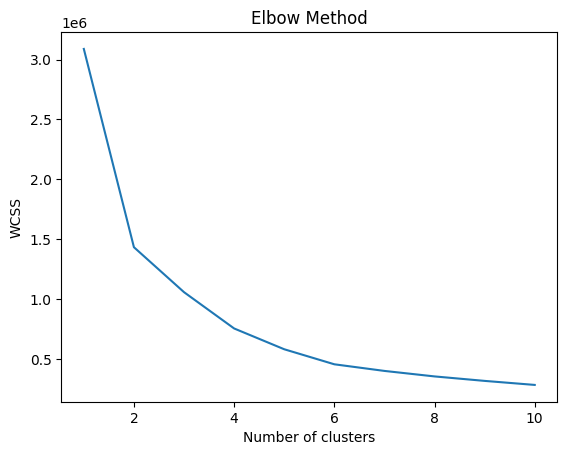

In [ ]:
from sklearn.cluster import KMeans

# features = process_data[[X_column, y_column]]

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=500, n_init=10, random_state=0)
    kmeans.fit(features)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

In [ ]:
score = silhouette_score(X_scaled, y_km)

new_row = {"Model": f"(Nan Process Data) K-Means {X_column} {y_column} SS", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
5,Gaussian Age Purchase Amount (USD) MM,0.383519
3,AHC Age Purchase Amount (USD) MM,0.349366
2,AHC Age Purchase Amount (USD) SS,0.310542
4,Gaussian Age Purchase Amount (USD) SS,0.279555
1,K-Means Age Purchase Amount (USD) MM,0.262552
0,K-Means Age Purchase Amount (USD) SS,0.230290
6,(Nan Process Data) K-Means Age Purchase Amount...,0.097441


In [ ]:
score = silhouette_score(X_scaled_mm, y_km_mm)

new_row = {"Model": f"(Nan Process Data) K-Means {X_column} {y_column} MM", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
5,Gaussian Age Purchase Amount (USD) MM,0.383519
3,AHC Age Purchase Amount (USD) MM,0.349366
2,AHC Age Purchase Amount (USD) SS,0.310542
4,Gaussian Age Purchase Amount (USD) SS,0.279555
1,K-Means Age Purchase Amount (USD) MM,0.262552
0,K-Means Age Purchase Amount (USD) SS,0.230290
7,(Nan Process Data) K-Means Age Purchase Amount...,0.116115
6,(Nan Process Data) K-Means Age Purchase Amount...,0.097441


In [ ]:
pd.DataFrame(y_km).value_counts()

3    1039
0     992
2     963
1     906
dtype: int64

In [ ]:
kmeanss = pd.DataFrame(y_km, columns=["KMeans Cluster"])
kmeanss

,KMeans Cluster
0,2
1,0
2,1
3,1
4,0
...,...
3895,2
3896,3
3897,2
3898,1


## Agglomerative Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit model and predict clusters
y_pred = AC.fit_predict(X_scaled)

score = silhouette_score(X_scaled, y_pred)
print(f"Silhouette Score: {score}")

Silhouette Score: 0.05321860058175387


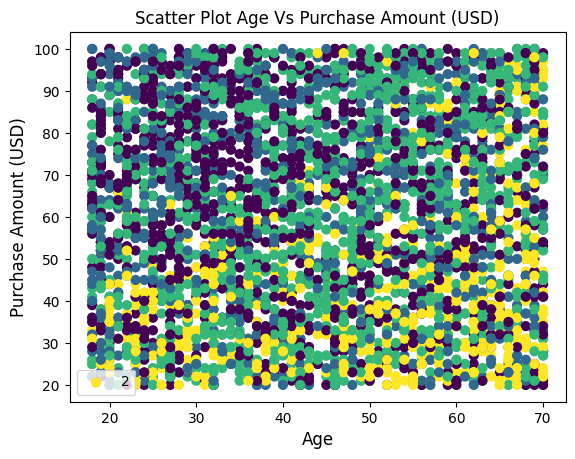

In [ ]:
# Plot clusters
plt.scatter(X[X_column], X[y_column], c=y_pred, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km)
plt.show()

In [ ]:
# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit model and predict clusters
y_pred_mm = AC.fit_predict(X_scaled_mm)

score = silhouette_score(X_scaled_mm, y_pred_mm)
print(f"Silhouette Score: {score}")

Silhouette Score: 0.07017308434592164


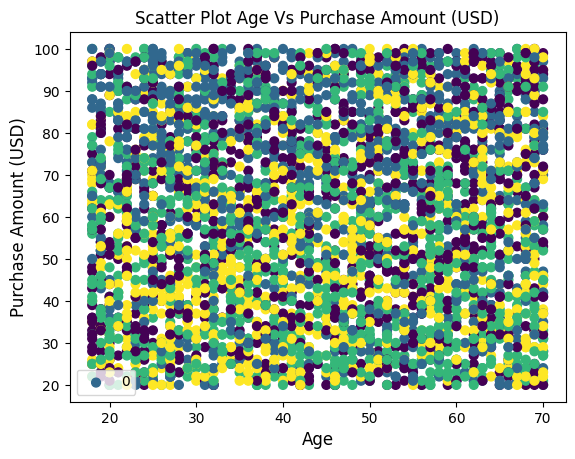

In [ ]:
# Plot clusters
plt.scatter(X[X_column], X[y_column], c=y_pred_mm, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km_mm)
plt.show()

In [ ]:
ahc = pd.DataFrame(y_pred, columns=["AHC Cluster"])
ahc

,AHC Cluster
0,3
1,1
2,0
3,2
4,2
...,...
3895,3
3896,1
3897,2
3898,0


In [ ]:
score = silhouette_score(X_scaled, y_pred)

new_row = {"Model": f"(Nan Process Data) AHC {X_column} {y_column} SS", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
5,Gaussian Age Purchase Amount (USD) MM,0.383519
3,AHC Age Purchase Amount (USD) MM,0.349366
2,AHC Age Purchase Amount (USD) SS,0.310542
4,Gaussian Age Purchase Amount (USD) SS,0.279555
1,K-Means Age Purchase Amount (USD) MM,0.262552
0,K-Means Age Purchase Amount (USD) SS,0.230290
7,(Nan Process Data) K-Means Age Purchase Amount...,0.116115
6,(Nan Process Data) K-Means Age Purchase Amount...,0.097441
8,(Nan Process Data) AHC Age Purchase Amount (US...,0.053219


In [ ]:
score = silhouette_score(X_scaled_mm, y_pred_mm)

new_row = {"Model": f"(Nan Process Data) AHC {X_column} {y_column} MM", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
5,Gaussian Age Purchase Amount (USD) MM,0.383519
3,AHC Age Purchase Amount (USD) MM,0.349366
2,AHC Age Purchase Amount (USD) SS,0.310542
4,Gaussian Age Purchase Amount (USD) SS,0.279555
1,K-Means Age Purchase Amount (USD) MM,0.262552
0,K-Means Age Purchase Amount (USD) SS,0.230290
7,(Nan Process Data) K-Means Age Purchase Amount...,0.116115
6,(Nan Process Data) K-Means Age Purchase Amount...,0.097441
9,(Nan Process Data) AHC Age Purchase Amount (US...,0.070173
8,(Nan Process Data) AHC Age Purchase Amount (US...,0.053219


## Gaussian Mixture Model


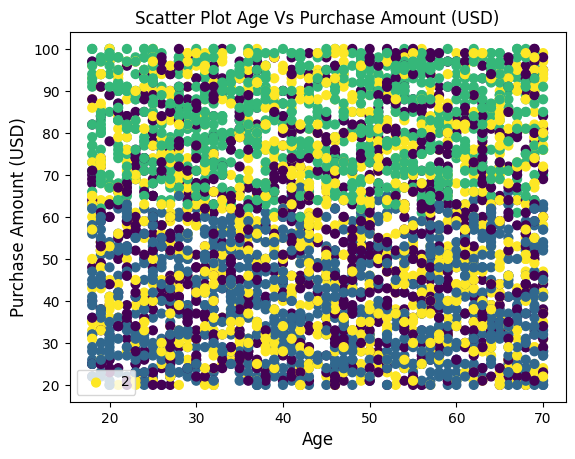

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.mixture import GaussianMixture

# Create an instance of Gaussian Mixture Model
gmm = GaussianMixture(n_components=4, random_state=42)

# Fit the model to the data
gmm.fit(X_scaled)

# Predict cluster labels
labels = gmm.predict(X_scaled)

# Plot clusters
plt.scatter(X[X_column], X[y_column], c=labels, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km)
plt.show()

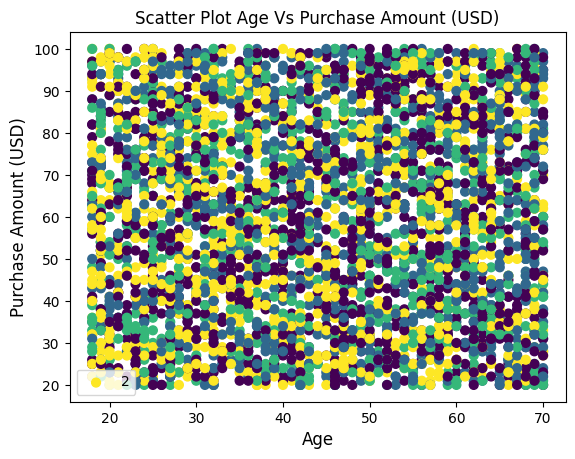

In [ ]:
# Create an instance of Gaussian Mixture Model
gmm = GaussianMixture(n_components=4, random_state=42)

# Fit the model to the data
gmm.fit(X_scaled_mm)

# Predict cluster labels
labels_mm = gmm.predict(X_scaled_mm)

# Plot clusters
plt.scatter(X[X_column], X[y_column], c=labels_mm, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km)
plt.show()

In [ ]:
silhouette_avg = silhouette_score(X_scaled, labels)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.09541149986272633


In [ ]:
silhouette_avg = silhouette_score(X_scaled_mm, labels_mm)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.11147024466443575


In [ ]:
score = silhouette_score(X_scaled, labels)

new_row = {"Model": f"(Nan Process Data) Gaussian {X_column} {y_column} SS", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
5,Gaussian Age Purchase Amount (USD) MM,0.383519
3,AHC Age Purchase Amount (USD) MM,0.349366
2,AHC Age Purchase Amount (USD) SS,0.310542
4,Gaussian Age Purchase Amount (USD) SS,0.279555
1,K-Means Age Purchase Amount (USD) MM,0.262552
0,K-Means Age Purchase Amount (USD) SS,0.230290
7,(Nan Process Data) K-Means Age Purchase Amount...,0.116115
6,(Nan Process Data) K-Means Age Purchase Amount...,0.097441
10,(Nan Process Data) Gaussian Age Purchase Amoun...,0.095411
9,(Nan Process Data) AHC Age Purchase Amount (US...,0.070173


In [ ]:
score = silhouette_score(X_scaled_mm, labels_mm)

new_row = {"Model": f"(Nan Process Data) Gaussian {X_column} {y_column} MM", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
5,Gaussian Age Purchase Amount (USD) MM,0.383519
3,AHC Age Purchase Amount (USD) MM,0.349366
2,AHC Age Purchase Amount (USD) SS,0.310542
4,Gaussian Age Purchase Amount (USD) SS,0.279555
1,K-Means Age Purchase Amount (USD) MM,0.262552
0,K-Means Age Purchase Amount (USD) SS,0.230290
7,(Nan Process Data) K-Means Age Purchase Amount...,0.116115
11,(Nan Process Data) Gaussian Age Purchase Amoun...,0.111470
6,(Nan Process Data) K-Means Age Purchase Amount...,0.097441
10,(Nan Process Data) Gaussian Age Purchase Amoun...,0.095411


In [ ]:
gauss = pd.DataFrame(labels, columns=["Gaussian Cluster"])
gauss

,Gaussian Cluster
0,3
1,3
2,3
3,0
4,1
...,...
3895,3
3896,1
3897,0
3898,3


## Evaluation

In [ ]:
from sklearn import metrics

def evaluate_clustering(labels_pred, data):
    print("Silhouette Score:", metrics.silhouette_score(data, labels_pred))
    print("Davies-Bouldin Index:", metrics.davies_bouldin_score(data, labels_pred))
    print("Calinski-Harabasz Index:", metrics.calinski_harabasz_score(data, labels_pred))
    # print("Dunn Index:", metrics.dunn_index(data, labels_pred))

In [ ]:
print("KMeans Clustering SS")
evaluate_clustering(y_km, X_scaled)

KMeans Clustering SS
Silhouette Score: 0.09744135648669207
Davies-Bouldin Index: 2.380889926795567
Calinski-Harabasz Index: 380.5835638488867


In [ ]:
print("KMeans Clustering MM")
evaluate_clustering(y_km_mm, X_scaled_mm)

KMeans Clustering MM
Silhouette Score: 0.11611496649685828
Davies-Bouldin Index: 2.0446827531746394
Calinski-Harabasz Index: 471.9558105116865


In [ ]:
print("Agglomerative Clustering SS")
evaluate_clustering(y_pred, X_scaled)

Agglomerative Clustering SS
Silhouette Score: 0.05321860058175387
Davies-Bouldin Index: 2.688506660013607
Calinski-Harabasz Index: 270.55384544823926


In [ ]:
print("Agglomerative Clustering MM")
evaluate_clustering(y_pred_mm, X_scaled_mm)

Agglomerative Clustering MM
Silhouette Score: 0.07017308434592164
Davies-Bouldin Index: 2.382719974263383
Calinski-Harabasz Index: 346.80455431534125


In [ ]:
print("Gaussian Mixture Model SS")
evaluate_clustering(labels, X_scaled)

Gaussian Mixture Model SS
Silhouette Score: 0.09541149986272633
Davies-Bouldin Index: 2.5120973156857502
Calinski-Harabasz Index: 374.2811016499664


In [ ]:
print("Gaussian Mixture Model MM")
evaluate_clustering(labels_mm, X_scaled_mm)

Gaussian Mixture Model MM
Silhouette Score: 0.11147024466443575
Davies-Bouldin Index: 2.0895883024961677
Calinski-Harabasz Index: 465.21279967764735


# Modeling (Nan Encoding Data)

## Preparing

In [ ]:
nan_encoding_data.head()

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group
0,55,1,1,53,0,3,3.1,1,1,1,1,14,5,3,6,2
1,19,1,1,64,0,3,3.1,1,1,1,1,2,1,3,3,3
2,50,1,1,73,2,1,3.1,1,2,1,1,23,2,6,3,2
3,21,1,2,90,1,1,3.5,1,3,1,1,49,4,6,3,4
4,45,1,1,49,1,1,2.7,1,2,1,1,31,4,0,0,2


Target pertama, yaitu hubungan Age dengan Purchase Amount (USD)
Target kedua, yaitu hubungan Age, Purchase Amount, Review Rating dan Category
Target ketiga, yaitu hubungan Age, Purchase Amount, Review Rating
Target keempat, semua

In [ ]:
# X_column = 'Region'

In [ ]:
X = nan_encoding_data[['Promo Code Used', 'Discount Applied', 'Age', 'Purchase Amount (USD)']]
X.head()

,Promo Code Used,Discount Applied,Age,Purchase Amount (USD)
0,1,1,55,53
1,1,1,19,64
2,1,1,50,73
3,1,1,21,90
4,1,1,45,49


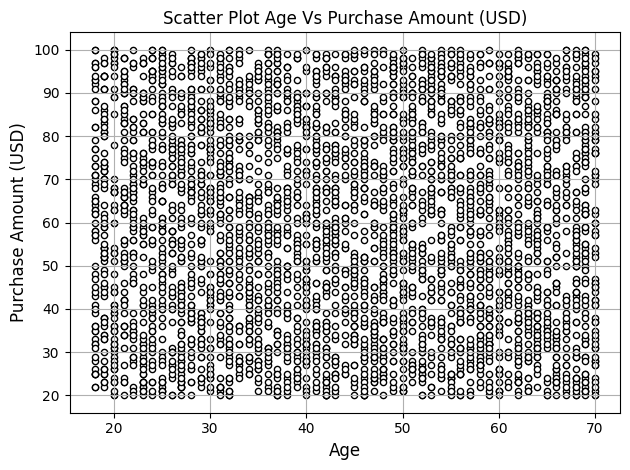

In [ ]:
plt.scatter(nan_encoding_data[X_column],
            nan_encoding_data[y_column],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)
plt.tight_layout()
plt.show()

## Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X)

X_scaled = scaler.transform(X)

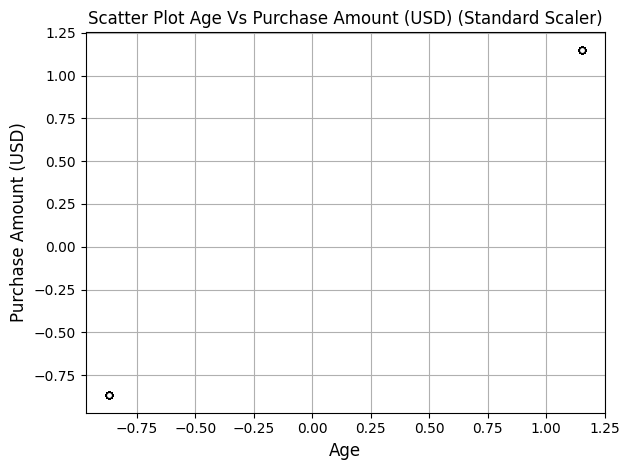

In [ ]:
plt.scatter(X_scaled[:, 0],
            X_scaled[:, 1],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title(f"Scatter Plot {X_column} Vs {y_column} (Standard Scaler)")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)

X_scaled_mm = scaler.transform(X)

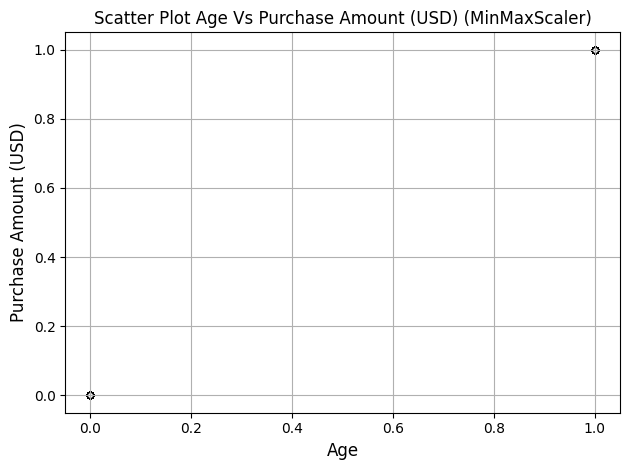

In [ ]:
plt.scatter(X_scaled_mm[:, 0],
            X_scaled_mm[:, 1],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title(f"Scatter Plot {X_column} Vs {y_column} (MinMaxScaler)")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)
plt.tight_layout()
plt.show()

## KMeans Clustering

In [ ]:
from sklearn.cluster import KMeans

# n_init : cara inisilisasi
km = KMeans(n_clusters=4, random_state=45, n_init="auto")
km.fit(X_scaled)

y_km = km.predict(X_scaled)

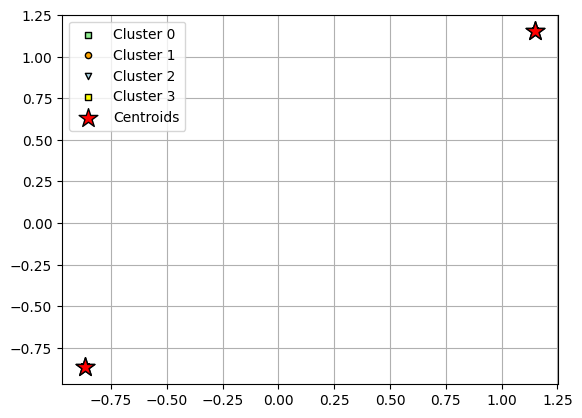

In [ ]:
plt.scatter(X_scaled[y_km == 0, 0],
            X_scaled[y_km == 0, 1],
            s=20,
            c='lightgreen',
            marker='s',
            edgecolor='black',
            label='Cluster 0')

plt.scatter(X_scaled[y_km == 1, 0],
            X_scaled[y_km == 1, 1],
            s=20, c='orange',
            marker='o',
            edgecolor='black',
            label='Cluster 1')

plt.scatter(X_scaled[y_km == 2, 0],
            X_scaled[y_km == 2, 1],
            s=20, c='lightblue',
            marker='v',
            edgecolor='black',
            label='Cluster 2')

plt.scatter(X_scaled[y_km == 3, 0],
            X_scaled[y_km == 3, 1],
            s=20, c='yellow',
            marker='s',
            edgecolor='black',
            label='Cluster 3')

plt.scatter(km.cluster_centers_[:, 0],
            km.cluster_centers_[:, 1],
            s=200, marker='*',
            c='red',
            edgecolor='black',
            label='Centroids')

plt.legend(scatterpoints=1)
plt.grid()

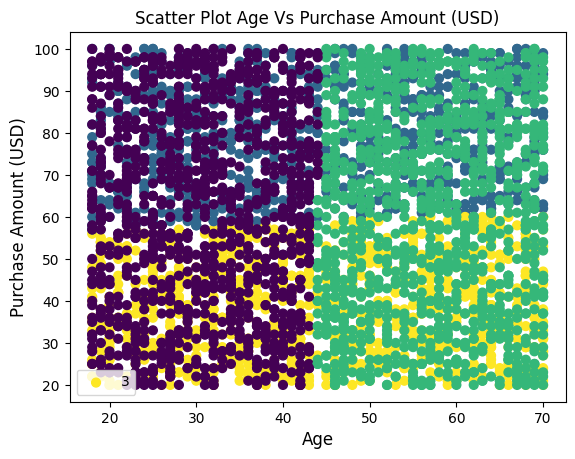

In [ ]:
# Plot clusters
plt.scatter(X[X_column], X[y_column], c=y_km, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km)
plt.show()

In [ ]:
km_mm = KMeans(n_clusters=4, random_state=45, n_init="auto")
km_mm.fit(X_scaled_mm)

y_km_mm = km_mm.predict(X_scaled_mm)

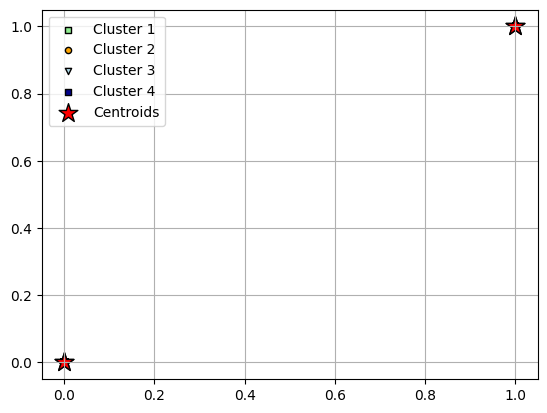

In [ ]:
plt.scatter(X_scaled_mm[y_km_mm == 0, 0],
            X_scaled_mm[y_km_mm == 0, 1],
            s=20,
            c='lightgreen',
            marker='s',
            edgecolor='black',
            label='Cluster 1')

plt.scatter(X_scaled_mm[y_km_mm == 1, 0],
            X_scaled_mm[y_km_mm == 1, 1],
            s=20, c='orange',
            marker='o',
            edgecolor='black',
            label='Cluster 2')

plt.scatter(X_scaled_mm[y_km_mm == 2, 0],
            X_scaled_mm[y_km_mm == 2, 1],
            s=20, c='lightblue',
            marker='v',
            edgecolor='black',
            label='Cluster 3')

plt.scatter(X_scaled_mm[y_km_mm == 3, 0],
            X_scaled_mm[y_km_mm == 3, 1],
            s=20, c='darkblue',
            marker='s',
            edgecolor='black',
            label='Cluster 4')

plt.scatter(km_mm.cluster_centers_[:, 0],
            km_mm.cluster_centers_[:, 1],
            s=200, marker='*',
            c='red',
            edgecolor='black',
            label='Centroids')

plt.legend(scatterpoints=1)
plt.grid()

In [ ]:
# from sklearn.cluster import KMeans

# features = process_data[[X_column, y_column]]

# wcss = []
# for i in range(1, 11):
#     kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=500, n_init=10, random_state=0)
#     kmeans.fit(features)
#     wcss.append(kmeans.inertia_)

# plt.plot(range(1, 11), wcss)
# plt.title('Elbow Method')
# plt.xlabel('Number of clusters')
# plt.ylabel('WCSS')
# plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

In [ ]:
score = silhouette_score(X_scaled, y_km)

new_row = {"Model": f"(Nan Encoding Data) K-Means {X_column} {y_column} SS", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
5,Gaussian Age Purchase Amount (USD) MM,0.119157
1,K-Means Age Purchase Amount (USD) MM,0.118994
0,K-Means Age Purchase Amount (USD) SS,0.103666
4,Gaussian Age Purchase Amount (USD) SS,0.097904
2,AHC Age Purchase Amount (USD) SS,0.069229
3,AHC Age Purchase Amount (USD) MM,0.061531


In [ ]:
score = silhouette_score(X_scaled_mm, y_km_mm)

new_row = {"Model": f"(Nan Encoding Data) K-Means {X_column} {y_column} MM", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
7,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350477
5,Gaussian Age Purchase Amount (USD) MM,0.119157
1,K-Means Age Purchase Amount (USD) MM,0.118994
0,K-Means Age Purchase Amount (USD) SS,0.103666
4,Gaussian Age Purchase Amount (USD) SS,0.097904
2,AHC Age Purchase Amount (USD) SS,0.069229
3,AHC Age Purchase Amount (USD) MM,0.061531


In [ ]:
pd.DataFrame(y_km).value_counts()

2    1121
0    1102
1     851
3     826
dtype: int64

In [ ]:
kmeans = pd.DataFrame(y_km, columns=["KMeans Cluster"])
kmeans

,KMeans Cluster
0,3
1,1
2,1
3,1
4,3
...,...
3895,0
3896,2
3897,2
3898,0


## Agglomerative Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit model and predict clusters
y_pred = AC.fit_predict(X_scaled)

score = silhouette_score(X_scaled, y_pred)
print(f"Silhouette Score: {score}")

Silhouette Score: 0.3291773518001812


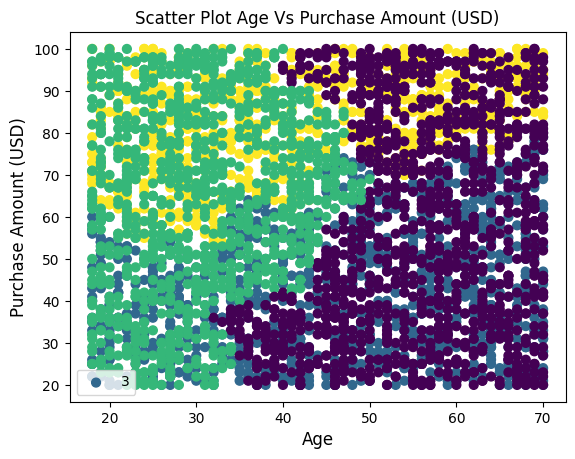

In [ ]:
# Plot clusters
plt.scatter(X[X_column], X[y_column], c=y_pred, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km)
plt.show()

In [ ]:
# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit model and predict clusters
y_pred_mm = AC.fit_predict(X_scaled_mm)

score = silhouette_score(X_scaled_mm, y_pred_mm)
print(f"Silhouette Score: {score}")

Silhouette Score: 0.32732467068377014


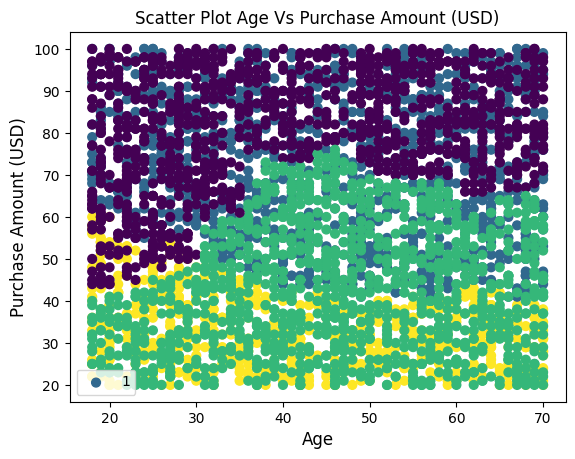

In [ ]:
# Plot clusters
plt.scatter(X[X_column], X[y_column], c=y_pred_mm, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km_mm)
plt.show()

In [ ]:
ahc = pd.DataFrame(y_pred, columns=["AHC Cluster"])
ahc

,AHC Cluster
0,1
1,3
2,1
3,3
4,1
...,...
3895,0
3896,0
3897,0
3898,2


In [ ]:
score = silhouette_score(X_scaled, y_pred)

new_row = {"Model": f"(Nan Encoding Data) AHC {X_column} {y_column} SS", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
7,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350477
8,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.329177
5,Gaussian Age Purchase Amount (USD) MM,0.119157
1,K-Means Age Purchase Amount (USD) MM,0.118994
0,K-Means Age Purchase Amount (USD) SS,0.103666
4,Gaussian Age Purchase Amount (USD) SS,0.097904
2,AHC Age Purchase Amount (USD) SS,0.069229
3,AHC Age Purchase Amount (USD) MM,0.061531


In [ ]:
score = silhouette_score(X_scaled_mm, y_pred_mm)

new_row = {"Model": f"(Nan Encoding Data) AHC {X_column} {y_column} MM", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
7,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350477
8,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.329177
9,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.327325
5,Gaussian Age Purchase Amount (USD) MM,0.119157
1,K-Means Age Purchase Amount (USD) MM,0.118994
0,K-Means Age Purchase Amount (USD) SS,0.103666
4,Gaussian Age Purchase Amount (USD) SS,0.097904
2,AHC Age Purchase Amount (USD) SS,0.069229
3,AHC Age Purchase Amount (USD) MM,0.061531


## Gaussian Mixture Model


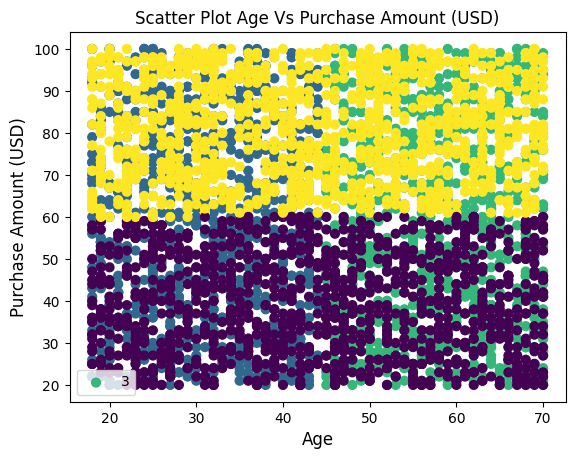

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.mixture import GaussianMixture

# Create an instance of Gaussian Mixture Model
gmm = GaussianMixture(n_components=4, random_state=42)

# Fit the model to the data
gmm.fit(X_scaled)

# Predict cluster labels
labels = gmm.predict(X_scaled)

# Plot clusters
plt.scatter(X[X_column], X[y_column], c=labels, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km)
plt.show()

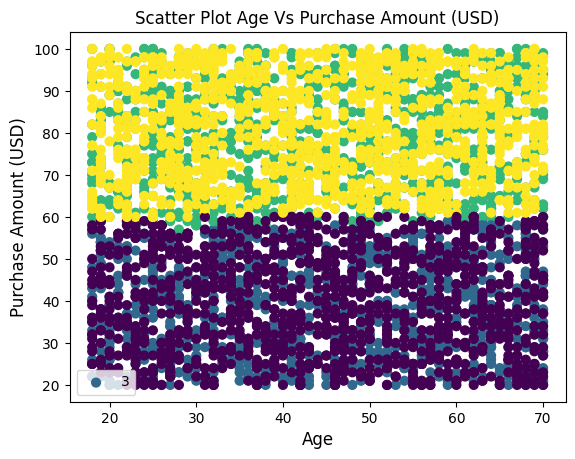

In [ ]:
# Create an instance of Gaussian Mixture Model
gmm = GaussianMixture(n_components=4, random_state=42)

# Fit the model to the data
gmm.fit(X_scaled_mm)

# Predict cluster labels
labels_mm = gmm.predict(X_scaled_mm)

# Plot clusters
plt.scatter(X[X_column], X[y_column], c=labels_mm, s=40, cmap='viridis')
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)

plt.legend(y_km)
plt.show()

In [ ]:
silhouette_avg = silhouette_score(X_scaled, labels)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.36101929875911765


In [ ]:
silhouette_avg = silhouette_score(X_scaled_mm, labels_mm)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.36039885128836835


In [ ]:
score = silhouette_score(X_scaled, labels)

new_row = {"Model": f"(Nan Encoding Data) Gaussian {X_column} {y_column} SS", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
10,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.361019
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
7,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350477
8,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.329177
9,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.327325
5,Gaussian Age Purchase Amount (USD) MM,0.119157
1,K-Means Age Purchase Amount (USD) MM,0.118994
0,K-Means Age Purchase Amount (USD) SS,0.103666
4,Gaussian Age Purchase Amount (USD) SS,0.097904
2,AHC Age Purchase Amount (USD) SS,0.069229


In [ ]:
score = silhouette_score(X_scaled_mm, labels_mm)

new_row = {"Model": f"(Nan Encoding Data) Gaussian {X_column} {y_column} MM", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
10,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.361019
11,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.360399
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
7,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350477
8,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.329177
9,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.327325
5,Gaussian Age Purchase Amount (USD) MM,0.119157
1,K-Means Age Purchase Amount (USD) MM,0.118994
0,K-Means Age Purchase Amount (USD) SS,0.103666
4,Gaussian Age Purchase Amount (USD) SS,0.097904


In [ ]:
gauss = pd.DataFrame(labels, columns=["Gaussian Cluster"])
gauss

,Gaussian Cluster
0,2
1,1
2,2
3,1
4,2
...,...
3895,0
3896,0
3897,0
3898,3


## Evaluation

In [ ]:
from sklearn import metrics

def evaluate_clustering(labels_pred, data):
    print("Silhouette Score:", metrics.silhouette_score(data, labels_pred))
    print("Davies-Bouldin Index:", metrics.davies_bouldin_score(data, labels_pred))
    print("Calinski-Harabasz Index:", metrics.calinski_harabasz_score(data, labels_pred))
    # print("Dunn Index:", metrics.dunn_index(data, labels_pred))

In [ ]:
print("KMeans Clustering SS")
evaluate_clustering(y_km, X_scaled)

KMeans Clustering SS
Silhouette Score: 0.3508475336359226
Davies-Bouldin Index: 1.1970518457875898
Calinski-Harabasz Index: 2835.5869303937116


In [ ]:
print("KMeans Clustering MM")
evaluate_clustering(y_km_mm, X_scaled_mm)

KMeans Clustering MM
Silhouette Score: 0.3504766594443392
Davies-Bouldin Index: 1.1971578702932462
Calinski-Harabasz Index: 6613.412479379055


In [ ]:
print("Agglomerative Clustering SS")
evaluate_clustering(y_pred, X_scaled)

Agglomerative Clustering SS
Silhouette Score: 0.3291773518001812
Davies-Bouldin Index: 1.235592498662677
Calinski-Harabasz Index: 2686.0854503015516


In [ ]:
print("Agglomerative Clustering MM")
evaluate_clustering(y_pred_mm, X_scaled_mm)

Agglomerative Clustering MM
Silhouette Score: 0.32732467068377014
Davies-Bouldin Index: 1.2387825233058036
Calinski-Harabasz Index: 6276.945038261068


In [ ]:
print("Gaussian Mixture Model SS")
evaluate_clustering(labels, X_scaled)

Gaussian Mixture Model SS
Silhouette Score: 0.36101929875911765
Davies-Bouldin Index: 1.1656729708326048
Calinski-Harabasz Index: 2912.871062999378


In [ ]:
print("Gaussian Mixture Model MM")
evaluate_clustering(labels_mm, X_scaled_mm)

Gaussian Mixture Model MM
Silhouette Score: 0.36039885128836835
Davies-Bouldin Index: 1.1675988468472671
Calinski-Harabasz Index: 6769.733094564964


# Visualization After

### Create File to Save

In [ ]:
figure = px.scatter_3d(processed_data,
                    color='clusters',
                    x="Age",
                    y="Purchase Amount (USD)",
                    z="Review Rating",
                    category_orders = {"clusters": ["0", "1", "2", "3"]}
                    )
figure.update_layout()
figure.show()

ValueError: Value of 'color' is not the name of a column in 'data_frame'. Expected one of ['Age', 'Gender', 'Category', 'Purchase Amount (USD)', 'Size', 'Season', 'Review Rating', 'Subscription Status', 'Shipping Type', 'Discount Applied', 'Promo Code Used', 'Previous Purchases', 'Payment Method', 'Annually', 'Bi-Weekly', 'Every 3 Months', 'Fortnightly', 'Monthly', 'Quarterly', 'Weekly', 'Far West', 'Great Lakes', 'Mideast', 'New England', 'Plains', 'Rocky Mountain', 'Southeast', 'Southwest', 'Adult', 'Elder', 'Middle_Age', 'Teenager', 'Young_Adult'] but received: clusters

In [ ]:
all_score = clus_score
all_score = all_score.sort_values(by="Silhouette Score", ascending=False)
all_score

,Model,Silhouette Score
10,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.361019
11,(Nan Encoding Data) Gaussian Age Purchase Amou...,0.360399
6,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350848
7,(Nan Encoding Data) K-Means Age Purchase Amoun...,0.350477
8,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.329177
9,(Nan Encoding Data) AHC Age Purchase Amount (U...,0.327325
5,Gaussian Age Purchase Amount (USD) MM,0.119157
1,K-Means Age Purchase Amount (USD) MM,0.118994
0,K-Means Age Purchase Amount (USD) SS,0.103666
4,Gaussian Age Purchase Amount (USD) SS,0.097904


In [ ]:
file_path = 'final2.xlsx'  # Tentukan lokasi dan nama file
all_score.to_excel(file_path, index=False)  # index=False untuk menghilangkan penulisan indeks baris

In [ ]:
new_df = pd.concat([data, kmeans, ahc, gauss], axis=1)
new_df

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,...,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group,KMeans Cluster,AHC Cluster,Gaussian Cluster
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,...,Yes,Yes,14,Venmo,Fortnightly,Southeast,Middle_Age,2,0,0
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,...,Yes,Yes,2,Cash,Fortnightly,New England,Teenager,3,1,3
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,...,Yes,Yes,23,Credit Card,Weekly,New England,Middle_Age,1,2,2
3,4,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,...,Yes,Yes,49,PayPal,Weekly,New England,Young_Adult,3,1,3
4,5,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,...,Yes,Yes,31,PayPal,Annually,Far West,Middle_Age,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3895,3896,40,Female,Hoodie,Clothing,28,Virginia,L,Turquoise,Summer,...,No,No,32,Venmo,Weekly,Southeast,Adult,0,3,1
3896,3897,52,Female,Backpack,Accessories,49,Iowa,L,White,Spring,...,No,No,41,Bank Transfer,Bi-Weekly,Plains,Middle_Age,2,0,0
3897,3898,46,Female,Belt,Accessories,33,New Jersey,L,Green,Spring,...,No,No,24,Venmo,Quarterly,Mideast,Middle_Age,2,3,0
3898,3899,44,Female,Shoes,Footwear,77,Minnesota,S,Brown,Summer,...,No,No,24,Venmo,Weekly,Plains,Adult,1,1,2


In [ ]:
figure = px.scatter_3d(new_df,
                    color='KMeans Cluster',
                    x="Age",
                    y="Purchase Amount (USD)",
                    z="Review Rating",
                    category_orders = {"clusters": ["0", "1", "2", "3"]}
                    )
figure.update_layout()
figure.show()

In [ ]:
new_df["Age Group"] = le.fit_transform(new_df["Age Group"])
ayam = np.array(new_df["Age Group"])
ayam

array([2, 3, 2, ..., 2, 0, 2])

## Confusion Matrix fr some reason

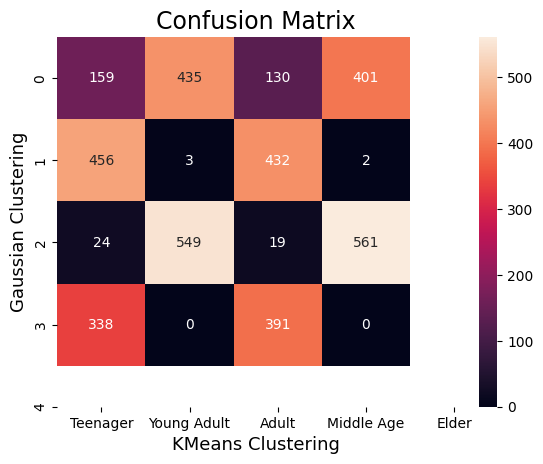

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns

cm = confusion_matrix(y_pred, y_km)

sns.heatmap(cm,
            annot=True,
            fmt='g',
            xticklabels=['Teenager', 'Young Adult', 'Adult', 'Middle Age', 'Elder'],
            yticklabels=['0', '1', '2', '3', '4'])
plt.ylabel('Gaussian Clustering',fontsize=13)
plt.xlabel('KMeans Clustering',fontsize=13)
plt.title('Confusion Matrix',fontsize=17)
plt.show()

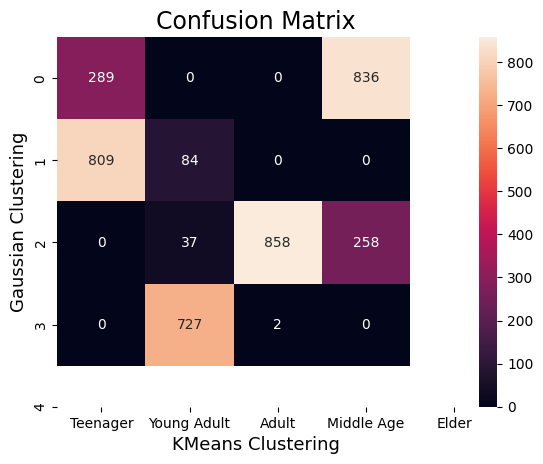

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns

cm = confusion_matrix(y_pred, labels)

sns.heatmap(cm,
            annot=True,
            fmt='g',
            xticklabels=['Teenager', 'Young Adult', 'Adult', 'Middle Age', 'Elder'],
            yticklabels=['0', '1', '2', '3', '4'])
plt.ylabel('Gaussian Clustering',fontsize=13)
plt.xlabel('KMeans Clustering',fontsize=13)
plt.title('Confusion Matrix',fontsize=17)
plt.show()

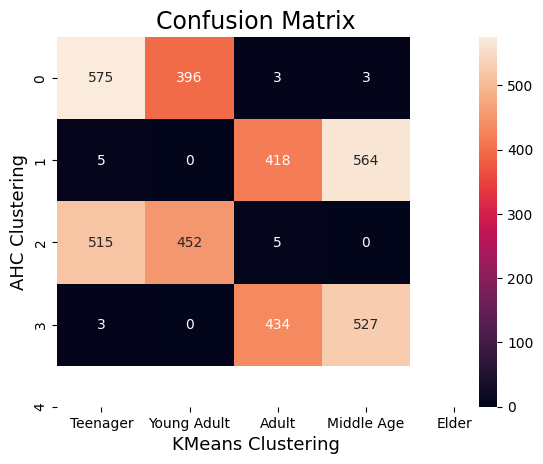

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns

cm = confusion_matrix(y_km, labels)

sns.heatmap(cm,
            annot=True,
            fmt='g',
            xticklabels=['Teenager', 'Young Adult', 'Adult', 'Middle Age', 'Elder'],
            yticklabels=['0', '1', '2', '3', '4'])
plt.ylabel('AHC Clustering',fontsize=13)
plt.xlabel('KMeans Clustering',fontsize=13)
plt.title('Confusion Matrix',fontsize=17)
plt.show()

## PowerBI GO

In [ ]:
new_df = pd.concat([data, kmeans, ahc, gauss], axis=1)
new_df

In [ ]:
file_path = 'model1.xlsx'  # Tentukan lokasi dan nama file
new_df.to_excel(file_path, index=False)  # index=False untuk menghilangkan penulisan indeks baris

## Item Purchased, Region, Purchased Amout, Rating ETC

<ipython-input-1173-129ffd15b2d9>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(new_df.corr(), annot=True);


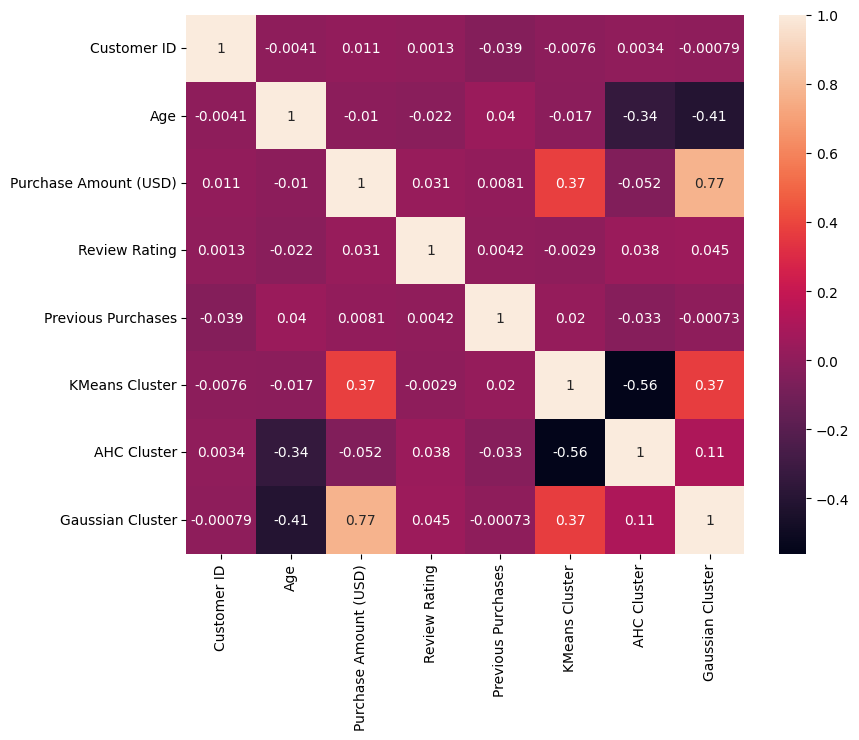

In [ ]:
plt.figure(figsize=(9,7))
sns.heatmap(new_df.corr(), annot=True);
plt.show()

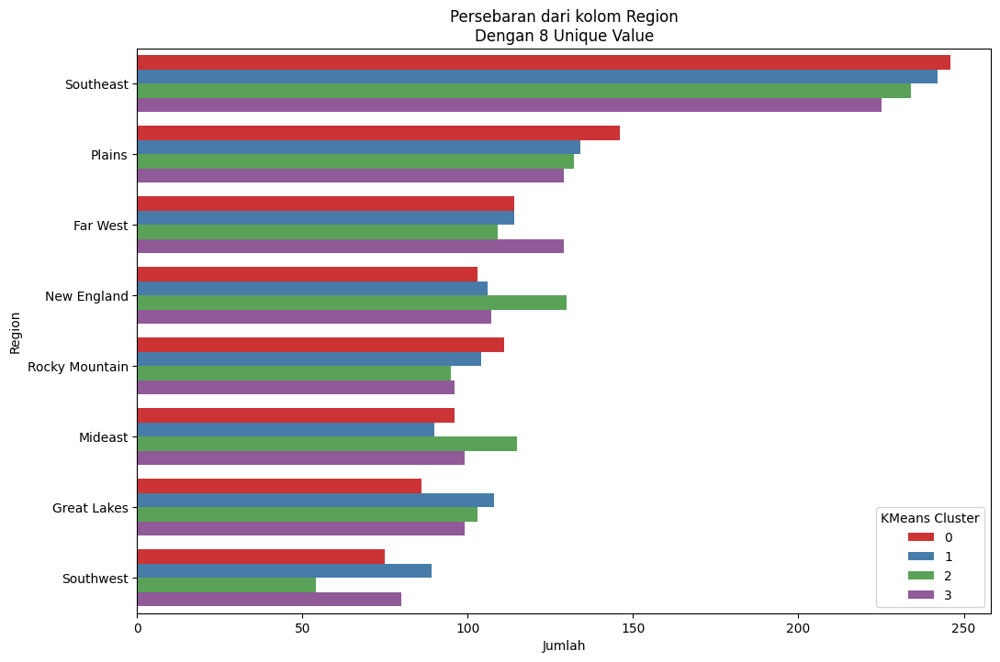

In [ ]:
column = "Region"

plt.figure(figsize=(12, 8))

# Sorting the data for the current column
sorted_data = new_df[column].value_counts().reset_index().rename(columns={'index': column, column: 'count'})
sorted_data = sorted_data.sort_values(by='count', ascending=False)

ax = sns.countplot(y=column, data=new_df, order=sorted_data[column], hue="KMeans Cluster", palette="Set1")

plt.title(f'Persebaran dari kolom {column}\nDengan {len(data[column].unique())} Unique Value')
plt.xlabel('Jumlah')
plt.ylabel(column)

plt.show()

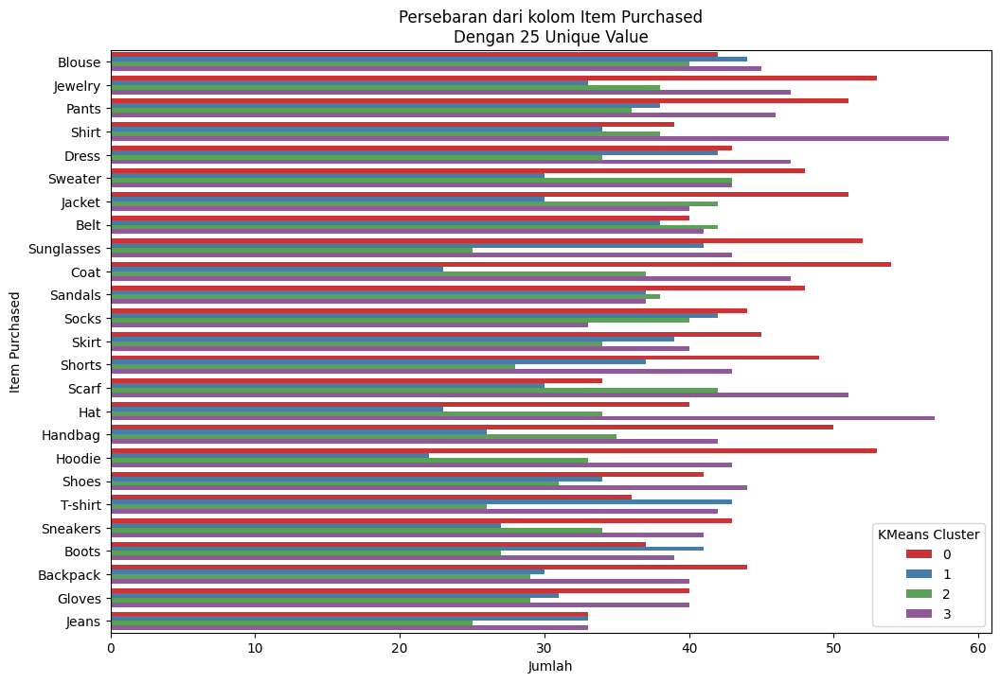

In [ ]:
column = "Item Purchased"

plt.figure(figsize=(12, 8))

# Sorting the data for the current column
sorted_data = new_df[column].value_counts().reset_index().rename(columns={'index': column, column: 'count'})
sorted_data = sorted_data.sort_values(by='count', ascending=False)

ax = sns.countplot(y=column, data=new_df, order=sorted_data[column], hue="KMeans Cluster", palette="Set1")

plt.title(f'Persebaran dari kolom {column}\nDengan {len(data[column].unique())} Unique Value')
plt.xlabel('Jumlah')
plt.ylabel(column)

plt.show()

KeyboardInterrupt: 

<Figure size 2000x800 with 0 Axes>

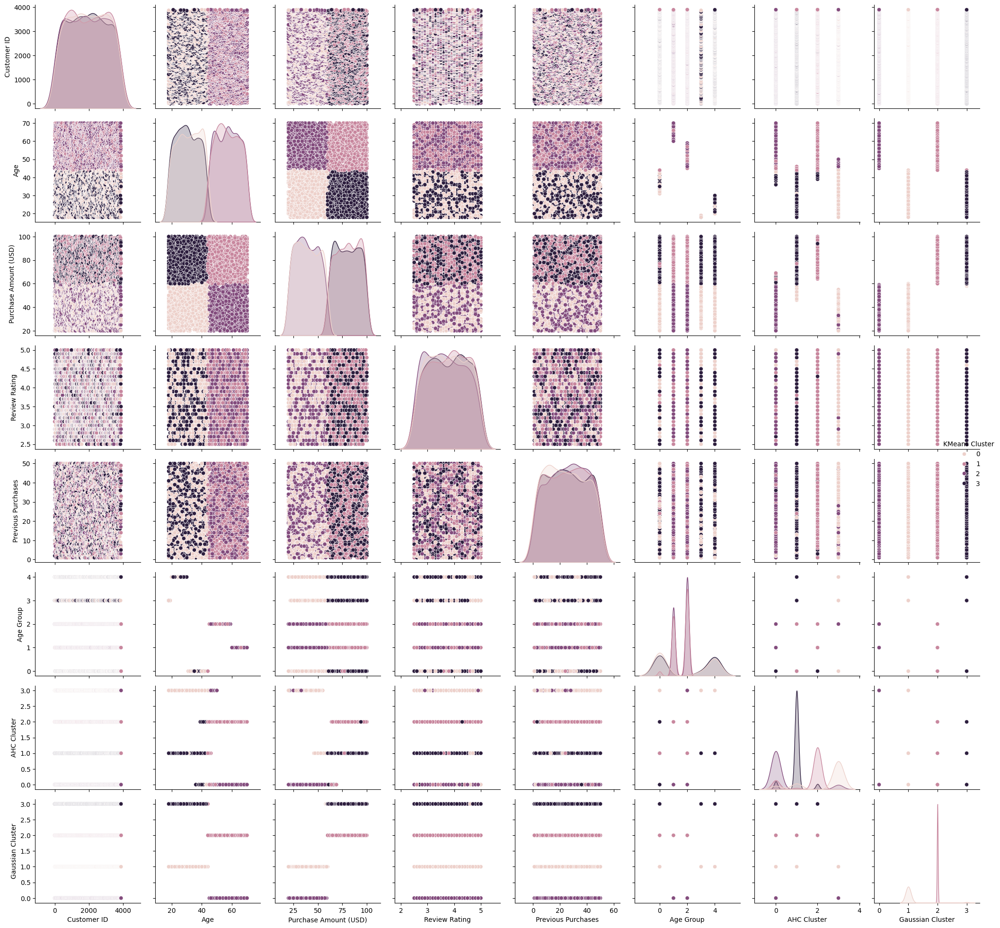

In [ ]:
for column in ["KMeans Cluster", "AHC Cluster", "Gaussian Cluster"]:
  plt.figure(figsize=(20,8))
  sns.pairplot(new_df, hue=column, diag_kind="kde")
  plt.show()

# K-Prototypes

In [ ]:
!pip install kmodes

In [ ]:
import numpy as np
import pandas as pd

from kmodes.kprototypes import KPrototypes

In [ ]:
marketing_df = data.copy()

In [ ]:
marketing_df

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,Southeast,Middle_Age
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,New England,Teenager
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,New England,Middle_Age
3,4,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,New England,Young_Adult
4,5,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,Far West,Middle_Age
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3895,3896,40,Female,Hoodie,Clothing,28,Virginia,L,Turquoise,Summer,4.2,No,2-Day Shipping,No,No,32,Venmo,Weekly,Southeast,Adult
3896,3897,52,Female,Backpack,Accessories,49,Iowa,L,White,Spring,4.5,No,Store Pickup,No,No,41,Bank Transfer,Bi-Weekly,Plains,Middle_Age
3897,3898,46,Female,Belt,Accessories,33,New Jersey,L,Green,Spring,2.9,No,Standard,No,No,24,Venmo,Quarterly,Mideast,Middle_Age
3898,3899,44,Female,Shoes,Footwear,77,Minnesota,S,Brown,Summer,3.8,No,Express,No,No,24,Venmo,Weekly,Plains,Adult


In [ ]:
marketing_df=marketing_df.drop(['Customer ID', 'Item Purchased', 'Color', 'Location'],axis=1)

In [ ]:
marketing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3900 non-null   int64  
 1   Gender                  3900 non-null   object 
 2   Category                3900 non-null   object 
 3   Purchase Amount (USD)   3900 non-null   int64  
 4   Size                    3900 non-null   object 
 5   Season                  3900 non-null   object 
 6   Review Rating           3900 non-null   float64
 7   Subscription Status     3900 non-null   object 
 8   Shipping Type           3900 non-null   object 
 9   Discount Applied        3900 non-null   object 
 10  Promo Code Used         3900 non-null   object 
 11  Previous Purchases      3900 non-null   int64  
 12  Payment Method          3900 non-null   object 
 13  Frequency of Purchases  3900 non-null   object 
 14  Region                  3900 non-null   

In [ ]:
marketing_df

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group
0,55,Male,Clothing,53,L,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,Southeast,Middle_Age
1,19,Male,Clothing,64,L,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,New England,Teenager
2,50,Male,Clothing,73,S,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,New England,Middle_Age
3,21,Male,Footwear,90,M,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,New England,Young_Adult
4,45,Male,Clothing,49,M,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,Far West,Middle_Age
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3895,40,Female,Clothing,28,L,Summer,4.2,No,2-Day Shipping,No,No,32,Venmo,Weekly,Southeast,Adult
3896,52,Female,Accessories,49,L,Spring,4.5,No,Store Pickup,No,No,41,Bank Transfer,Bi-Weekly,Plains,Middle_Age
3897,46,Female,Accessories,33,L,Spring,2.9,No,Standard,No,No,24,Venmo,Quarterly,Mideast,Middle_Age
3898,44,Female,Footwear,77,S,Summer,3.8,No,Express,No,No,24,Venmo,Weekly,Plains,Adult


In [ ]:
mark_array=marketing_df.values

In [ ]:
mark_array

array([[55, 'Male', 'Clothing', ..., 'Fortnightly', 'Southeast',
        'Middle_Age'],
       [19, 'Male', 'Clothing', ..., 'Fortnightly', 'New England',
        'Teenager'],
       [50, 'Male', 'Clothing', ..., 'Weekly', 'New England',
        'Middle_Age'],
       ...,
       [46, 'Female', 'Accessories', ..., 'Quarterly', 'Mideast',
        'Middle_Age'],
       [44, 'Female', 'Footwear', ..., 'Weekly', 'Plains', 'Adult'],
       [52, 'Female', 'Accessories', ..., 'Quarterly', 'Far West',
        'Middle_Age']], dtype=object)

In [ ]:
mark_array[:, 0] = mark_array[:, 0].astype(float)
mark_array[:, 3] = mark_array[:, 3].astype(float)
mark_array[:, 11] = mark_array[:, 11].astype(float)

In [ ]:
mark_array

array([[55.0, 'Male', 'Clothing', ..., 'Fortnightly', 'Southeast',
        'Middle_Age'],
       [19.0, 'Male', 'Clothing', ..., 'Fortnightly', 'New England',
        'Teenager'],
       [50.0, 'Male', 'Clothing', ..., 'Weekly', 'New England',
        'Middle_Age'],
       ...,
       [46.0, 'Female', 'Accessories', ..., 'Quarterly', 'Mideast',
        'Middle_Age'],
       [44.0, 'Female', 'Footwear', ..., 'Weekly', 'Plains', 'Adult'],
       [52.0, 'Female', 'Accessories', ..., 'Quarterly', 'Far West',
        'Middle_Age']], dtype=object)

In [ ]:
kproto = KPrototypes(n_clusters=4, verbose=2,max_iter=20)
clusters = kproto.fit_predict(mark_array, categorical=[1, 2, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15])

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/20, moves: 829, ncost: 1787527.4666956803
Run: 1, iteration: 2/20, moves: 409, ncost: 1756124.1468130136
Run: 1, iteration: 3/20, moves: 132, ncost: 1753257.1924559525
Run: 1, iteration: 4/20, moves: 31, ncost: 1753092.2710550916
Run: 1, iteration: 5/20, moves: 9, ncost: 1753047.8746188616
Run: 1, iteration: 6/20, moves: 6, ncost: 1753037.2055646211
Run: 1, iteration: 7/20, moves: 0, ncost: 1753037.2055646211
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/20, moves: 958, ncost: 1908329.9368256861
Run: 2, iteration: 2/20, moves: 181, ncost: 1903231.8022977046
Run: 2, iteration: 3/20, moves: 92, ncost: 1900779.04856115
Run: 2, iteration: 4/20, moves: 75, ncost: 1898469.7020212284
Run: 2, iteration: 5/20, moves: 89, ncost: 1895272.195907211
Run: 2, iteration: 6/

In [ ]:
print(kproto.cluster_centroids_)

[['57.18275154004107' '80.73716632443532' '3.7823408624230046'
  '25.372689938398356' 'Male' 'Clothing' 'M' 'Fall' 'No' 'Free Shipping'
  'No' 'No' 'Credit Card' 'Bi-Weekly' 'Southeast' 'Middle_Age']
 ['30.58680203045685' '79.79289340101523' '3.7784771573604026'
  '25.806091370558377' 'Male' 'Clothing' 'M' 'Winter' 'No'
  'Free Shipping' 'No' 'No' 'PayPal' 'Every 3 Months' 'Southeast' 'Adult']
 ['31.437948717948718' '39.25025641025641' '3.7461538461538426'
  '22.955897435897437' 'Male' 'Clothing' 'M' 'Summer' 'No' 'Next Day Air'
  'No' 'No' 'Credit Card' 'Every 3 Months' 'Southeast' 'Adult']
 ['57.34057971014493' '38.900621118012424' '3.6920289855072466'
  '27.284679089026916' 'Male' 'Clothing' 'M' 'Spring' 'No' 'Standard'
  'No' 'No' 'PayPal' 'Annually' 'Southeast' 'Middle_Age']]


In [ ]:
cluster_dict=[]
for c in clusters:
    cluster_dict.append(c)

In [ ]:
cluster_dict

[3,
 1,
 0,
 1,
 3,
 3,
 0,
 2,
 1,
 3,
 3,
 1,
 0,
 3,
 3,
 0,
 2,
 3,
 3,
 0,
 2,
 1,
 3,
 1,
 2,
 2,
 2,
 3,
 0,
 2,
 3,
 1,
 1,
 3,
 1,
 3,
 1,
 2,
 2,
 0,
 0,
 3,
 1,
 1,
 2,
 3,
 3,
 3,
 2,
 3,
 3,
 0,
 2,
 2,
 0,
 2,
 1,
 1,
 3,
 0,
 3,
 0,
 2,
 1,
 0,
 3,
 1,
 3,
 3,
 0,
 2,
 2,
 2,
 0,
 3,
 0,
 3,
 2,
 0,
 1,
 1,
 0,
 2,
 2,
 3,
 0,
 2,
 3,
 2,
 0,
 2,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 2,
 0,
 1,
 0,
 0,
 3,
 0,
 3,
 1,
 0,
 0,
 3,
 1,
 1,
 2,
 0,
 0,
 0,
 3,
 3,
 1,
 0,
 1,
 2,
 0,
 1,
 3,
 3,
 1,
 2,
 1,
 2,
 2,
 2,
 0,
 1,
 1,
 1,
 3,
 3,
 0,
 3,
 3,
 2,
 2,
 2,
 1,
 3,
 0,
 1,
 1,
 1,
 2,
 1,
 3,
 1,
 0,
 2,
 1,
 1,
 3,
 2,
 3,
 0,
 0,
 0,
 2,
 3,
 2,
 1,
 2,
 3,
 2,
 0,
 2,
 2,
 0,
 0,
 2,
 3,
 3,
 0,
 2,
 1,
 3,
 2,
 3,
 2,
 1,
 3,
 1,
 0,
 0,
 2,
 1,
 0,
 3,
 1,
 0,
 3,
 0,
 1,
 3,
 3,
 3,
 1,
 0,
 2,
 0,
 3,
 0,
 2,
 0,
 0,
 1,
 2,
 0,
 1,
 2,
 2,
 1,
 2,
 1,
 0,
 2,
 0,
 2,
 1,
 0,
 1,
 3,
 0,
 2,
 3,
 1,
 2,
 1,
 1,
 0,
 3,
 3,
 3,
 1,
 0,
 1,
 3,
 3,
 1,
 1,
 0,
 3,


In [ ]:
marketing_df['cluster']=cluster_dict

In [ ]:
marketing_df["cluster"].value_counts()

1    985
2    975
0    974
3    966
Name: cluster, dtype: int64

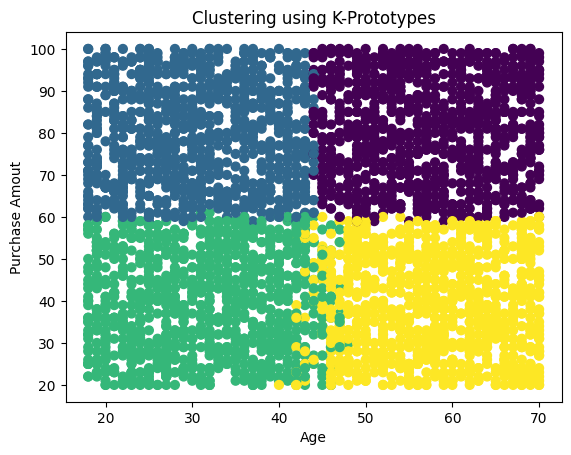

In [ ]:
# Plot clusters
plt.scatter(marketing_df["Age"], marketing_df["Purchase Amount (USD)"], c=marketing_df["cluster"], s=40, cmap='viridis')
plt.xlabel('Age')
plt.ylabel('Purchase Amout')
plt.title('Clustering using K-Prototypes')
plt.show()

In [ ]:
silhouette_avg = silhouette_score(process_data, clusters)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.2474714419555473


In [ ]:
marketing_df

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group,cluster
0,55,Male,Clothing,53,L,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,Southeast,Middle_Age,0
1,19,Male,Clothing,64,L,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,New England,Teenager,2
2,50,Male,Clothing,73,S,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,New England,Middle_Age,1
3,21,Male,Footwear,90,M,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,New England,Young_Adult,2
4,45,Male,Clothing,49,M,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,Far West,Middle_Age,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3895,40,Female,Clothing,28,L,Summer,4.2,No,2-Day Shipping,No,No,32,Venmo,Weekly,Southeast,Adult,0
3896,52,Female,Accessories,49,L,Spring,4.5,No,Store Pickup,No,No,41,Bank Transfer,Bi-Weekly,Plains,Middle_Age,0
3897,46,Female,Accessories,33,L,Spring,2.9,No,Standard,No,No,24,Venmo,Quarterly,Mideast,Middle_Age,0
3898,44,Female,Footwear,77,S,Summer,3.8,No,Express,No,No,24,Venmo,Weekly,Plains,Adult,2


In [ ]:
marketing_df[marketing_df['cluster']== 0].head(10)

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group,cluster
0,55,Male,Clothing,53,L,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,Southeast,Middle_Age,0
4,45,Male,Clothing,49,M,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,Far West,Middle_Age,0
5,46,Male,Footwear,20,M,Summer,2.9,Yes,Standard,Yes,Yes,14,Venmo,Weekly,Rocky Mountain,Middle_Age,0
7,27,Male,Clothing,34,L,Winter,3.2,Yes,Free Shipping,Yes,Yes,19,Credit Card,Weekly,Southeast,Young_Adult,0
9,57,Male,Accessories,31,M,Spring,4.8,Yes,2-Day Shipping,Yes,Yes,4,Cash,Quarterly,Plains,Middle_Age,0
10,53,Male,Footwear,34,L,Fall,4.1,Yes,Store Pickup,Yes,Yes,26,Bank Transfer,Bi-Weekly,Southeast,Middle_Age,0
13,65,Male,Clothing,51,M,Spring,4.7,Yes,Express,Yes,Yes,31,PayPal,Weekly,New England,Elder,0
14,64,Male,Outerwear,53,L,Winter,4.7,Yes,Free Shipping,Yes,Yes,34,Debit Card,Weekly,Mideast,Elder,0
16,25,Male,Accessories,36,S,Spring,4.1,Yes,Next Day Air,Yes,Yes,44,Debit Card,Bi-Weekly,Southeast,Young_Adult,0
17,53,Male,Clothing,38,XL,Winter,4.7,Yes,2-Day Shipping,Yes,Yes,36,Venmo,Quarterly,Southeast,Middle_Age,0


In [ ]:
marketing_df[marketing_df['cluster']== 1].head(10)

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group,cluster
2,50,Male,Clothing,73,S,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,New England,Middle_Age,1
6,63,Male,Clothing,85,M,Fall,3.2,Yes,Free Shipping,Yes,Yes,49,Cash,Quarterly,Rocky Mountain,Elder,1
12,61,Male,Outerwear,72,M,Winter,4.5,Yes,Express,Yes,Yes,37,Venmo,Fortnightly,Mideast,Elder,1
15,64,Male,Clothing,81,M,Winter,2.8,Yes,Store Pickup,Yes,Yes,8,PayPal,Monthly,New England,Elder,1
19,66,Male,Clothing,90,M,Summer,3.3,Yes,Standard,Yes,Yes,46,Debit Card,Bi-Weekly,New England,Elder,1
28,54,Male,Accessories,94,M,Fall,4.4,Yes,Free Shipping,Yes,Yes,41,PayPal,Every 3 Months,Southeast,Middle_Age,1
39,70,Male,Clothing,60,S,Summer,4.2,Yes,Express,Yes,Yes,18,Credit Card,Monthly,Southwest,Elder,1
40,69,Male,Accessories,76,L,Winter,4.6,Yes,Next Day Air,Yes,Yes,31,Debit Card,Quarterly,Southeast,Elder,1
51,59,Male,Clothing,59,XL,Winter,4.7,Yes,2-Day Shipping,Yes,Yes,7,Credit Card,Quarterly,New England,Middle_Age,1
54,47,Male,Outerwear,94,M,Summer,4.2,Yes,Next Day Air,Yes,Yes,35,Debit Card,Bi-Weekly,Southwest,Middle_Age,1


In [ ]:
marketing_df[marketing_df['cluster']== 2].head(10)

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,Region,Age Group,cluster
1,19,Male,Clothing,64,L,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,New England,Teenager,2
3,21,Male,Footwear,90,M,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,New England,Young_Adult,2
8,26,Male,Outerwear,97,L,Summer,2.6,Yes,Express,Yes,Yes,8,Venmo,Annually,Southeast,Young_Adult,2
11,30,Male,Clothing,68,S,Winter,4.9,Yes,Store Pickup,Yes,Yes,10,Bank Transfer,Fortnightly,Far West,Young_Adult,2
20,21,Male,Clothing,51,M,Winter,2.8,Yes,Express,Yes,Yes,50,Cash,Every 3 Months,Southeast,Young_Adult,2
21,31,Male,Clothing,62,M,Winter,4.1,Yes,Store Pickup,Yes,Yes,22,Debit Card,Quarterly,Southeast,Adult,2
23,31,Male,Clothing,88,XL,Winter,4.4,Yes,Express,Yes,Yes,40,Credit Card,Weekly,Southwest,Adult,2
31,33,Male,Clothing,79,L,Winter,4.7,Yes,Store Pickup,Yes,Yes,45,Venmo,Monthly,Southeast,Adult,2
32,36,Male,Outerwear,67,M,Summer,4.9,Yes,Free Shipping,Yes,Yes,37,Venmo,Annually,Plains,Adult,2
34,36,Male,Clothing,91,L,Spring,4.6,Yes,2-Day Shipping,Yes,Yes,38,PayPal,Quarterly,Plains,Adult,2


# Modeling (Southeast)

In [ ]:
southeast = processed_data[processed_data["Southeast"] == 1]

## Preparing

In [ ]:
southeast.head()

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,...,New England,Plains,Rocky Mountain,Southeast,Southwest,Adult,Elder,Middle_Age,Teenager,Young_Adult
0,55,1,1,53,0,3,3.1,1,1,1,...,0,0,0,1,0,0,0,1,0,0
7,27,1,1,34,0,3,3.2,1,2,1,...,0,0,0,1,0,0,0,0,0,1
8,26,1,3,97,0,2,2.6,1,1,1,...,0,0,0,1,0,0,0,0,0,1
10,53,1,2,34,0,0,4.1,1,5,1,...,0,0,0,1,0,0,0,1,0,0
16,25,1,0,36,2,1,4.1,1,3,1,...,0,0,0,1,0,0,0,0,0,1


Target pertama, yaitu hubungan Age dengan Purchase Amount (USD)

In [ ]:
X = southeast[['Age', 'Purchase Amount (USD)']]
X.head()

,Age,Purchase Amount (USD)
0,55,53
7,27,34
8,26,97
10,53,34
16,25,36


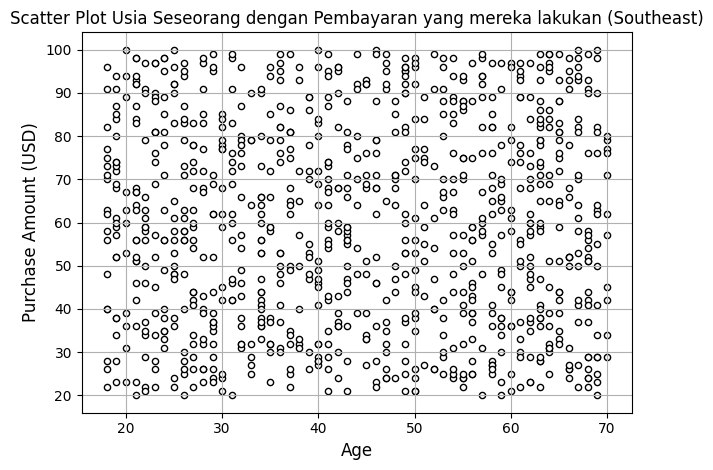

In [ ]:
plt.scatter(southeast['Age'],
            southeast['Purchase Amount (USD)'],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title("Scatter Plot Usia Seseorang dengan Pembayaran yang mereka lakukan (Southeast)")
plt.xlabel("Age", fontsize=12)
plt.ylabel("Purchase Amount (USD)", fontsize=12)
plt.tight_layout()
plt.show()

## Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X)

X_scaled = scaler.transform(X)

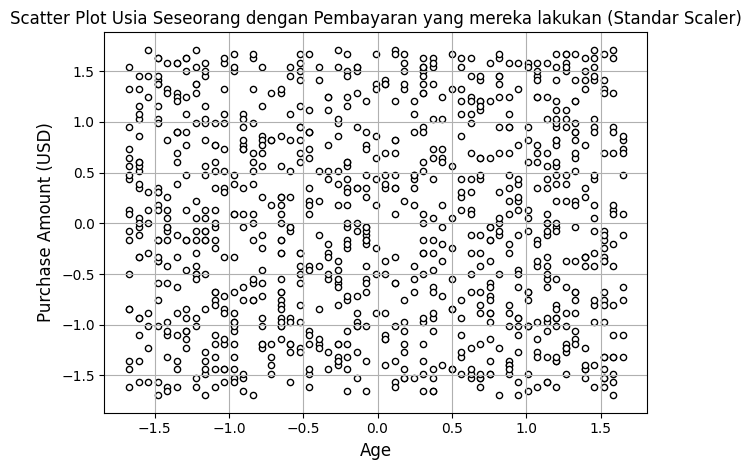

In [ ]:
plt.scatter(X_scaled[:, 0],
            X_scaled[:, 1],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title("Scatter Plot Usia Seseorang dengan Pembayaran yang mereka lakukan (Standar Scaler)")
plt.xlabel("Age", fontsize=12)
plt.ylabel("Purchase Amount (USD)", fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)

X_scaled_mm = scaler.transform(X)

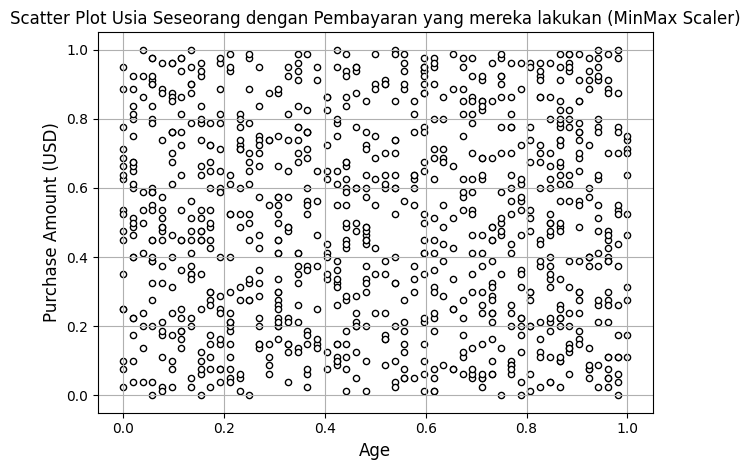

In [ ]:
plt.scatter(X_scaled_mm[:, 0],
            X_scaled_mm[:, 1],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title("Scatter Plot Usia Seseorang dengan Pembayaran yang mereka lakukan (MinMax Scaler)")
plt.xlabel("Age", fontsize=12)
plt.ylabel("Purchase Amount (USD)", fontsize=12)
plt.tight_layout()
plt.show()

## KMeans Clustering

In [ ]:
from sklearn.cluster import KMeans

# n_init : cara inisilisasi
km = KMeans(n_clusters=4, random_state=45, n_init="auto")
km.fit(X_scaled)

y_km = km.predict(X_scaled)

In [ ]:
pd.DataFrame(y_km).value_counts()

1    251
3    238
2    236
0    222
dtype: int64

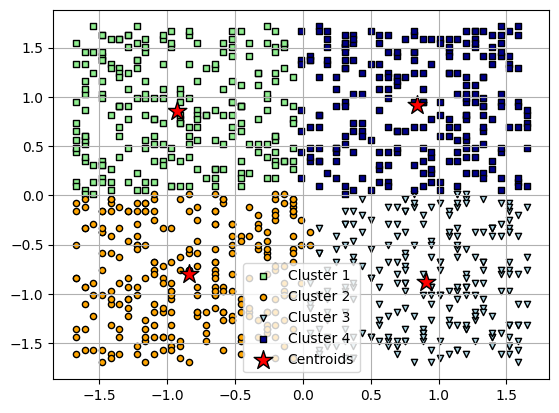

In [ ]:
plt.scatter(X_scaled[y_km == 0, 0],
            X_scaled[y_km == 0, 1],
            s=20,
            c='lightgreen',
            marker='s',
            edgecolor='black',
            label='Cluster 1')

plt.scatter(X_scaled[y_km == 1, 0],
            X_scaled[y_km == 1, 1],
            s=20, c='orange',
            marker='o',
            edgecolor='black',
            label='Cluster 2')

plt.scatter(X_scaled[y_km == 2, 0],
            X_scaled[y_km == 2, 1],
            s=20, c='lightblue',
            marker='v',
            edgecolor='black',
            label='Cluster 3')

plt.scatter(X_scaled[y_km == 3, 0],
            X_scaled[y_km == 3, 1],
            s=20, c='darkblue',
            marker='s',
            edgecolor='black',
            label='Cluster 4')

plt.scatter(km.cluster_centers_[:, 0],
            km.cluster_centers_[:, 1],
            s=200, marker='*',
            c='red',
            edgecolor='black',
            label='Centroids')

plt.legend(scatterpoints=1)
plt.grid()

In [ ]:
from sklearn.cluster import KMeans

# n_init : cara inisilisasi
km_mm = KMeans(n_clusters=4, random_state=45, n_init="auto")
km_mm.fit(X_scaled_mm)

y_km_mm = km_mm.predict(X_scaled_mm)

In [ ]:
pd.DataFrame(y_km_mm).value_counts()

1    250
3    238
2    237
0    222
dtype: int64

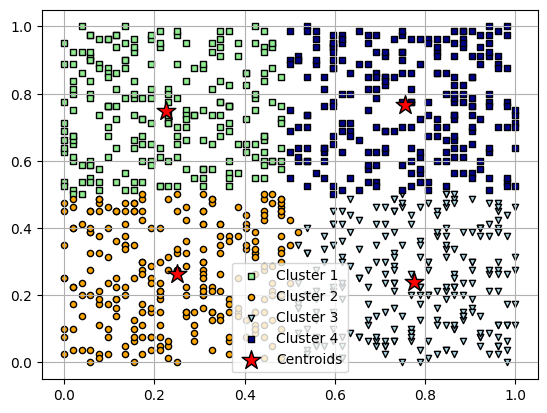

In [ ]:
plt.scatter(X_scaled_mm[y_km_mm == 0, 0],
            X_scaled_mm[y_km_mm == 0, 1],
            s=20,
            c='lightgreen',
            marker='s',
            edgecolor='black',
            label='Cluster 1')

plt.scatter(X_scaled_mm[y_km_mm == 1, 0],
            X_scaled_mm[y_km_mm == 1, 1],
            s=20, c='orange',
            marker='o',
            edgecolor='black',
            label='Cluster 2')

plt.scatter(X_scaled_mm[y_km_mm == 2, 0],
            X_scaled_mm[y_km_mm == 2, 1],
            s=20, c='lightblue',
            marker='v',
            edgecolor='black',
            label='Cluster 3')

plt.scatter(X_scaled_mm[y_km_mm == 3, 0],
            X_scaled_mm[y_km_mm == 3, 1],
            s=20, c='darkblue',
            marker='s',
            edgecolor='black',
            label='Cluster 4')

plt.scatter(km_mm.cluster_centers_[:, 0],
            km_mm.cluster_centers_[:, 1],
            s=200, marker='*',
            c='red',
            edgecolor='black',
            label='Centroids')

plt.legend(scatterpoints=1)
plt.grid()

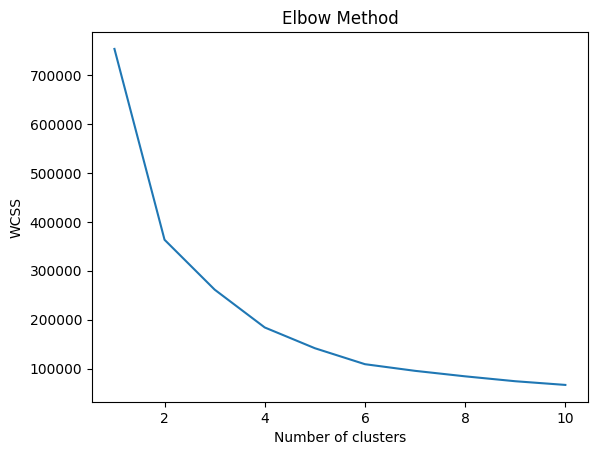

In [ ]:
from sklearn.cluster import KMeans

features = southeast[['Age', 'Purchase Amount (USD)']]

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=500, n_init=10, random_state=0)
    kmeans.fit(features)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

In [ ]:
score = silhouette_score(X_scaled, y_km)

clus_score = pd.DataFrame(columns=["Model", "Silhouette Score"])

new_row = {"Model": "K-Means SS", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=True)

,Model,Silhouette Score
0,K-Means SS,0.417528


In [ ]:
score = silhouette_score(X_scaled_mm, y_km_mm)



new_row = {"Model": "K-Means MM", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=True)

,Model,Silhouette Score
1,K-Means MM,0.417472
0,K-Means SS,0.417528


In [ ]:
X_scaled

array([[ 0.69167508, -0.29002771],
       [-1.09641661, -1.09997161],
       [-1.16027703,  1.58563186],
       ...,
       [ 0.7555355 , -1.48362925],
       [ 0.05307091,  0.39203032],
       [-0.26623118, -1.35574337]])

In [ ]:
y_km

array([2, 1, 0, 2, 1, 2, 1, 0, 1, 2, 3, 2, 0, 1, 3, 0, 1, 2, 1, 1, 0, 0,
       3, 1, 3, 3, 1, 1, 1, 3, 1, 1, 3, 0, 0, 3, 3, 0, 3, 2, 3, 0, 3, 1,
       0, 1, 0, 2, 3, 2, 2, 0, 2, 3, 1, 1, 0, 1, 0, 0, 2, 0, 3, 3, 0, 1,
       1, 0, 1, 1, 3, 1, 3, 2, 2, 3, 1, 0, 1, 0, 2, 1, 3, 0, 3, 2, 0, 2,
       0, 2, 0, 1, 0, 3, 3, 2, 0, 2, 3, 3, 2, 3, 1, 3, 1, 0, 3, 0, 1, 0,
       1, 1, 0, 3, 1, 0, 0, 2, 3, 3, 3, 0, 1, 1, 1, 1, 1, 3, 2, 2, 2, 2,
       1, 0, 0, 1, 3, 1, 2, 3, 2, 2, 1, 2, 3, 1, 3, 2, 1, 3, 2, 3, 2, 3,
       3, 1, 2, 2, 0, 1, 3, 3, 3, 0, 1, 1, 2, 2, 3, 3, 1, 1, 1, 2, 2, 2,
       3, 2, 1, 3, 1, 1, 0, 2, 1, 0, 1, 2, 3, 1, 0, 0, 1, 2, 2, 2, 2, 3,
       3, 0, 3, 1, 2, 1, 2, 1, 2, 3, 0, 2, 1, 2, 3, 0, 1, 1, 3, 1, 0, 3,
       0, 2, 0, 3, 3, 0, 3, 2, 0, 2, 3, 1, 3, 1, 2, 2, 1, 2, 0, 2, 2, 2,
       3, 3, 3, 0, 1, 0, 2, 1, 3, 3, 0, 0, 2, 3, 2, 1, 0, 3, 1, 3, 2, 3,
       0, 3, 3, 1, 3, 2, 2, 3, 2, 0, 1, 2, 2, 3, 3, 3, 2, 3, 1, 3, 2, 3,
       1, 0, 1, 1, 2, 3, 2, 3, 2, 1, 2, 0, 1, 1, 3,

In [ ]:
pd.DataFrame(y_km).value_counts()

1    251
3    238
2    236
0    222
dtype: int64

In [ ]:
kmeans_s = pd.DataFrame(y_km, columns=["KMeans Cluster"])
kmeans_s

,KMeans Cluster
0,2
1,1
2,0
3,2
4,1
...,...
942,2
943,0
944,2
945,3


## Agglomerative Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit model and predict clusters
y_pred = AC.fit_predict(X_scaled)

score = silhouette_score(X_scaled, y_pred)
print(f"Silhouette Score: {score}")

Silhouette Score: 0.33980122685081665


In [ ]:
pd.DataFrame(y_pred
).value_counts()

0    350
1    270
2    221
3    106
dtype: int64

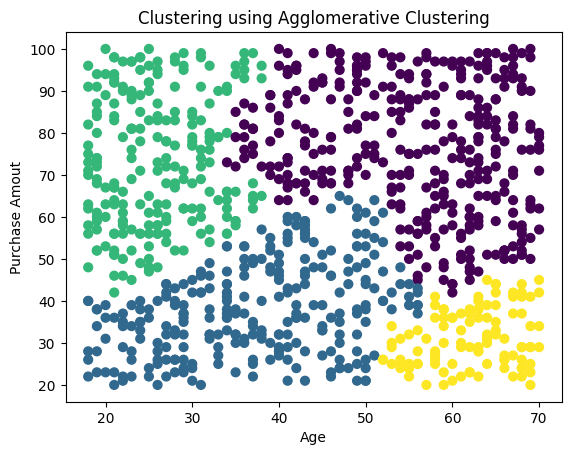

In [ ]:
# Plot clusters
plt.scatter(X["Age"], X["Purchase Amount (USD)"], c=y_pred, s=40, cmap='viridis')
plt.xlabel('Age')
plt.ylabel('Purchase Amout')
plt.title('Clustering using Agglomerative Clustering')
plt.show()

In [ ]:
# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit model and predict clusters
y_pred_mm = AC.fit_predict(X_scaled_mm)

score = silhouette_score(X_scaled_mm, y_pred_mm)
print(f"Silhouette Score: {score}")

Silhouette Score: 0.3832155436501636


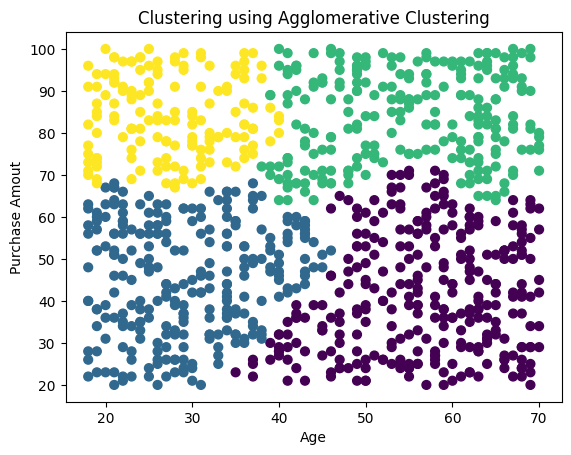

In [ ]:
# Plot clusters
plt.scatter(X["Age"], X["Purchase Amount (USD)"], c=y_pred_mm, s=40, cmap='viridis')
plt.xlabel('Age')
plt.ylabel('Purchase Amout')
plt.title('Clustering using Agglomerative Clustering')
plt.show()

In [ ]:
pd.DataFrame(y_pred_mm
).value_counts()

0    300
1    262
2    236
3    149
dtype: int64

In [ ]:
X.head()

,Age,Purchase Amount (USD)
0,55,53
7,27,34
8,26,97
10,53,34
16,25,36


In [ ]:
y_pred

array([0, 1, 2, 3, 1, 1, 2, 2, 1, 0, 0, 3, 2, 1, 0, 2, 1, 1, 1, 1, 0, 2,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 2, 0, 2, 2, 0, 0, 2, 0, 1, 0, 2, 0, 1,
       2, 1, 0, 3, 0, 3, 0, 2, 0, 0, 1, 1, 2, 1, 2, 2, 1, 0, 0, 0, 2, 1,
       1, 2, 1, 2, 0, 2, 0, 3, 3, 0, 1, 2, 1, 2, 1, 1, 0, 0, 0, 1, 2, 3,
       2, 0, 0, 2, 2, 0, 0, 1, 2, 1, 0, 0, 3, 0, 1, 0, 2, 0, 0, 2, 1, 2,
       2, 1, 0, 0, 1, 0, 2, 3, 0, 0, 0, 0, 2, 1, 2, 1, 1, 0, 1, 3, 3, 3,
       1, 2, 2, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 2, 0, 0, 0, 3, 0,
       0, 2, 3, 1, 2, 1, 0, 0, 0, 0, 2, 1, 3, 3, 0, 0, 1, 1, 1, 3, 0, 3,
       0, 3, 2, 0, 1, 1, 2, 3, 1, 2, 1, 3, 0, 1, 2, 2, 1, 3, 0, 1, 1, 1,
       0, 2, 1, 1, 1, 1, 0, 1, 0, 0, 2, 1, 2, 1, 0, 2, 1, 1, 0, 2, 2, 0,
       2, 1, 0, 0, 0, 2, 1, 1, 0, 3, 0, 1, 0, 1, 0, 1, 2, 3, 0, 0, 3, 3,
       0, 0, 0, 2, 2, 2, 0, 1, 0, 0, 2, 2, 0, 0, 3, 1, 2, 0, 1, 0, 3, 0,
       2, 0, 0, 2, 0, 3, 1, 1, 3, 2, 1, 3, 3, 0, 0, 0, 3, 0, 1, 0, 1, 0,
       1, 2, 1, 1, 0, 0, 3, 0, 0, 1, 3, 2, 2, 1, 0,

In [ ]:
ahc = pd.DataFrame(y_pred, columns=["AHC Cluster"])
ahc

,AHC Cluster
0,0
1,1
2,2
3,3
4,1
...,...
942,0
943,2
944,3
945,0


In [ ]:
score = silhouette_score(X_scaled, y_pred)

new_row = {"Model": "AHC SS", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
0,K-Means SS,0.417528
1,K-Means MM,0.417472
2,AHC SS,0.339801


In [ ]:
score = silhouette_score(X_scaled_mm, y_pred_mm)

new_row = {"Model": "AHC MM", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
0,K-Means SS,0.417528
1,K-Means MM,0.417472
3,AHC MM,0.383216
2,AHC SS,0.339801


# Modeling (Far West)

In [ ]:
farwest = process_data[process_data["Far West"] == 1]

## Preparing

In [ ]:
farwest.head()

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,...,New England,Plains,Rocky Mountain,Southeast,Southwest,Adult,Elder,Middle_Age,Teenager,Young_Adult
4,45,1,1,49,1,1,2.7,1,2,1,...,0,0,0,0,0,0,0,1,0,0
11,30,1,1,68,2,3,4.9,1,5,1,...,0,0,0,0,0,0,0,0,0,1
22,56,1,1,37,1,2,3.2,1,5,1,...,0,0,0,0,0,0,0,1,0,0
26,38,1,0,20,1,1,3.6,1,3,1,...,0,0,0,0,0,1,0,0,0,0
41,67,1,0,39,1,1,4.5,1,4,1,...,0,0,0,0,0,0,1,0,0,0


Target pertama, yaitu hubungan Age dengan Purchase Amount (USD)

In [ ]:
X = farwest[['Age', 'Purchase Amount (USD)']]
X.head()

,Age,Purchase Amount (USD)
4,45,49
11,30,68
22,56,37
26,38,20
41,67,39


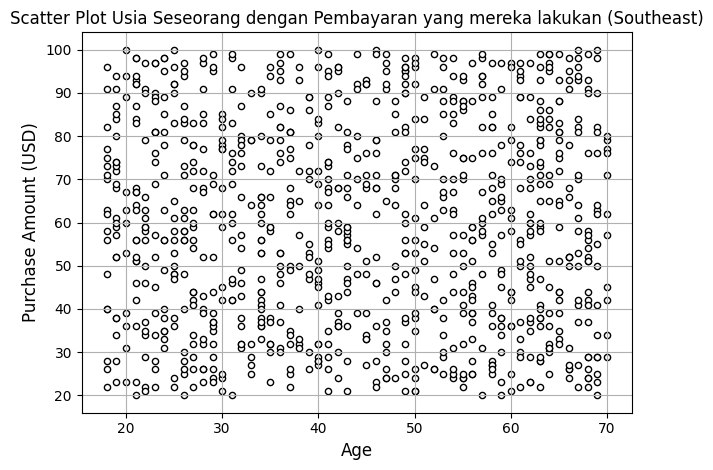

In [ ]:
plt.scatter(southeast['Age'],
            southeast['Purchase Amount (USD)'],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title("Scatter Plot Usia Seseorang dengan Pembayaran yang mereka lakukan (Southeast)")
plt.xlabel("Age", fontsize=12)
plt.ylabel("Purchase Amount (USD)", fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# plt.scatter(X['Review Rating'],
#             X['Purchase Amount (USD)'],
#             c='white',
#             marker='o',
#             edgecolor='black',
#             s=20)
# plt.grid()
# plt.tight_layout()
# plt.show()

In [ ]:
# plt.scatter(X['Region'],
#             X['Purchase Amount (USD)'],
#             c='white',
#             marker='o',
#             edgecolor='black',
#             s=20)
# plt.grid()
# plt.tight_layout()
# plt.show()

In [ ]:
# plt.scatter(X['Frequency of Purchases'],
#             X['Purchase Amount (USD)'],
#             c='white',
#             marker='o',
#             edgecolor='black',
#             s=20)
# plt.grid()
# plt.tight_layout()
# plt.show()

## Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X)

X_scaled = scaler.transform(X)

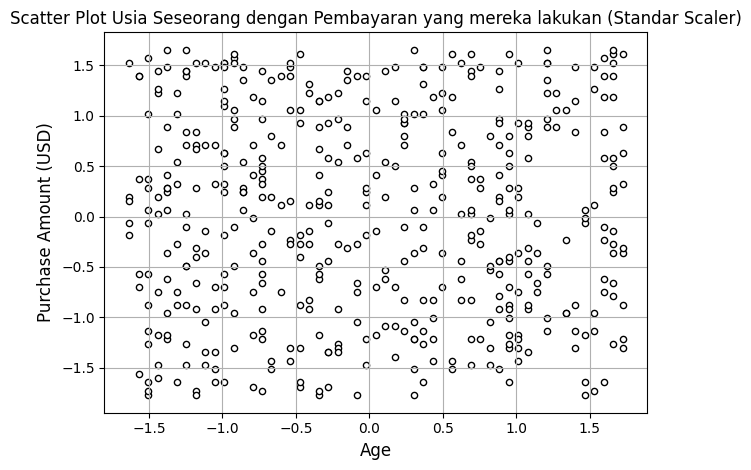

In [ ]:
plt.scatter(X_scaled[:, 0],
            X_scaled[:, 1],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title("Scatter Plot Usia Seseorang dengan Pembayaran yang mereka lakukan (Standar Scaler)")
plt.xlabel("Age", fontsize=12)
plt.ylabel("Purchase Amount (USD)", fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)

X_scaled_mm = scaler.transform(X)

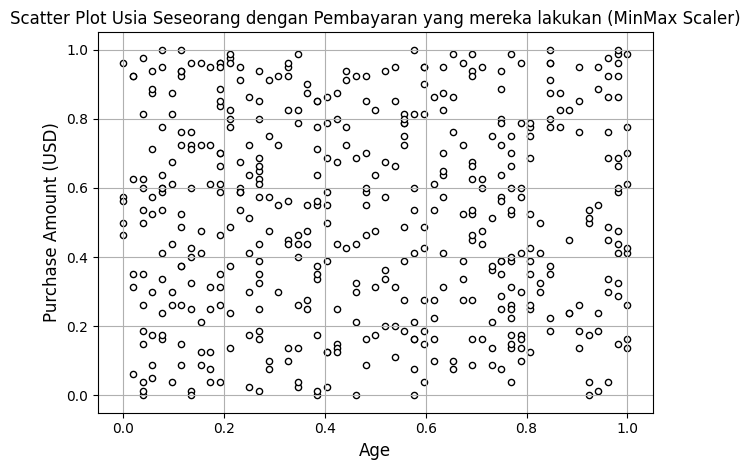

In [ ]:
plt.scatter(X_scaled_mm[:, 0],
            X_scaled_mm[:, 1],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title("Scatter Plot Usia Seseorang dengan Pembayaran yang mereka lakukan (MinMax Scaler)")
plt.xlabel("Age", fontsize=12)
plt.ylabel("Purchase Amount (USD)", fontsize=12)
plt.tight_layout()
plt.show()

## KMeans Clustering

In [ ]:
from sklearn.cluster import KMeans

# n_init : cara inisilisasi
km = KMeans(n_clusters=4, random_state=45, n_init="auto")
km.fit(X_scaled)

y_km = km.predict(X_scaled)

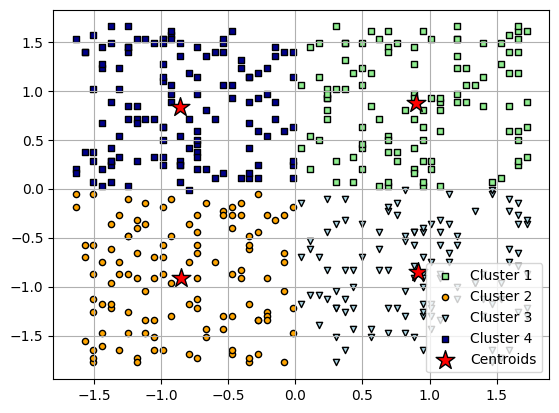

In [ ]:
plt.scatter(X_scaled[y_km == 0, 0],
            X_scaled[y_km == 0, 1],
            s=20,
            c='lightgreen',
            marker='s',
            edgecolor='black',
            label='Cluster 1')

plt.scatter(X_scaled[y_km == 1, 0],
            X_scaled[y_km == 1, 1],
            s=20, c='orange',
            marker='o',
            edgecolor='black',
            label='Cluster 2')

plt.scatter(X_scaled[y_km == 2, 0],
            X_scaled[y_km == 2, 1],
            s=20, c='lightblue',
            marker='v',
            edgecolor='black',
            label='Cluster 3')

plt.scatter(X_scaled[y_km == 3, 0],
            X_scaled[y_km == 3, 1],
            s=20, c='darkblue',
            marker='s',
            edgecolor='black',
            label='Cluster 4')

plt.scatter(km.cluster_centers_[:, 0],
            km.cluster_centers_[:, 1],
            s=200, marker='*',
            c='red',
            edgecolor='black',
            label='Centroids')

plt.legend(scatterpoints=1)
plt.grid()

In [ ]:
from sklearn.cluster import KMeans

# n_init : cara inisilisasi
km_mm = KMeans(n_clusters=3, random_state=45, n_init="auto")
km_mm.fit(X_scaled_mm)

y_km_mm = km.predict(X_scaled_mm)

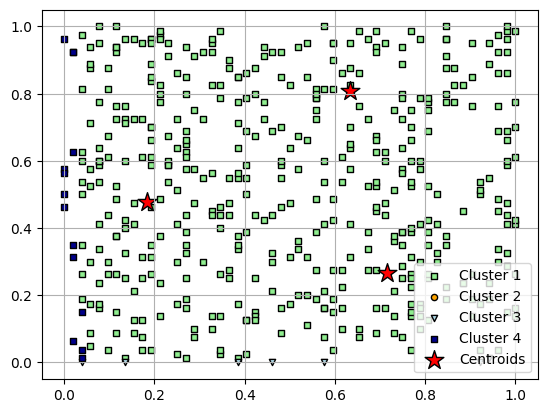

In [ ]:
plt.scatter(X_scaled_mm[y_km_mm == 0, 0],
            X_scaled_mm[y_km_mm == 0, 1],
            s=20,
            c='lightgreen',
            marker='s',
            edgecolor='black',
            label='Cluster 1')

plt.scatter(X_scaled_mm[y_km_mm == 1, 0],
            X_scaled_mm[y_km_mm == 1, 1],
            s=20, c='orange',
            marker='o',
            edgecolor='black',
            label='Cluster 2')

plt.scatter(X_scaled_mm[y_km_mm == 2, 0],
            X_scaled_mm[y_km_mm == 2, 1],
            s=20, c='lightblue',
            marker='v',
            edgecolor='black',
            label='Cluster 3')

plt.scatter(X_scaled_mm[y_km_mm == 3, 0],
            X_scaled_mm[y_km_mm == 3, 1],
            s=20, c='darkblue',
            marker='s',
            edgecolor='black',
            label='Cluster 4')

plt.scatter(km_mm.cluster_centers_[:, 0],
            km_mm.cluster_centers_[:, 1],
            s=200, marker='*',
            c='red',
            edgecolor='black',
            label='Centroids')

plt.legend(scatterpoints=1)
plt.grid()

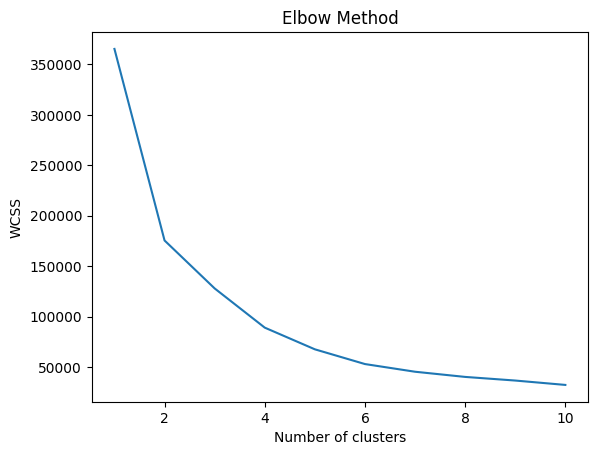

In [ ]:
from sklearn.cluster import KMeans

features = farwest[['Age', 'Purchase Amount (USD)']]

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=500, n_init=10, random_state=0)
    kmeans.fit(features)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

In [ ]:
score = silhouette_score(X_scaled, y_km)

clus_score = pd.DataFrame(columns=["Model", "Silhouette Score"])

new_row = {"Model": "K-Means", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=True)

,Model,Silhouette Score
0,K-Means,0.418934


In [ ]:
score = silhouette_score(X_scaled_mm, y_km_mm)

clus_score_mm = pd.DataFrame(columns=["Model", "Silhouette Score"])

new_row = {"Model": "K-Means", "Silhouette Score": score}
clus_score_mm = pd.concat([clus_score_mm, pd.DataFrame([new_row])], ignore_index=True)

clus_score_mm.sort_values(by="Silhouette Score", ascending=True)

,Model,Silhouette Score
0,K-Means,0.013867


In [ ]:
X_scaled

array([[ 0.10921453, -0.53073878],
       [-0.85957934,  0.2836739 ],
       [ 0.81966337, -1.04510469],
       [-0.34288928, -1.77378972],
       [ 1.53011221, -0.95937704],
       [ 0.88424963, -0.78792174],
       [-0.08454424, -0.27355583],
       [-0.08454424, -1.77378972],
       [ 0.30297331,  1.01235893],
       [-1.24709689, -0.87364939],
       [ 0.23838705,  0.92663128],
       [ 0.94883589,  0.6265845 ],
       [-0.21371676, -0.91651321],
       [ 0.04462827,  1.05522276],
       [ 0.36755956, -0.31641966],
       [-1.50544193, -1.25942382],
       [-0.53664805,  1.48386101],
       [ 0.69049086,  0.54085685],
       [-1.05333812, -1.34515147],
       [-1.18251063, -0.65933026],
       [-0.73040683, -1.21655999],
       [-0.34288928,  1.14095041],
       [ 1.53011221,  0.1122186 ],
       [-0.85957934,  1.35526954],
       [-1.24709689, -0.48787496],
       [-0.98875186, -0.70219408],
       [-0.73040683,  1.14095041],
       [ 0.69049086, -1.47374294],
       [ 0.6259046 ,

In [ ]:
y_km

array([2, 3, 2, 1, 2, 2, 1, 1, 0, 1, 0, 0, 1, 0, 2, 1, 3, 0, 1, 1, 1, 3,
       0, 3, 1, 1, 3, 2, 2, 3, 2, 3, 1, 2, 0, 1, 3, 1, 2, 3, 3, 1, 1, 0,
       0, 2, 0, 3, 2, 3, 3, 1, 0, 1, 3, 3, 2, 0, 1, 3, 1, 2, 3, 3, 3, 1,
       1, 0, 0, 2, 3, 3, 2, 2, 0, 3, 1, 1, 1, 3, 1, 0, 0, 1, 1, 0, 0, 2,
       2, 0, 3, 3, 3, 3, 1, 2, 0, 0, 2, 3, 3, 1, 1, 1, 2, 2, 1, 3, 0, 0,
       0, 1, 0, 2, 2, 3, 0, 0, 2, 0, 3, 3, 2, 2, 2, 3, 1, 0, 2, 1, 0, 2,
       2, 3, 1, 3, 3, 0, 2, 0, 0, 3, 2, 3, 1, 0, 0, 3, 1, 1, 0, 0, 2, 2,
       2, 2, 2, 0, 0, 2, 1, 2, 3, 3, 2, 2, 3, 3, 0, 2, 1, 1, 2, 1, 0, 2,
       0, 1, 3, 1, 1, 0, 1, 1, 0, 3, 1, 1, 0, 0, 1, 2, 2, 3, 0, 1, 0, 3,
       3, 2, 0, 1, 3, 0, 3, 0, 1, 1, 3, 3, 3, 1, 2, 1, 1, 3, 1, 3, 2, 3,
       2, 2, 1, 0, 0, 0, 3, 3, 1, 3, 1, 1, 1, 3, 2, 0, 3, 3, 3, 2, 0, 3,
       2, 3, 1, 2, 3, 2, 1, 2, 3, 3, 3, 2, 2, 3, 3, 1, 1, 3, 2, 3, 1, 1,
       3, 3, 1, 0, 3, 3, 0, 3, 0, 1, 3, 3, 0, 0, 0, 2, 3, 3, 2, 0, 0, 1,
       3, 3, 3, 0, 2, 1, 1, 2, 1, 1, 1, 0, 0, 1, 2,

In [ ]:
pd.DataFrame(y_km).value_counts()

3    127
2    116
1    113
0    110
dtype: int64

In [ ]:
kmeans_s = pd.DataFrame(y_km, columns=["KMeans Cluster"])
kmeans_s

,KMeans Cluster
0,2
1,3
2,2
3,1
4,2
...,...
461,2
462,2
463,3
464,0


## Agglomerative Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit model and predict clusters
y_pred = AC.fit_predict(X_scaled)

score = silhouette_score(X_scaled, y_pred)
print(f"Silhouette Score: {score}")

Silhouette Score: 0.3825454678186308


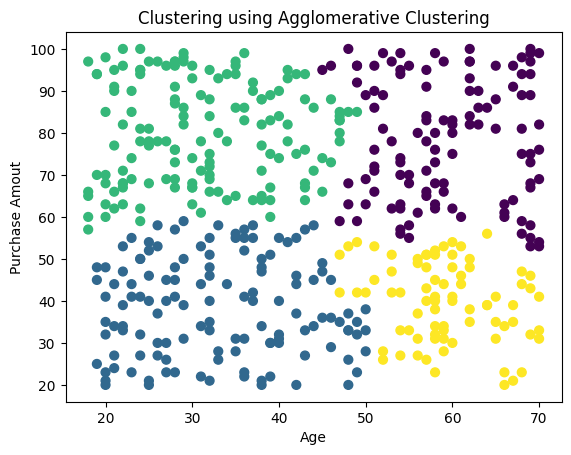

In [ ]:
# Plot clusters
plt.scatter(X["Age"], X["Purchase Amount (USD)"], c=y_pred, s=40, cmap='viridis')
plt.xlabel('Age')
plt.ylabel('Purchase Amout')
plt.title('Clustering using Agglomerative Clustering')
plt.show()

In [ ]:
# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit model and predict clusters
y_pred_mm = AC.fit_predict(X_scaled_mm)

score = silhouette_score(X_scaled_mm, y_pred_mm)
print(f"Silhouette Score: {score}")

Silhouette Score: 0.37630905770941303


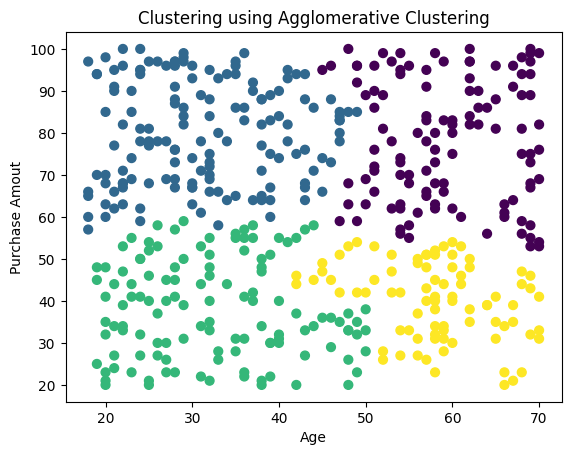

In [ ]:
# Plot clusters
plt.scatter(X["Age"], X["Purchase Amount (USD)"], c=y_pred_mm, s=40, cmap='viridis')
plt.xlabel('Age')
plt.ylabel('Purchase Amout')
plt.title('Clustering using Agglomerative Clustering')
plt.show()

In [ ]:
X.head()

,Age,Purchase Amount (USD)
4,45,49
11,30,68
22,56,37
26,38,20
41,67,39


In [ ]:
y_pred

array([1, 2, 3, 1, 3, 3, 1, 1, 2, 1, 2, 0, 1, 2, 3, 1, 2, 0, 1, 1, 1, 2,
       0, 2, 1, 1, 2, 3, 3, 2, 3, 2, 1, 1, 0, 2, 2, 1, 3, 2, 2, 1, 1, 0,
       0, 3, 0, 2, 3, 2, 2, 1, 0, 1, 2, 2, 1, 0, 1, 2, 1, 3, 2, 2, 2, 1,
       2, 0, 0, 3, 2, 2, 3, 3, 0, 2, 1, 1, 1, 2, 1, 0, 2, 2, 2, 0, 2, 3,
       1, 0, 2, 2, 2, 2, 1, 3, 0, 0, 3, 2, 2, 1, 1, 1, 0, 3, 1, 2, 0, 0,
       0, 1, 0, 3, 3, 2, 0, 0, 1, 0, 2, 2, 1, 3, 0, 2, 1, 2, 3, 1, 0, 0,
       3, 2, 1, 2, 2, 0, 1, 0, 0, 2, 3, 2, 1, 0, 0, 2, 1, 1, 0, 0, 3, 3,
       3, 3, 0, 2, 0, 3, 1, 3, 2, 2, 0, 3, 2, 2, 0, 0, 1, 1, 0, 1, 0, 3,
       0, 1, 2, 1, 1, 0, 1, 1, 0, 2, 1, 1, 0, 0, 1, 3, 3, 2, 0, 1, 0, 2,
       2, 3, 0, 1, 2, 2, 2, 0, 1, 1, 2, 2, 2, 1, 3, 1, 1, 2, 1, 2, 3, 2,
       3, 3, 1, 0, 0, 0, 2, 2, 1, 2, 1, 1, 1, 2, 3, 0, 2, 2, 2, 3, 0, 2,
       0, 2, 1, 3, 2, 3, 1, 3, 2, 2, 2, 1, 3, 2, 2, 1, 1, 2, 3, 2, 1, 1,
       2, 2, 1, 0, 2, 2, 0, 2, 0, 1, 2, 2, 0, 2, 0, 3, 2, 2, 3, 0, 0, 2,
       2, 2, 2, 0, 0, 1, 1, 3, 1, 1, 1, 0, 0, 1, 1,

In [ ]:
ahc = pd.DataFrame(y_pred, columns=["AHC Cluster"])
ahc

,AHC Cluster
0,1
1,2
2,3
3,1
4,3
...,...
461,3
462,0
463,2
464,0


In [ ]:
new_row = {"Model": "AHC_4", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
0,K-Means,0.418934
1,AHC_4,0.376309


# Modeling (Southwest)

In [ ]:
southwest = process_data[process_data["Southwest"] == 1]

## Preparing

In [ ]:
southwest.head()

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,...,New England,Plains,Rocky Mountain,Southeast,Southwest,Adult,Elder,Middle_Age,Teenager,Young_Adult
23,31,1,1,88,3,3,4.4,1,1,1,...,0,0,0,0,1,1,0,0,0,0
25,18,1,1,25,1,2,3.6,1,1,1,...,0,0,0,0,1,0,0,0,1,0
39,70,1,1,60,2,2,4.2,1,1,1,...,0,0,0,0,1,0,1,0,0,0
54,47,1,3,94,1,2,4.2,1,3,1,...,0,0,0,0,1,0,0,1,0,0
61,55,1,0,68,1,3,4.7,1,5,1,...,0,0,0,0,1,0,0,1,0,0


Target pertama, yaitu hubungan Age dengan Purchase Amount (USD)

In [ ]:
X = southwest[['Age', 'Purchase Amount (USD)']]
X.head()

,Age,Purchase Amount (USD)
23,31,88
25,18,25
39,70,60
54,47,94
61,55,68


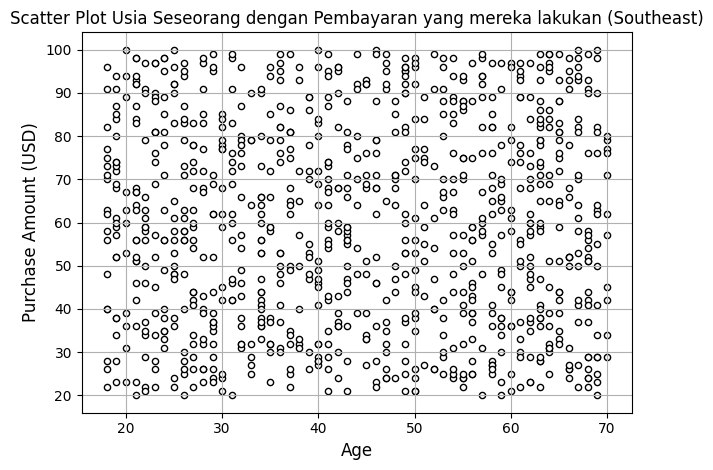

In [ ]:
plt.scatter(southeast['Age'],
            southeast['Purchase Amount (USD)'],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title("Scatter Plot Usia Seseorang dengan Pembayaran yang mereka lakukan (Southeast)")
plt.xlabel("Age", fontsize=12)
plt.ylabel("Purchase Amount (USD)", fontsize=12)
plt.tight_layout()
plt.show()

## Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X)

X_scaled = scaler.transform(X)

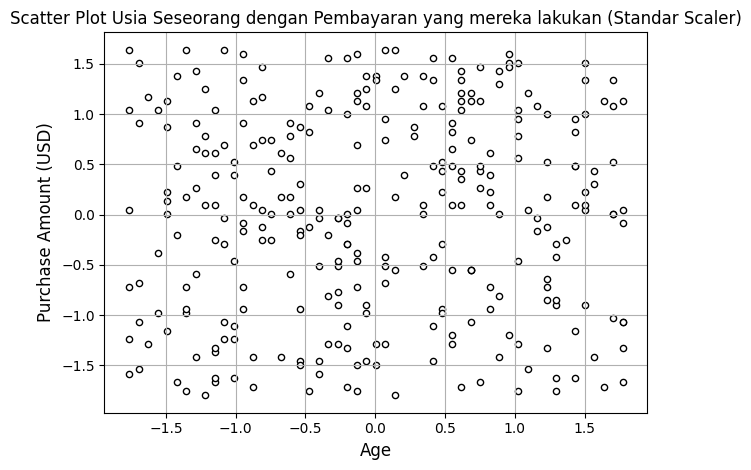

In [ ]:
plt.scatter(X_scaled[:, 0],
            X_scaled[:, 1],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title("Scatter Plot Usia Seseorang dengan Pembayaran yang mereka lakukan (Standar Scaler)")
plt.xlabel("Age", fontsize=12)
plt.ylabel("Purchase Amount (USD)", fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)

X_scaled_mm = scaler.transform(X)

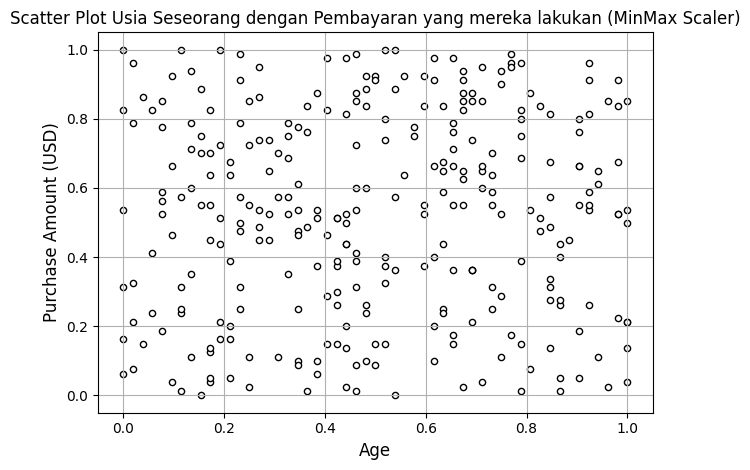

In [ ]:
plt.scatter(X_scaled_mm[:, 0],
            X_scaled_mm[:, 1],
            c='white',
            marker='o',
            edgecolor='black',
            s=20)
plt.grid()
plt.title("Scatter Plot Usia Seseorang dengan Pembayaran yang mereka lakukan (MinMax Scaler)")
plt.xlabel("Age", fontsize=12)
plt.ylabel("Purchase Amount (USD)", fontsize=12)
plt.tight_layout()
plt.show()

## KMeans Clustering

In [ ]:
from sklearn.cluster import KMeans

# n_init : cara inisilisasi
km = KMeans(n_clusters=4, random_state=45, n_init="auto")
km.fit(X_scaled)

y_km = km.predict(X_scaled)

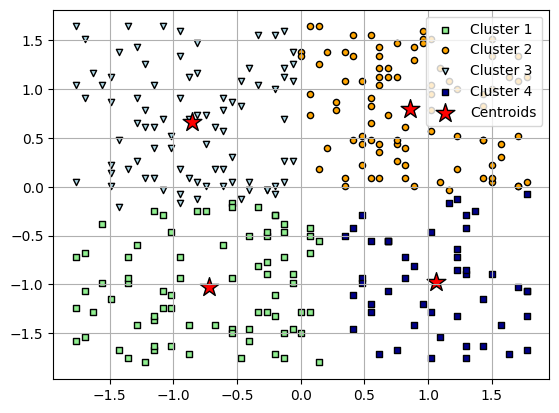

In [ ]:
plt.scatter(X_scaled[y_km == 0, 0],
            X_scaled[y_km == 0, 1],
            s=20,
            c='lightgreen',
            marker='s',
            edgecolor='black',
            label='Cluster 1')

plt.scatter(X_scaled[y_km == 1, 0],
            X_scaled[y_km == 1, 1],
            s=20, c='orange',
            marker='o',
            edgecolor='black',
            label='Cluster 2')

plt.scatter(X_scaled[y_km == 2, 0],
            X_scaled[y_km == 2, 1],
            s=20, c='lightblue',
            marker='v',
            edgecolor='black',
            label='Cluster 3')

plt.scatter(X_scaled[y_km == 3, 0],
            X_scaled[y_km == 3, 1],
            s=20, c='darkblue',
            marker='s',
            edgecolor='black',
            label='Cluster 4')

plt.scatter(km.cluster_centers_[:, 0],
            km.cluster_centers_[:, 1],
            s=200, marker='*',
            c='red',
            edgecolor='black',
            label='Centroids')

plt.legend(scatterpoints=1)
plt.grid()

In [ ]:
from sklearn.cluster import KMeans

# n_init : cara inisilisasi
km_mm = KMeans(n_clusters=4, random_state=45, n_init="auto")
km_mm.fit(X_scaled_mm)

y_km_mm = km.predict(X_scaled_mm)

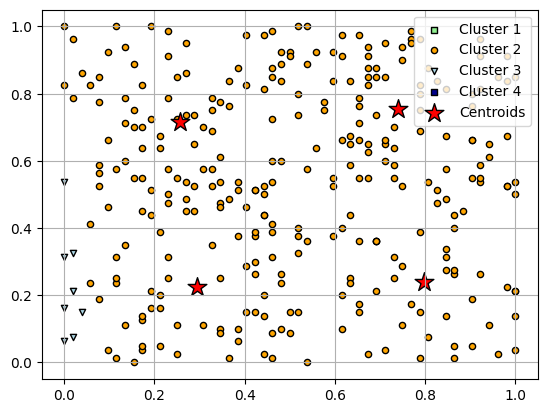

In [ ]:
plt.scatter(X_scaled_mm[y_km_mm == 0, 0],
            X_scaled_mm[y_km_mm == 0, 1],
            s=20,
            c='lightgreen',
            marker='s',
            edgecolor='black',
            label='Cluster 1')

plt.scatter(X_scaled_mm[y_km_mm == 1, 0],
            X_scaled_mm[y_km_mm == 1, 1],
            s=20, c='orange',
            marker='o',
            edgecolor='black',
            label='Cluster 2')

plt.scatter(X_scaled_mm[y_km_mm == 2, 0],
            X_scaled_mm[y_km_mm == 2, 1],
            s=20, c='lightblue',
            marker='v',
            edgecolor='black',
            label='Cluster 3')

plt.scatter(X_scaled_mm[y_km_mm == 3, 0],
            X_scaled_mm[y_km_mm == 3, 1],
            s=20, c='darkblue',
            marker='s',
            edgecolor='black',
            label='Cluster 4')

plt.scatter(km_mm.cluster_centers_[:, 0],
            km_mm.cluster_centers_[:, 1],
            s=200, marker='*',
            c='red',
            edgecolor='black',
            label='Centroids')

plt.legend(scatterpoints=1)
plt.grid()

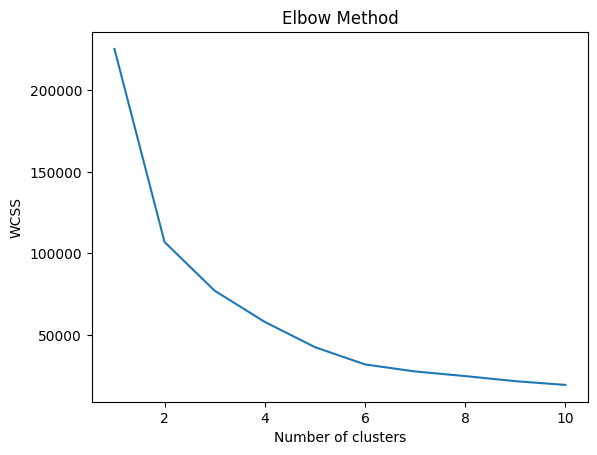

In [ ]:
from sklearn.cluster import KMeans

features = southwest[['Age', 'Purchase Amount (USD)']]

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=500, n_init=10, random_state=0)
    kmeans.fit(features)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

In [ ]:
score = silhouette_score(X_scaled, y_km)

clus_score = pd.DataFrame(columns=["Model", "Silhouette Score"])

new_row = {"Model": "K-Means", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=True)

,Model,Silhouette Score
0,K-Means,0.392687


In [ ]:
score = silhouette_score(X_scaled_mm, y_km_mm)

clus_score_mm = pd.DataFrame(columns=["Model", "Silhouette Score"])

new_row = {"Model": "K-Means", "Silhouette Score": score}
clus_score_mm = pd.concat([clus_score_mm, pd.DataFrame([new_row])], ignore_index=True)

clus_score_mm.sort_values(by="Silhouette Score", ascending=True)

,Model,Silhouette Score
0,K-Means,0.183892


In [ ]:
X_scaled

array([[-0.87970538,  1.1252192 ],
       [-1.76420542, -1.58448645],
       [ 1.77379473, -0.07909442],
       [ 0.20891005,  1.3832864 ],
       [ 0.75321776,  0.26499518],
       [-0.74362845,  0.73811839],
       [-0.53951306, -0.93931844],
       [ 0.54910237, -1.28340805],
       [ 0.61714084,  1.4262976 ],
       [ 1.16144855,  1.082208  ],
       [ 0.48106391,  0.22198398],
       [-0.94774384, -0.16511682],
       [-0.06324381,  1.3832864 ],
       [-0.19932074,  1.55533121],
       [-1.15185924, -1.67050885],
       [ 0.61714084,  1.0391968 ],
       [-1.35597463,  1.64135361],
       [-0.60755152, -0.59522883],
       [-0.33539766, -0.20812803],
       [-1.01578231,  0.52306239],
       [-1.69616695,  0.9101632 ],
       [ 0.54910237,  0.48005119],
       [-0.40343613, -0.03608322],
       [-0.81166692, -0.12210562],
       [ 0.34498698, -0.50920643],
       [-0.47147459,  1.082208  ],
       [-1.15185924,  0.39402879],
       [ 0.61714084,  0.09295038],
       [-1.35597463,

In [ ]:
y_km

array([2, 0, 3, 1, 1, 2, 0, 3, 1, 1, 1, 2, 2, 2, 0, 1, 2, 0, 0, 2, 2, 1,
       2, 2, 3, 2, 2, 1, 0, 3, 2, 0, 3, 0, 2, 1, 2, 2, 0, 2, 2, 1, 0, 3,
       2, 1, 3, 1, 0, 2, 2, 2, 1, 1, 1, 0, 2, 0, 2, 1, 0, 1, 1, 2, 2, 2,
       2, 2, 3, 0, 2, 0, 3, 3, 2, 0, 0, 1, 0, 2, 0, 2, 1, 1, 1, 2, 1, 3,
       0, 2, 2, 2, 2, 2, 3, 0, 1, 3, 2, 0, 0, 0, 0, 2, 2, 3, 0, 0, 1, 0,
       3, 3, 2, 2, 2, 2, 1, 3, 2, 3, 0, 3, 2, 3, 1, 1, 1, 3, 2, 1, 1, 0,
       3, 0, 0, 2, 1, 1, 0, 1, 1, 1, 3, 1, 0, 1, 1, 0, 0, 2, 0, 2, 2, 1,
       3, 2, 1, 2, 3, 3, 3, 3, 1, 0, 0, 1, 1, 2, 1, 2, 0, 1, 2, 1, 2, 1,
       2, 1, 2, 3, 0, 0, 3, 0, 3, 2, 3, 1, 1, 0, 1, 1, 2, 0, 1, 2, 0, 1,
       1, 0, 3, 3, 2, 3, 2, 2, 3, 1, 3, 3, 0, 1, 0, 2, 2, 3, 1, 2, 3, 2,
       1, 2, 0, 3, 0, 1, 1, 2, 0, 0, 0, 1, 0, 2, 3, 3, 1, 0, 0, 1, 1, 3,
       0, 1, 1, 1, 0, 1, 0, 1, 2, 0, 0, 1, 0, 2, 1, 0, 2, 0, 0, 0, 0, 0,
       1, 3, 1, 1, 0, 2, 1, 2, 1, 0, 2, 2, 1, 1, 0, 3, 3, 1, 1, 1, 2, 1,
       2, 0, 3, 1, 2, 0, 3, 1, 1, 0, 2, 1], dtype=i

In [ ]:
pd.DataFrame(y_km).value_counts()

1    88
2    85
0    76
3    49
dtype: int64

In [ ]:
kmeans_s = pd.DataFrame(y_km, columns=["KMeans Cluster"])
kmeans_s

,KMeans Cluster
0,2
1,0
2,3
3,1
4,1
...,...
293,1
294,1
295,0
296,2


## Agglomerative Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit model and predict clusters
y_pred = AC.fit_predict(X_scaled)

score = silhouette_score(X_scaled, y_pred)
print(f"Silhouette Score: {score}")

Silhouette Score: 0.3845087874935768


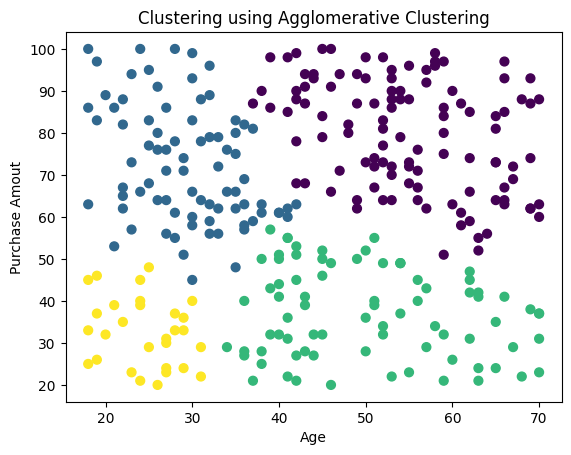

In [ ]:
# Plot clusters
plt.scatter(X["Age"], X["Purchase Amount (USD)"], c=y_pred, s=40, cmap='viridis')
plt.xlabel('Age')
plt.ylabel('Purchase Amout')
plt.title('Clustering using Agglomerative Clustering')
plt.show()

In [ ]:
# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit model and predict clusters
y_pred_mm = AC.fit_predict(X_scaled_mm)

score = silhouette_score(X_scaled_mm, y_pred_mm)
print(f"Silhouette Score: {score}")

Silhouette Score: 0.379329186838263


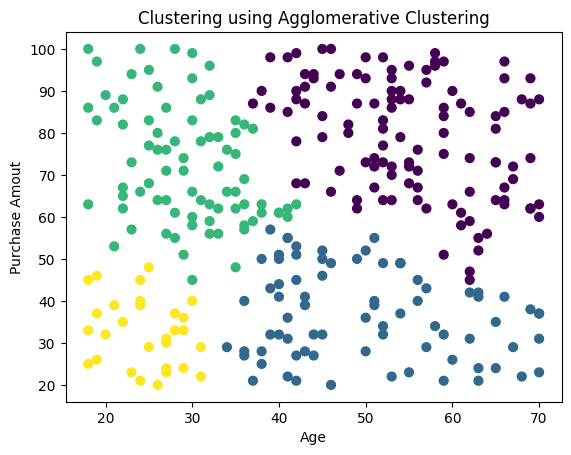

In [ ]:
# Plot clusters
plt.scatter(X["Age"], X["Purchase Amount (USD)"], c=y_pred_mm, s=40, cmap='viridis')
plt.xlabel('Age')
plt.ylabel('Purchase Amout')
plt.title('Clustering using Agglomerative Clustering')
plt.show()

In [ ]:
X.head()

,Age,Purchase Amount (USD)
23,31,88
25,18,25
39,70,60
54,47,94
61,55,68


In [ ]:
y_pred

array([1, 3, 0, 0, 0, 1, 2, 2, 0, 0, 0, 1, 0, 0, 3, 0, 1, 1, 2, 1, 1, 0,
       1, 1, 2, 0, 1, 0, 3, 2, 0, 3, 2, 2, 1, 0, 1, 1, 2, 1, 1, 0, 3, 2,
       1, 0, 2, 0, 2, 1, 1, 1, 0, 0, 0, 2, 0, 3, 0, 0, 3, 0, 0, 1, 1, 1,
       1, 1, 2, 2, 1, 3, 2, 2, 0, 3, 1, 0, 3, 1, 3, 1, 0, 0, 0, 1, 0, 0,
       2, 1, 1, 0, 1, 1, 2, 2, 0, 2, 1, 1, 2, 2, 3, 1, 1, 2, 2, 3, 0, 2,
       2, 2, 1, 1, 1, 1, 0, 2, 1, 2, 2, 2, 1, 2, 0, 0, 0, 2, 1, 0, 0, 3,
       0, 2, 3, 0, 0, 0, 3, 0, 0, 0, 2, 0, 3, 0, 0, 2, 3, 1, 2, 1, 1, 0,
       2, 1, 0, 0, 2, 2, 2, 2, 0, 3, 1, 0, 0, 1, 0, 1, 2, 0, 1, 0, 1, 0,
       1, 0, 1, 0, 2, 2, 2, 2, 2, 1, 2, 0, 0, 2, 0, 0, 1, 2, 0, 1, 1, 0,
       0, 2, 2, 2, 1, 2, 1, 0, 2, 0, 2, 0, 3, 0, 2, 1, 1, 2, 0, 0, 0, 0,
       0, 1, 2, 2, 2, 0, 0, 0, 2, 2, 3, 0, 3, 1, 2, 2, 0, 2, 2, 0, 0, 2,
       1, 0, 0, 0, 2, 0, 1, 0, 1, 1, 2, 0, 3, 1, 0, 2, 1, 3, 2, 3, 1, 3,
       0, 2, 0, 0, 1, 1, 0, 1, 0, 3, 1, 1, 0, 0, 3, 2, 2, 0, 0, 0, 1, 0,
       0, 3, 0, 0, 1, 2, 2, 0, 0, 2, 1, 0])

In [ ]:
ahc = pd.DataFrame(y_pred, columns=["AHC Cluster"])
ahc

,AHC Cluster
0,1
1,3
2,0
3,0
4,0
...,...
293,0
294,0
295,2
296,1


In [ ]:
new_row = {"Model": "AHC_4", "Silhouette Score": score}
clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

clus_score.sort_values(by="Silhouette Score", ascending=False)

,Model,Silhouette Score
0,K-Means,0.392687
1,AHC_4,0.379329


# Pickle

In [ ]:
import pickle

# save the model to disk
filename = 'final_model.pkl'
pickle.dump(km, open(filename, 'wb'))